In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_absolute_percentage_error as mape
from sklearn.metrics import r2_score

In [2]:
df = pd.read_csv("../../../../estsoft/data/train.csv")

# Preprocessing

### Fill Null


In [3]:
def fill_null(df:pd.DataFrame, time_before:list, time:list, time_after:list):
    df_fill = pd.DataFrame()
    for i in range(len(time_before)):
        df_null = df[df['datetime']==time[i]]
        df_concat = pd.concat([df[df['datetime']==time_before[i]], df[df['datetime']==time_after[i]]])

        # null값의 앞뒤 시간의 평균값 계산 및 저장
        ab_mean = pd.DataFrame(df_concat.groupby(['prediction_unit_id'])['target'].sum()/2).reset_index()
        df_merge = pd.merge(df_null, ab_mean, how='left', on='prediction_unit_id').drop(columns='target_x').rename(columns={'target_y':'target'})
        df_fill = pd.concat([df_fill, df_merge])

        # null값이 있는 행 drop
        df = df.drop(df_null.index)

    df = pd.concat([df, df_fill]).reset_index(drop=True).sort_values(by='datetime')
    return df

In [4]:
df_prod =df[df['is_consumption']==0]
df_cons = df[df['is_consumption']==1]

time_before = ['2022-10-30 02:00:00', '2022-03-27 02:00:00', '2023-03-26 02:00:00', '2021-10-31 02:00:00']
time = ['2022-10-30 03:00:00', '2022-03-27 03:00:00', '2023-03-26 03:00:00', '2021-10-31 03:00:00']
time_after = ['2022-10-30 04:00:00', '2022-03-27 04:00:00', '2023-03-26 04:00:00', '2021-10-31 04:00:00']

df_prod = fill_null(df_prod, time_before, time, time_after)
df_cons = fill_null(df_cons, time_before, time, time_after)

### Index 지정

In [5]:
df_prod['datetime'] = pd.to_datetime(df_prod['datetime'])
print(df_prod.info())
df_prod.set_index('datetime', drop=True, inplace=True) 
df_cons['datetime'] = pd.to_datetime(df_cons['datetime'])
print(df_cons.info())
df_cons.set_index('datetime', drop=True, inplace=True)

<class 'pandas.core.frame.DataFrame'>
Index: 1009176 entries, 0 to 1008853
Data columns (total 9 columns):
 #   Column              Non-Null Count    Dtype         
---  ------              --------------    -----         
 0   county              1009176 non-null  int64         
 1   is_business         1009176 non-null  int64         
 2   product_type        1009176 non-null  int64         
 3   target              1009176 non-null  float64       
 4   is_consumption      1009176 non-null  int64         
 5   datetime            1009176 non-null  datetime64[ns]
 6   data_block_id       1009176 non-null  int64         
 7   row_id              1009176 non-null  int64         
 8   prediction_unit_id  1009176 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(7)
memory usage: 77.0 MB
None
<class 'pandas.core.frame.DataFrame'>
Index: 1009176 entries, 0 to 1008853
Data columns (total 9 columns):
 #   Column              Non-Null Count    Dtype         
---  ------    

### df 분리

In [6]:
# f"df_prod{n}"
df_prod_list = []
for id in df_prod['prediction_unit_id'].unique():
    exec(f"df_prod{id} = df_prod[df_prod['prediction_unit_id']=={id}]")
    exec(f"df_prod_list.append('df_prod{id}')")

print(df_prod_list)
print(len(df_prod_list))

# f"df_cons{n}"
df_cons_list = []
for id in df_cons['prediction_unit_id'].unique():
    exec(f"df_cons{id} = df_cons[df_cons['prediction_unit_id']=={id}]")
    exec(f"df_cons_list.append('df_cons{id}')")

print(df_cons_list)
print(len(df_cons_list))

['df_prod0', 'df_prod33', 'df_prod34', 'df_prod35', 'df_prod36', 'df_prod37', 'df_prod38', 'df_prod39', 'df_prod40', 'df_prod41', 'df_prod42', 'df_prod43', 'df_prod44', 'df_prod46', 'df_prod47', 'df_prod48', 'df_prod49', 'df_prod50', 'df_prod51', 'df_prod52', 'df_prod53', 'df_prod54', 'df_prod55', 'df_prod56', 'df_prod57', 'df_prod58', 'df_prod59', 'df_prod60', 'df_prod32', 'df_prod31', 'df_prod45', 'df_prod29', 'df_prod30', 'df_prod2', 'df_prod3', 'df_prod4', 'df_prod5', 'df_prod6', 'df_prod7', 'df_prod8', 'df_prod9', 'df_prod10', 'df_prod11', 'df_prod12', 'df_prod13', 'df_prod14', 'df_prod1', 'df_prod28', 'df_prod27', 'df_prod26', 'df_prod25', 'df_prod15', 'df_prod23', 'df_prod22', 'df_prod24', 'df_prod20', 'df_prod19', 'df_prod18', 'df_prod17', 'df_prod16', 'df_prod21', 'df_prod63', 'df_prod61', 'df_prod62', 'df_prod64', 'df_prod66', 'df_prod65', 'df_prod67', 'df_prod68']
69
['df_cons0', 'df_cons33', 'df_cons34', 'df_cons35', 'df_cons36', 'df_cons37', 'df_cons38', 'df_cons39', 'df_c

### df_prod - df_cons

In [60]:
df_pc_list = []
for id in df_prod['prediction_unit_id'].unique():
    exec(f"diff{id} = pd.DataFrame(df_prod{id}.target - df_cons{id}.target)")
    exec(f"df_pc{id}=pd.DataFrame()")
    exec(f"df_pc{id}['diff'] = df_prod{id}.target - df_cons{id}.target")
    exec(f"df_for_merge = df_prod{id}[['data_block_id', 'prediction_unit_id']]")
    exec(f"df_pc{id} = pd.concat([diff{id}, df_for_merge], axis=1)")
    exec(f"df_pc_list.append('df_pc{id}')")

print(df_pc_list)

['df_pc0', 'df_pc33', 'df_pc34', 'df_pc35', 'df_pc36', 'df_pc37', 'df_pc38', 'df_pc39', 'df_pc40', 'df_pc41', 'df_pc42', 'df_pc43', 'df_pc44', 'df_pc46', 'df_pc47', 'df_pc48', 'df_pc49', 'df_pc50', 'df_pc51', 'df_pc52', 'df_pc53', 'df_pc54', 'df_pc55', 'df_pc56', 'df_pc57', 'df_pc58', 'df_pc59', 'df_pc60', 'df_pc32', 'df_pc31', 'df_pc45', 'df_pc29', 'df_pc30', 'df_pc2', 'df_pc3', 'df_pc4', 'df_pc5', 'df_pc6', 'df_pc7', 'df_pc8', 'df_pc9', 'df_pc10', 'df_pc11', 'df_pc12', 'df_pc13', 'df_pc14', 'df_pc1', 'df_pc28', 'df_pc27', 'df_pc26', 'df_pc25', 'df_pc15', 'df_pc23', 'df_pc22', 'df_pc24', 'df_pc20', 'df_pc19', 'df_pc18', 'df_pc17', 'df_pc16', 'df_pc21', 'df_pc63', 'df_pc61', 'df_pc62', 'df_pc64', 'df_pc66', 'df_pc65', 'df_pc67', 'df_pc68']


In [61]:
df_pc0

,target,data_block_id,prediction_unit_id
datetime,,,
2021-09-01 00:00:00,-95.877,0,0
2021-09-01 01:00:00,-76.559,0,0
2021-09-01 02:00:00,-91.104,0,0
2021-09-01 03:00:00,-87.459,0,0
2021-09-01 04:00:00,-88.035,0,0
...,...,...,...
2023-05-31 19:00:00,139.514,637,0
2023-05-31 20:00:00,-322.484,637,0
2023-05-31 21:00:00,-546.873,637,0


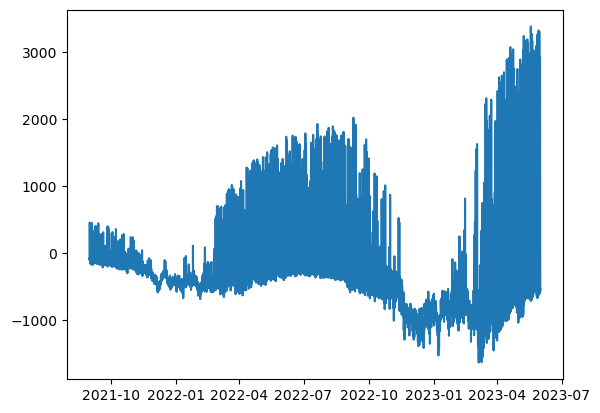

In [9]:
plt.plot(df_prod0.target - df_cons0.target)

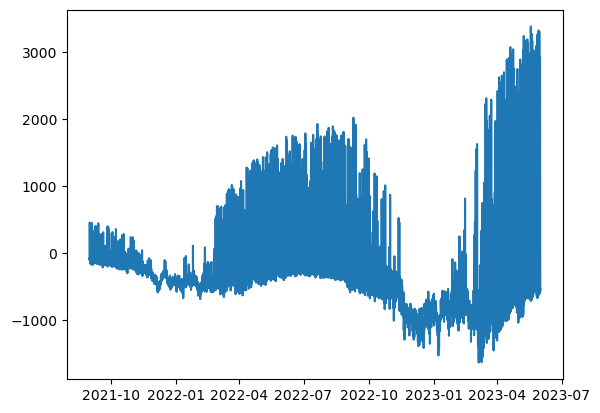

In [10]:
plt.plot(df_pc0.target)

### df_cons - df_prod

In [11]:
df_cp_list = []
for id in df_prod['prediction_unit_id'].unique():
    exec(f"df_cp{id} = df_cons{id} - df_prod{id}")
    exec(f"df_cp_list.append('df_cp{id}')")

print(df_cp_list)

['df_cp0', 'df_cp33', 'df_cp34', 'df_cp35', 'df_cp36', 'df_cp37', 'df_cp38', 'df_cp39', 'df_cp40', 'df_cp41', 'df_cp42', 'df_cp43', 'df_cp44', 'df_cp46', 'df_cp47', 'df_cp48', 'df_cp49', 'df_cp50', 'df_cp51', 'df_cp52', 'df_cp53', 'df_cp54', 'df_cp55', 'df_cp56', 'df_cp57', 'df_cp58', 'df_cp59', 'df_cp60', 'df_cp32', 'df_cp31', 'df_cp45', 'df_cp29', 'df_cp30', 'df_cp2', 'df_cp3', 'df_cp4', 'df_cp5', 'df_cp6', 'df_cp7', 'df_cp8', 'df_cp9', 'df_cp10', 'df_cp11', 'df_cp12', 'df_cp13', 'df_cp14', 'df_cp1', 'df_cp28', 'df_cp27', 'df_cp26', 'df_cp25', 'df_cp15', 'df_cp23', 'df_cp22', 'df_cp24', 'df_cp20', 'df_cp19', 'df_cp18', 'df_cp17', 'df_cp16', 'df_cp21', 'df_cp63', 'df_cp61', 'df_cp62', 'df_cp64', 'df_cp66', 'df_cp65', 'df_cp67', 'df_cp68']


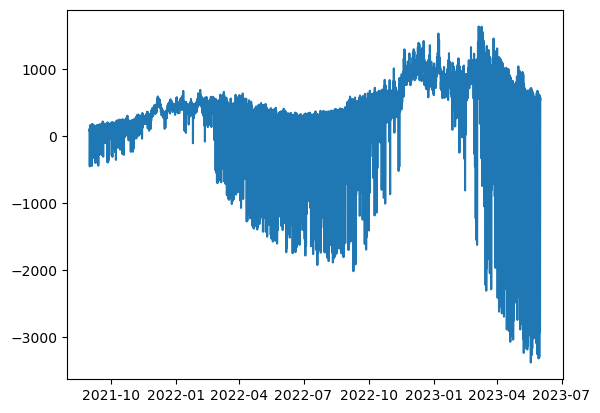

In [12]:
plt.plot(df_cp0.target)

# 간단 eda

In [13]:
def test_stationary(timeseries:pd.DataFrame, target_name:str):

  dftest = adfuller(timeseries[target_name], autolag="AIC")
  dfoutput = pd.Series(dftest[0:4], index=['Test_statistic', 'p-value', '#lags-used', 'number_of_obs used'])

  for key, value in dftest[4].items():
    dfoutput['critical value(%s)' %key]=value

  print(dfoutput)
  
  return dftest[1], dfoutput

In [19]:
def acf_pacf_plot(timeseries:pd.DataFrame, target_name:str, subplot_title:str):
    fig = plt.figure(figsize=(12,6))
    ax1 = fig.add_subplot(211)
    fig = plot_acf(timeseries[target_name].squeeze(), lags=100, ax=ax1)
    ax2 = fig.add_subplot(212)
    fig = plot_pacf(timeseries[target_name].squeeze(), lags=100, ax=ax2)
    plt.suptitle(subplot_title)

Test_statistic            -4.318336
p-value                    0.000413
#lags-used                43.000000
number_of_obs used     15268.000000
critical value(1%)        -3.430778
critical value(5%)        -2.861729
critical value(10%)       -2.566871
dtype: float64


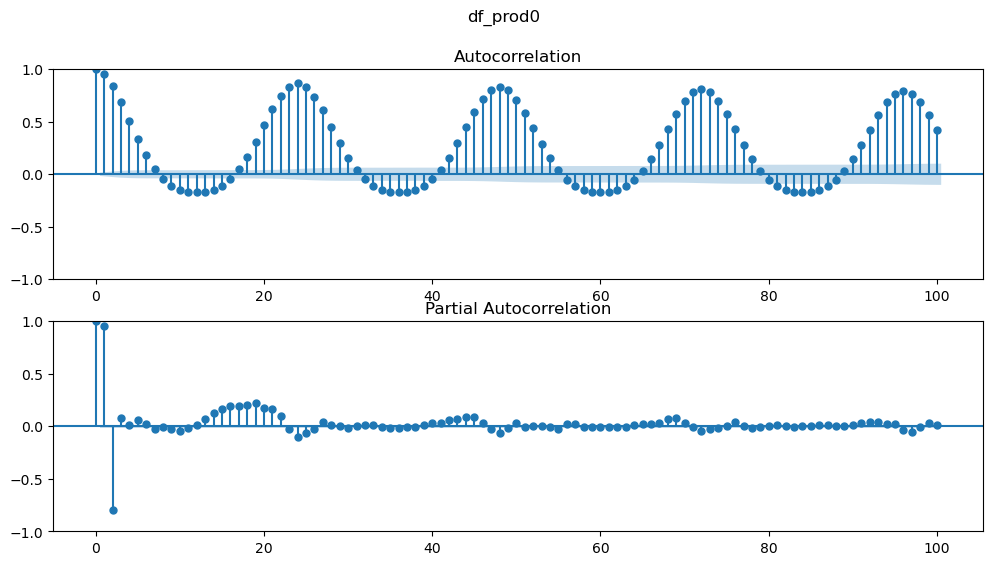

In [20]:
test_stationary(df_prod0, 'target')
acf_pacf_plot(df_prod0, 'target', 'df_prod0')

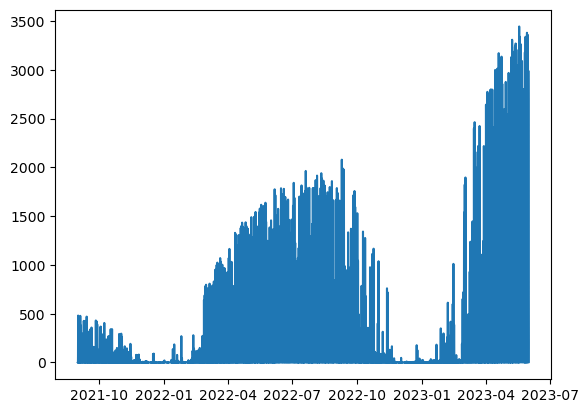

In [39]:
plt.plot(df_prod0.target)

Test_statistic            -2.473070
p-value                    0.122165
#lags-used                43.000000
number_of_obs used     15268.000000
critical value(1%)        -3.430778
critical value(5%)        -2.861729
critical value(10%)       -2.566871
dtype: float64


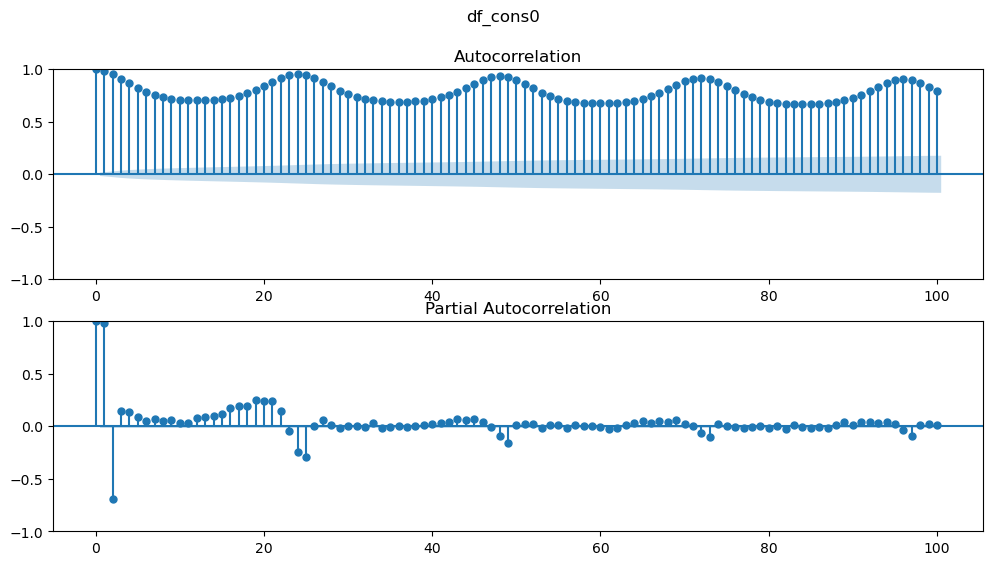

In [21]:
test_stationary(df_cons0, 'target')
acf_pacf_plot(df_cons0, 'target', 'df_cons0')

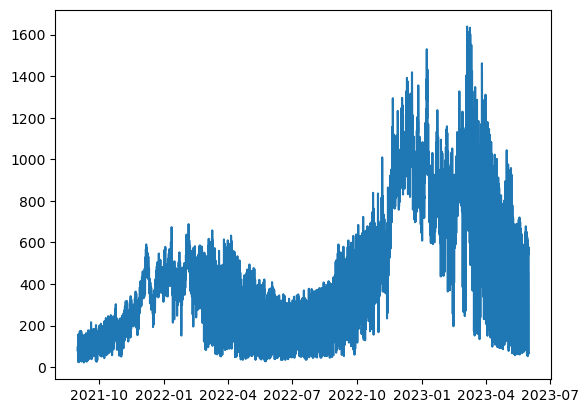

In [38]:
plt.plot(df_cons0.target)

Test_statistic           -28.599445
p-value                    0.000000
#lags-used                43.000000
number_of_obs used     15267.000000
critical value(1%)        -3.430778
critical value(5%)        -2.861729
critical value(10%)       -2.566871
dtype: float64


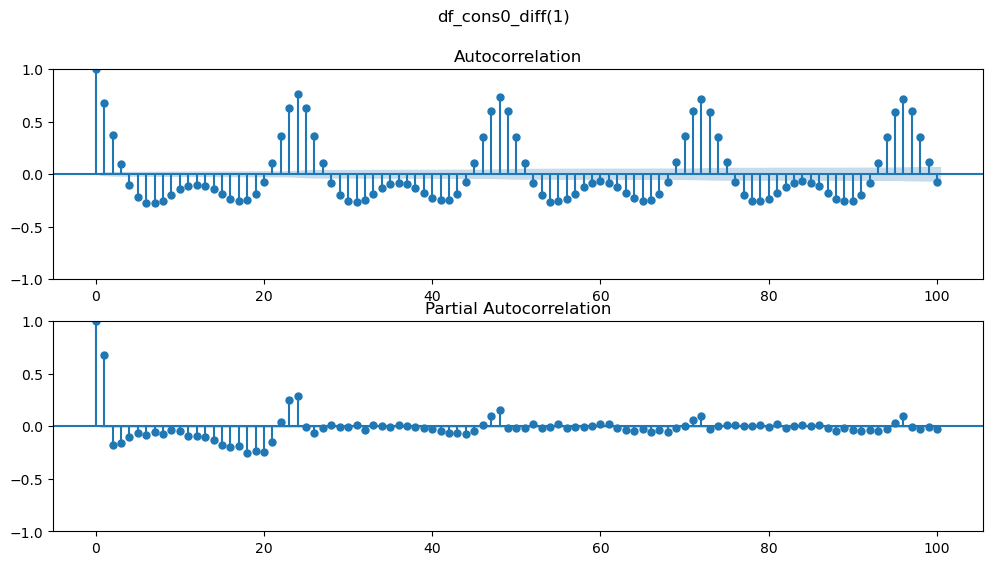

In [25]:
cons0_diff = df_cons0.diff(1).dropna()
test_stationary(cons0_diff, 'target')
acf_pacf_plot(cons0_diff, 'target', 'df_cons0_diff(1)')


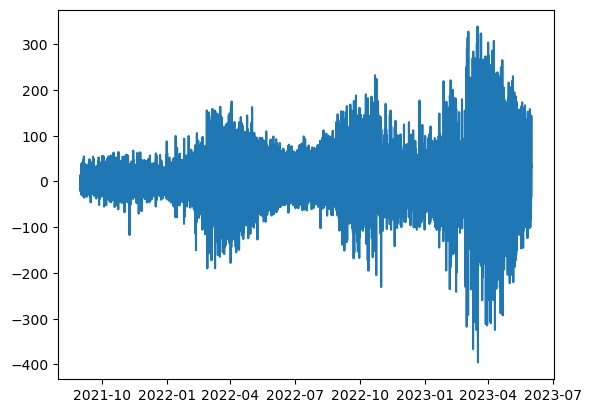

In [33]:
plt.plot(cons0_diff.target)

Test_statistic            -3.252837
p-value                    0.017123
#lags-used                43.000000
number_of_obs used     15268.000000
critical value(1%)        -3.430778
critical value(5%)        -2.861729
critical value(10%)       -2.566871
dtype: float64


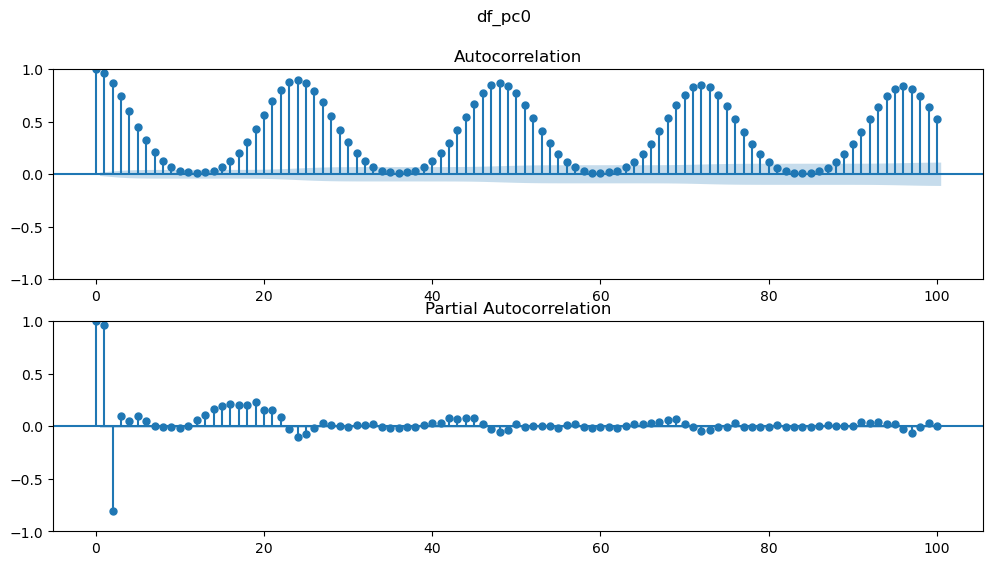

In [22]:
test_stationary(df_pc0, 'target')
acf_pacf_plot(df_pc0, 'target', 'df_pc0')

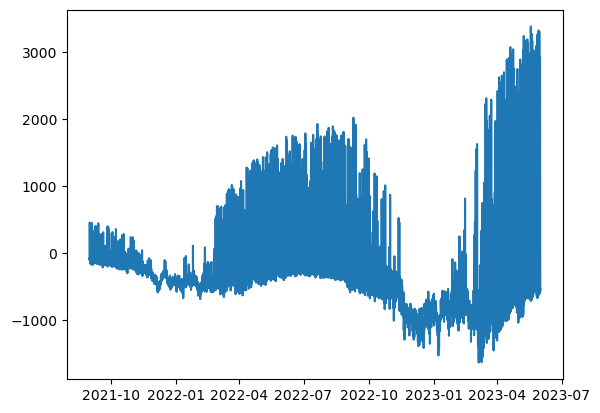

In [34]:
plt.plot(df_pc0.target)

Test_statistic           -33.687106
p-value                    0.000000
#lags-used                43.000000
number_of_obs used     15267.000000
critical value(1%)        -3.430778
critical value(5%)        -2.861729
critical value(10%)       -2.566871
dtype: float64


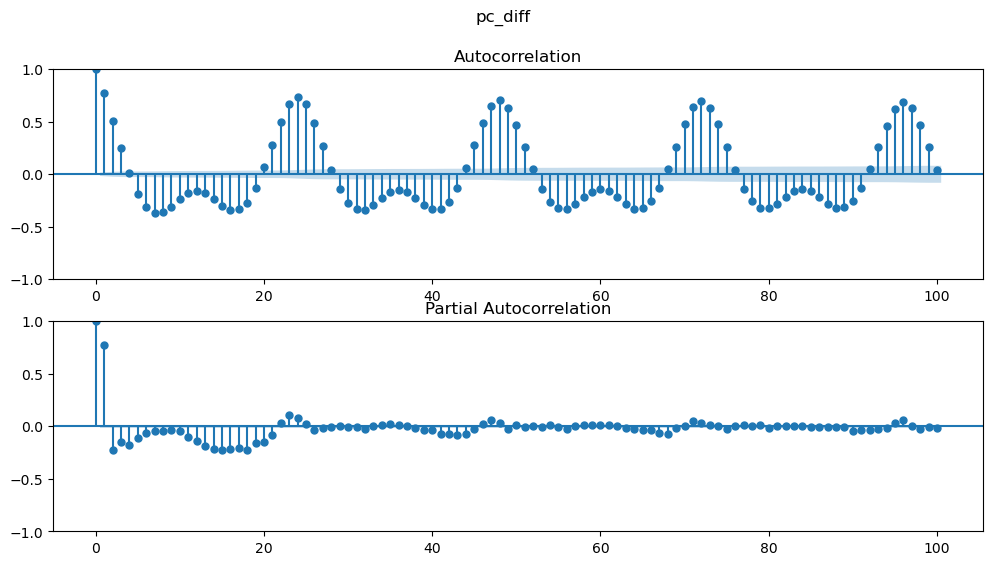

In [32]:
pc_diff = df_pc0.diff(1).dropna()
test_stationary(pc_diff, 'target')
acf_pacf_plot(pc_diff, 'target', 'pc_diff')

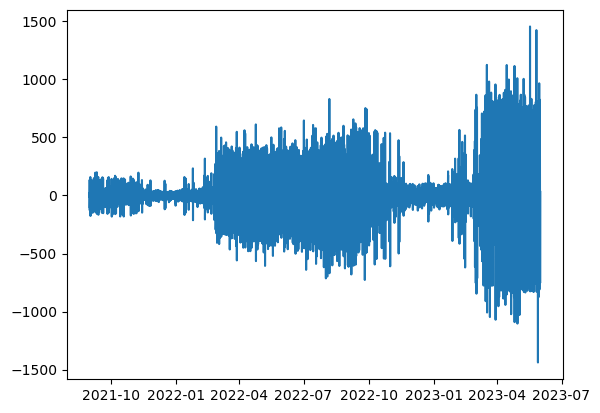

In [36]:
plt.plot(pc_diff.target)

# Arima with Scaling

In [28]:
tst_size = 96
def use_arima(timeseries:pd.DataFrame, target_name:str='target', tst_size:int=tst_size, p:int=0, d:int=0, q:int=0, scale:bool=False):
    df = timeseries[target_name]
    trn, tst = df[:-tst_size], df[-tst_size:]

    # scale
    if scale == True:
        scaler = MinMaxScaler()
        index = trn.index
        trn = scaler.fit_transform(trn.to_numpy(dtype=np.float32).flatten().reshape(-1,1))
        trn = pd.DataFrame(trn).set_index(index)

    # train & predict
    arima = ARIMA(trn, order=(p,d,q)).fit()
    prd = arima.predict('2023-05-28 00:00:00', '2023-05-31 23:00:00')
    
    # unscale
    if scale == True:
        prd = scaler.inverse_transform(prd.to_numpy(dtype=np.float32).flatten().reshape(-1,1))
        prd = pd.DataFrame(prd).set_index(tst.index)
        print(type(prd))
        
    # graph
    plt.figure(figsize=(12,5))
    plt.plot(tst, label='origin')
    plt.plot(prd, label='prd')
    plt.legend()
    plt.title(f'arima({p},{d},{q}), MSE:{mse(tst, prd):.4f}, MAPE:{mape(tst, prd)*100:.4f}, MAE:{mae(tst, prd):.4f}, r2:{r2_score(tst, prd):.4f}')
    # 복붙하다가 실수로 mse에 *100 한 결과 출력함.. 알아서 /100 해서 보기.. -> 240111자로 수정함
    return prd

### df_prod - df_cons 한 번에 예측

In [41]:
test_stationary(df_pc0, 'target')

Test_statistic            -3.252837
p-value                    0.017123
#lags-used                43.000000
number_of_obs used     15268.000000
critical value(1%)        -3.430778
critical value(5%)        -2.861729
critical value(10%)       -2.566871
dtype: float64


(0.017122889476408373,
 Test_statistic            -3.252837
 p-value                    0.017123
 #lags-used                43.000000
 number_of_obs used     15268.000000
 critical value(1%)        -3.430778
 critical value(5%)        -2.861729
 critical value(10%)       -2.566871
 dtype: float64)

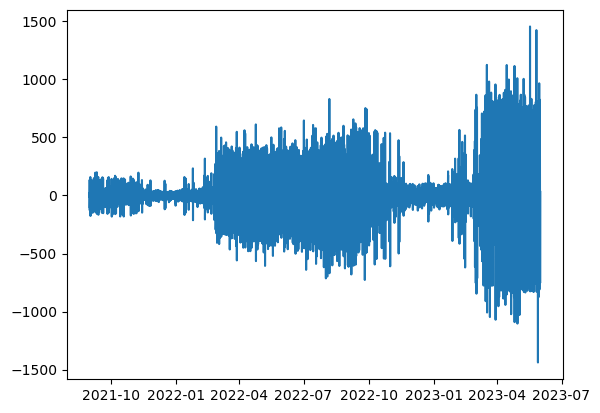

In [38]:
plt.plot(df_pc0.target.diff(1))

In [46]:
df_pc0_diff = df_pc0.diff(1).dropna()
test_stationary(df_pc0_diff, 'target')

Test_statistic           -33.687106
p-value                    0.000000
#lags-used                43.000000
number_of_obs used     15267.000000
critical value(1%)        -3.430778
critical value(5%)        -2.861729
critical value(10%)       -2.566871
dtype: float64


(0.0,
 Test_statistic           -33.687106
 p-value                    0.000000
 #lags-used                43.000000
 number_of_obs used     15267.000000
 critical value(1%)        -3.430778
 critical value(5%)        -2.861729
 critical value(10%)       -2.566871
 dtype: float64)

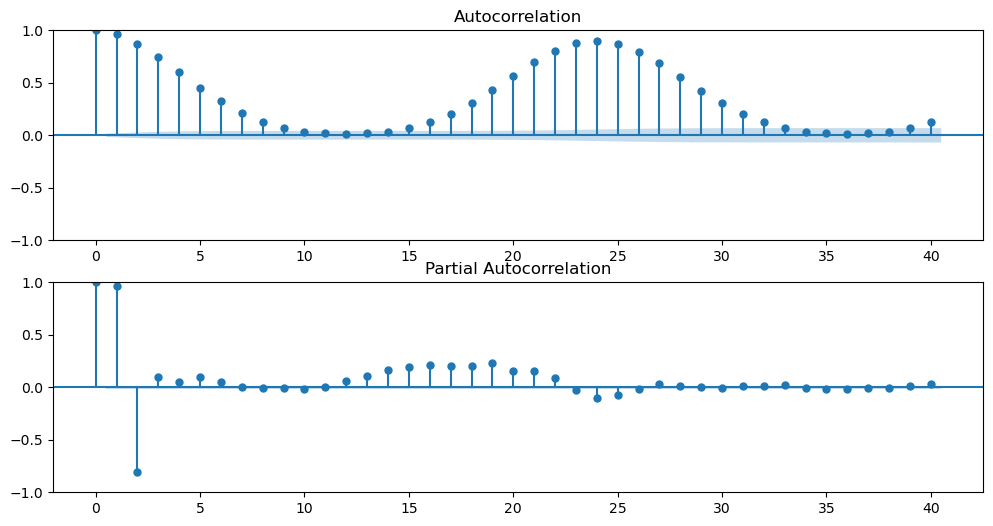

In [36]:
acf_pacf_plot(df_pc0, 'target')

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


2023-05-28 00:00:00   -593.113866
2023-05-28 01:00:00   -535.087717
2023-05-28 02:00:00   -490.970038
2023-05-28 03:00:00   -445.476462
2023-05-28 04:00:00   -368.501344
                          ...    
2023-05-31 19:00:00    309.331454
2023-05-31 20:00:00    -23.411219
2023-05-31 21:00:00   -277.254132
2023-05-31 22:00:00   -448.979987
2023-05-31 23:00:00   -546.501947
Freq: H, Name: predicted_mean, Length: 96, dtype: float64

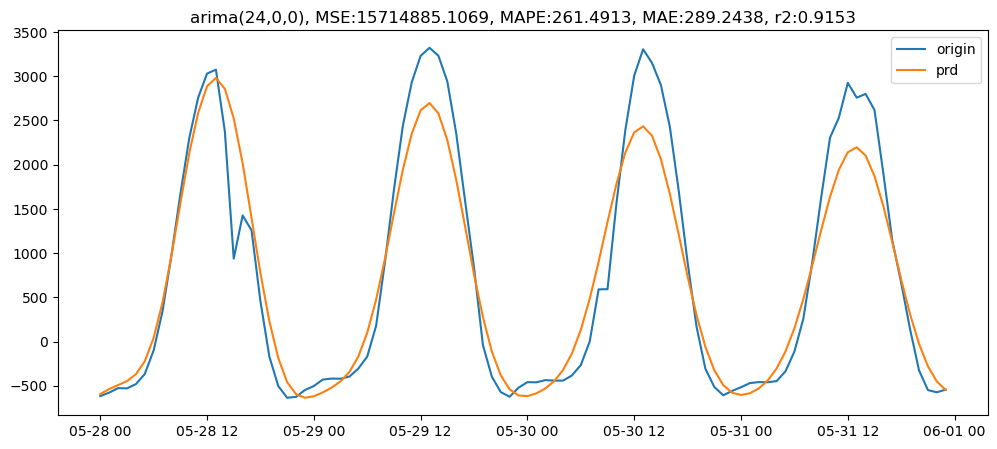

In [31]:
use_arima(df_pc0, p=24, d=0, q=0, scale=False)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


<class 'pandas.core.frame.DataFrame'>


,0
datetime,
2023-05-28 00:00:00,-592.864563
2023-05-28 01:00:00,-534.503967
2023-05-28 02:00:00,-490.100525
2023-05-28 03:00:00,-444.500183
2023-05-28 04:00:00,-367.635406
...,...
2023-05-31 19:00:00,312.828064
2023-05-31 20:00:00,-20.528551
2023-05-31 21:00:00,-274.746613


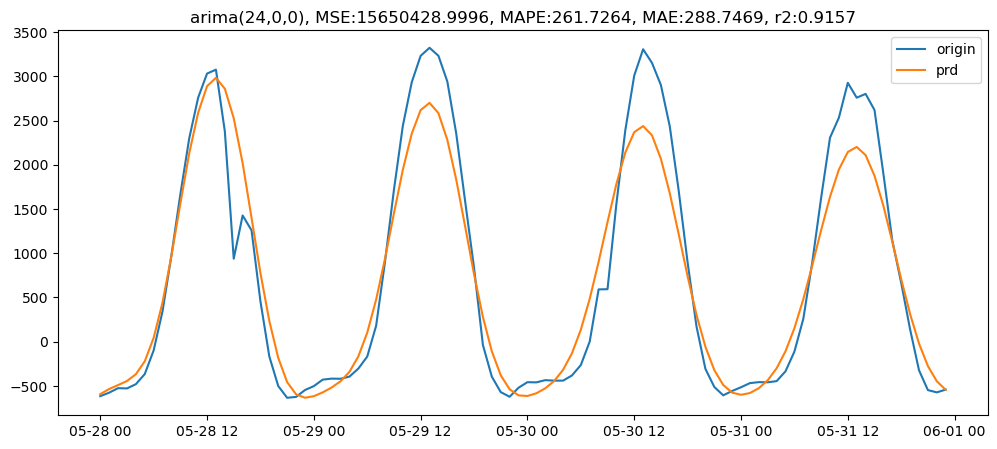

In [32]:
use_arima(df_pc0, p=24, d=0, q=0, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2023-05-28 00:00:00   -554.588857
2023-05-28 01:00:00   -456.196210
2023-05-28 02:00:00   -362.464420
2023-05-28 03:00:00   -269.219618
2023-05-28 04:00:00   -161.785811
                          ...    
2023-05-31 19:00:00    184.667260
2023-05-31 20:00:00   -147.959990
2023-05-31 21:00:00   -337.330304
2023-05-31 22:00:00   -392.968783
2023-05-31 23:00:00   -358.201517
Freq: H, Name: predicted_mean, Length: 96, dtype: float64

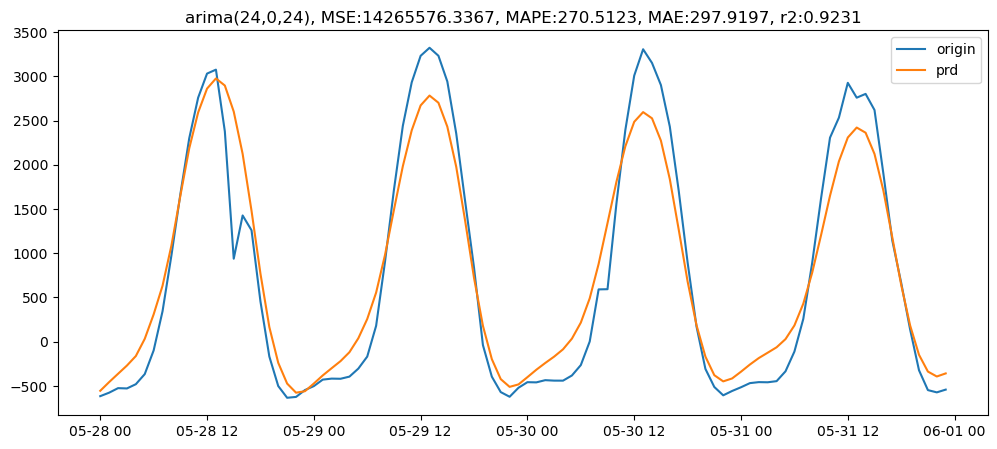

In [33]:
use_arima(df_pc0, p=24, d=0, q=24, scale=False)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'pandas.core.frame.DataFrame'>


,0
datetime,
2023-05-28 00:00:00,-575.454224
2023-05-28 01:00:00,-483.158478
2023-05-28 02:00:00,-380.109497
2023-05-28 03:00:00,-266.769470
2023-05-28 04:00:00,-147.604172
...,...
2023-05-31 19:00:00,-27.618788
2023-05-31 20:00:00,-241.096939
2023-05-31 21:00:00,-380.475555


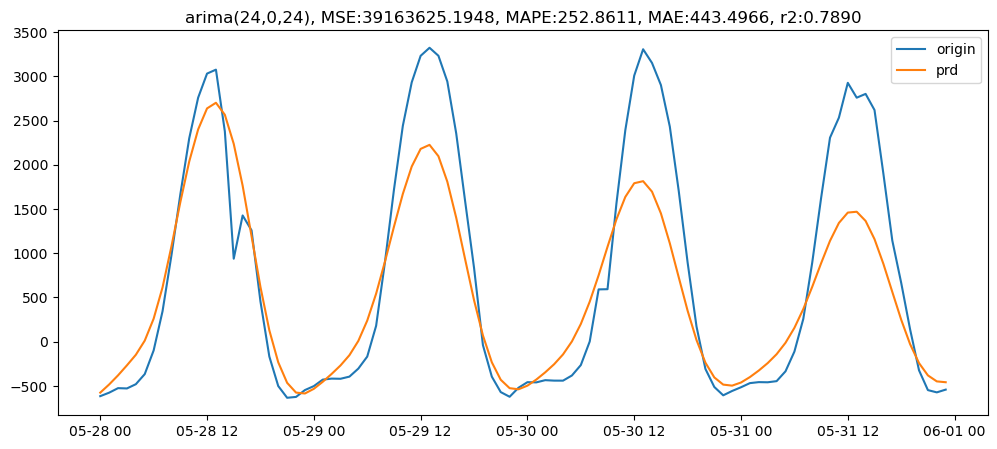

In [34]:
use_arima(df_pc0, p=24, d=0, q=24, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

2023-05-28 00:00:00   -580.622508
2023-05-28 01:00:00   -497.042352
2023-05-28 02:00:00   -412.378923
2023-05-28 03:00:00   -351.615150
2023-05-28 04:00:00   -261.711294
                          ...    
2023-05-31 19:00:00    204.630804
2023-05-31 20:00:00   -151.953910
2023-05-31 21:00:00   -382.031812
2023-05-31 22:00:00   -492.945305
2023-05-31 23:00:00   -506.106648
Freq: H, Name: predicted_mean, Length: 96, dtype: float64

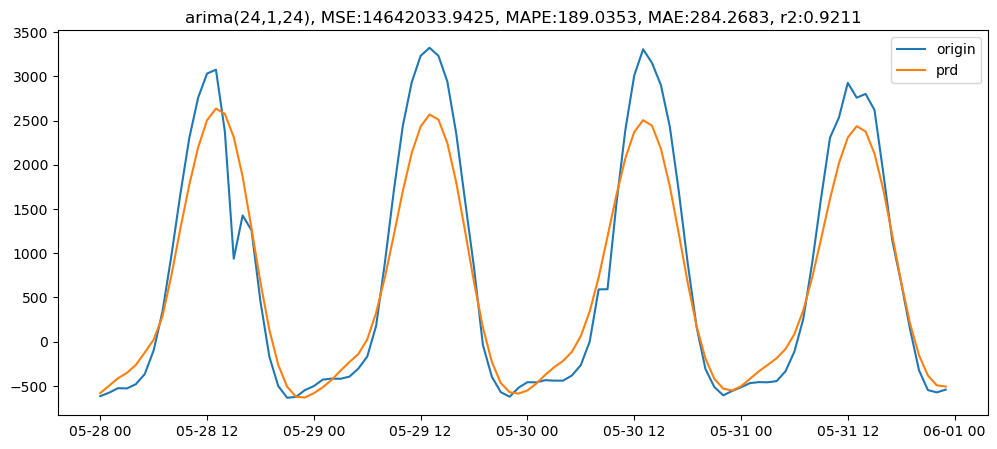

In [47]:
use_arima(df_pc0, p=24, d=1, q=24, scale=False)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

<class 'pandas.core.frame.DataFrame'>


,0
datetime,
2023-05-28 00:00:00,-597.952576
2023-05-28 01:00:00,-557.448975
2023-05-28 02:00:00,-503.405975
2023-05-28 03:00:00,-437.342896
2023-05-28 04:00:00,-356.013550
...,...
2023-05-31 19:00:00,327.211761
2023-05-31 20:00:00,24.552343
2023-05-31 21:00:00,-185.385178


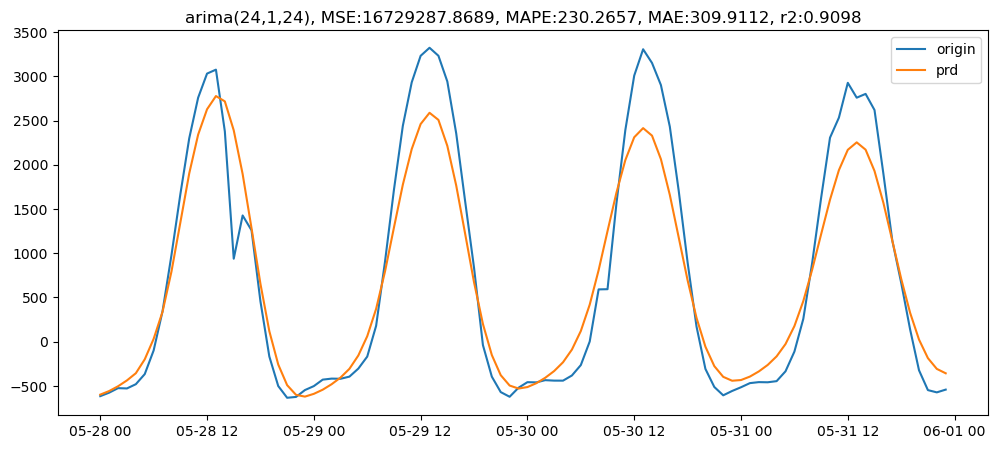

In [48]:
use_arima(df_pc0, p=24, d=1, q=24, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

2023-05-28 00:00:00   -588.180470
2023-05-28 01:00:00   -509.486517
2023-05-28 02:00:00   -436.279988
2023-05-28 03:00:00   -377.635363
2023-05-28 04:00:00   -284.694788
                          ...    
2023-05-31 19:00:00    212.750726
2023-05-31 20:00:00   -141.502885
2023-05-31 21:00:00   -368.293411
2023-05-31 22:00:00   -477.375220
2023-05-31 23:00:00   -488.846237
Freq: H, Name: predicted_mean, Length: 96, dtype: float64

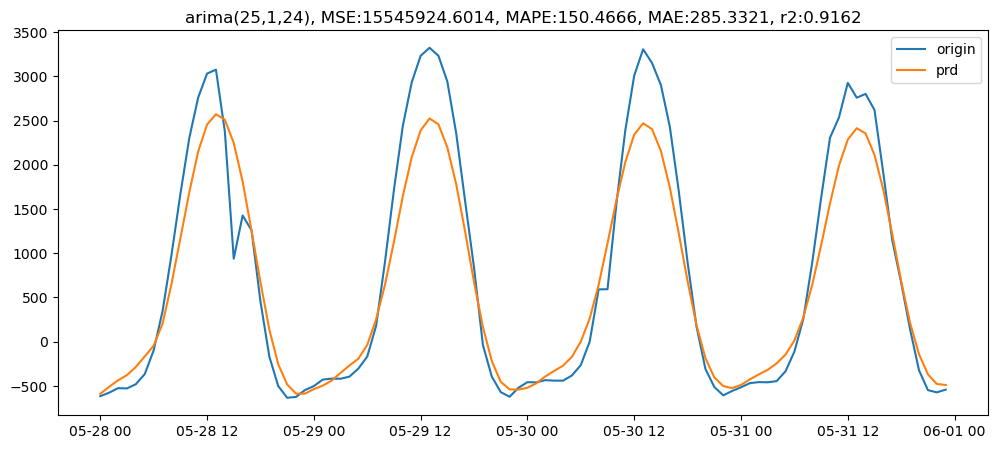

In [49]:
use_arima(df_pc0, p=25, d=1, q=24, scale=False)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

<class 'pandas.core.frame.DataFrame'>


,0
datetime,
2023-05-28 00:00:00,-595.925354
2023-05-28 01:00:00,-548.394653
2023-05-28 02:00:00,-504.534973
2023-05-28 03:00:00,-444.202026
2023-05-28 04:00:00,-360.731506
...,...
2023-05-31 19:00:00,484.136841
2023-05-31 20:00:00,275.782471
2023-05-31 21:00:00,130.059219


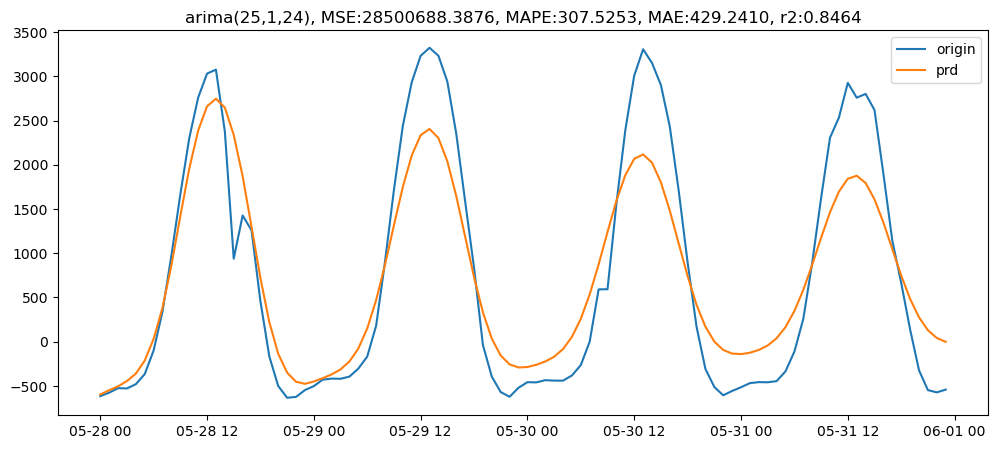

In [50]:
use_arima(df_pc0, p=25, d=1, q=24, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

2023-05-28 00:00:00   -568.731881
2023-05-28 01:00:00   -480.943783
2023-05-28 02:00:00   -383.312803
2023-05-28 03:00:00   -302.906867
2023-05-28 04:00:00   -240.080889
                          ...    
2023-05-31 19:00:00    200.744312
2023-05-31 20:00:00   -143.289016
2023-05-31 21:00:00   -360.254639
2023-05-31 22:00:00   -456.175563
2023-05-31 23:00:00   -453.203321
Freq: H, Name: predicted_mean, Length: 96, dtype: float64

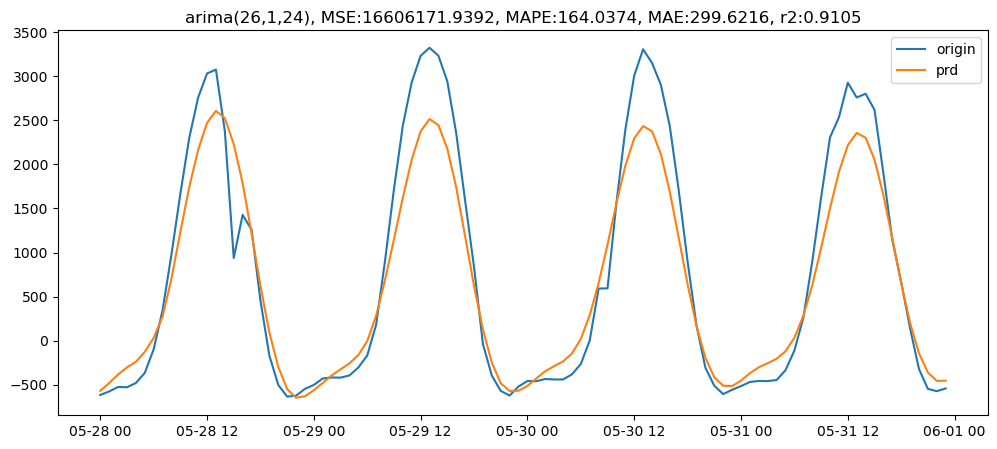

In [51]:
use_arima(df_pc0, p=26, d=1, q=24, scale=False)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

<class 'pandas.core.frame.DataFrame'>


,0
datetime,
2023-05-28 00:00:00,-588.082520
2023-05-28 01:00:00,-521.896057
2023-05-28 02:00:00,-459.282196
2023-05-28 03:00:00,-390.930878
2023-05-28 04:00:00,-307.677185
...,...
2023-05-31 19:00:00,383.268066
2023-05-31 20:00:00,167.062622
2023-05-31 21:00:00,30.861540


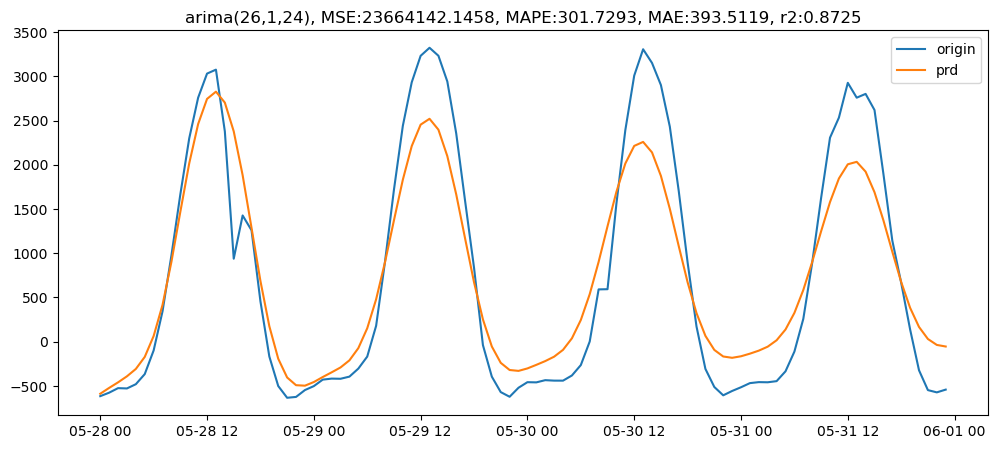

In [52]:
use_arima(df_pc0, p=26, d=1, q=24, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

2023-05-28 00:00:00   -577.583321
2023-05-28 01:00:00   -494.883161
2023-05-28 02:00:00   -399.431268
2023-05-28 03:00:00   -283.753187
2023-05-28 04:00:00   -153.243714
                          ...    
2023-05-31 19:00:00     57.529011
2023-05-31 20:00:00   -293.028514
2023-05-31 21:00:00   -497.267996
2023-05-31 22:00:00   -576.555513
2023-05-31 23:00:00   -569.900630
Freq: H, Name: predicted_mean, Length: 96, dtype: float64

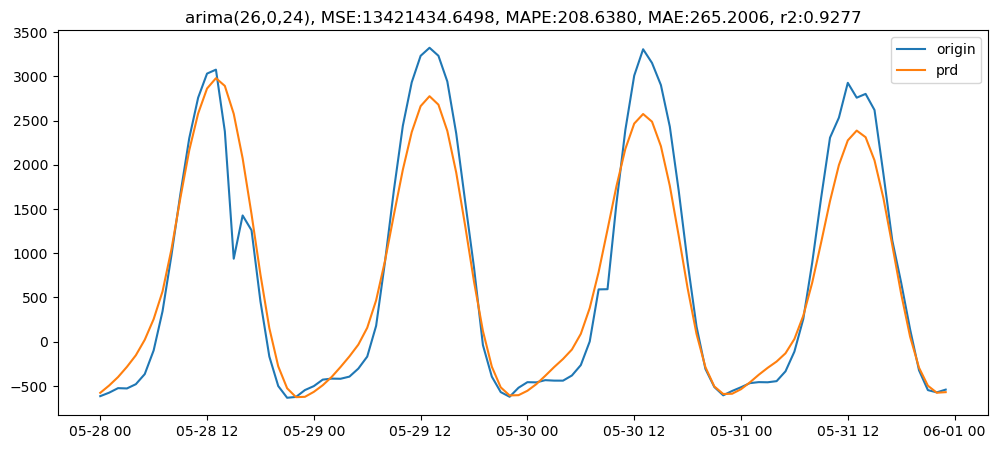

In [53]:
use_arima(df_pc0, p=26, d=0, q=24, scale=False)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

<class 'pandas.core.frame.DataFrame'>


,0
datetime,
2023-05-28 00:00:00,-603.240234
2023-05-28 01:00:00,-550.558167
2023-05-28 02:00:00,-478.357666
2023-05-28 03:00:00,-371.879761
2023-05-28 04:00:00,-225.914703
...,...
2023-05-31 19:00:00,-28.997986
2023-05-31 20:00:00,-301.711487
2023-05-31 21:00:00,-524.011841


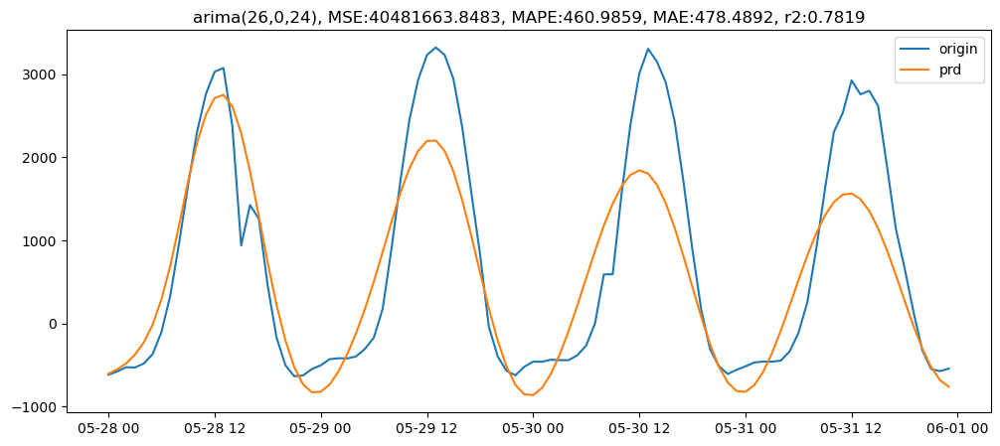

In [54]:
use_arima(df_pc0, p=26, d=0, q=24, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

2023-05-28 00:00:00   -558.502848
2023-05-28 01:00:00   -458.857547
2023-05-28 02:00:00   -363.647189
2023-05-28 03:00:00   -255.025246
2023-05-28 04:00:00   -122.618906
                          ...    
2023-05-31 19:00:00    181.663682
2023-05-31 20:00:00   -122.617120
2023-05-31 21:00:00   -276.054747
2023-05-31 22:00:00   -305.927272
2023-05-31 23:00:00   -262.738708
Freq: H, Name: predicted_mean, Length: 96, dtype: float64

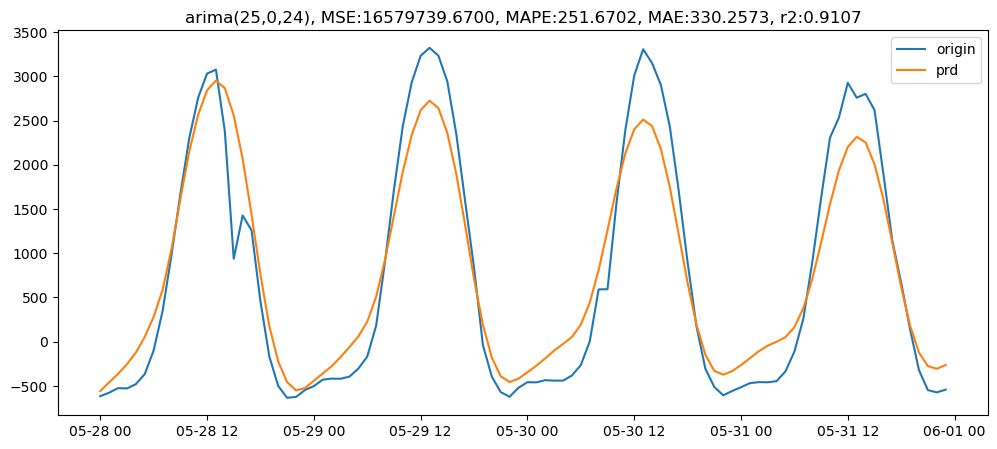

In [55]:
use_arima(df_pc0, p=25, d=0, q=24, scale=False)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

<class 'pandas.core.frame.DataFrame'>


,0
datetime,
2023-05-28 00:00:00,-585.567627
2023-05-28 01:00:00,-509.834930
2023-05-28 02:00:00,-423.226654
2023-05-28 03:00:00,-321.797546
2023-05-28 04:00:00,-202.236710
...,...
2023-05-31 19:00:00,259.249176
2023-05-31 20:00:00,-7.774229
2023-05-31 21:00:00,-199.747482


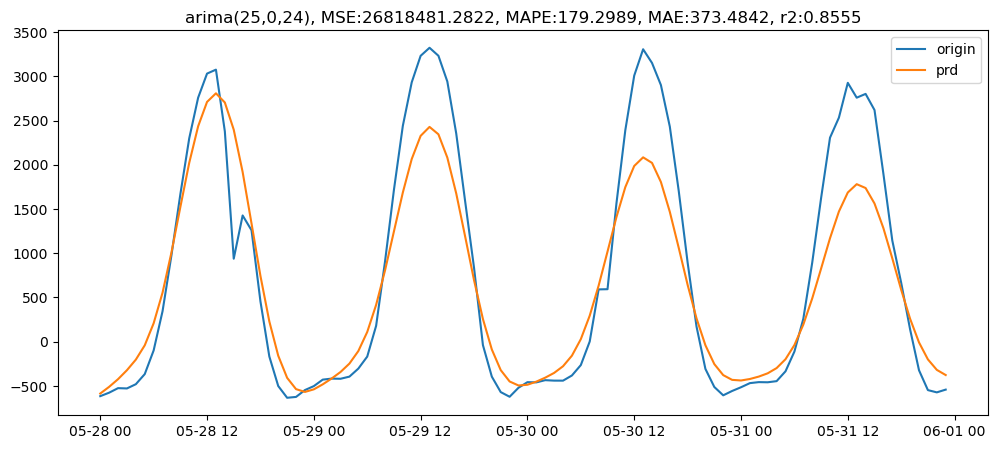

In [56]:
use_arima(df_pc0, p=25, d=0, q=24, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2023-05-28 00:00:00   -580.622508
2023-05-28 01:00:00   -497.042352
2023-05-28 02:00:00   -412.378923
2023-05-28 03:00:00   -351.615150
2023-05-28 04:00:00   -261.711294
                          ...    
2023-05-31 19:00:00    204.630804
2023-05-31 20:00:00   -151.953910
2023-05-31 21:00:00   -382.031812
2023-05-31 22:00:00   -492.945305
2023-05-31 23:00:00   -506.106648
Freq: H, Name: predicted_mean, Length: 96, dtype: float64

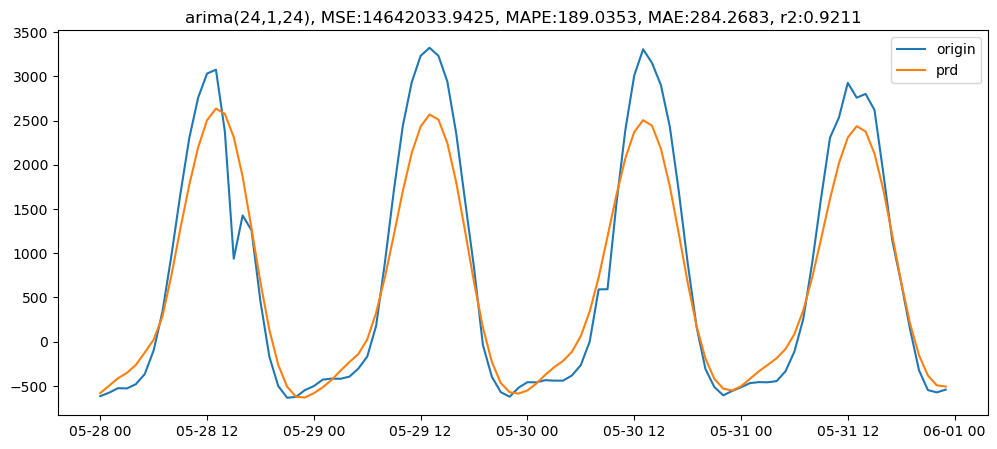

In [71]:
use_arima(df_pc0, p=24, d=1, q=24, scale=False)

### df_prod 최적값 - df_cons 최적값

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

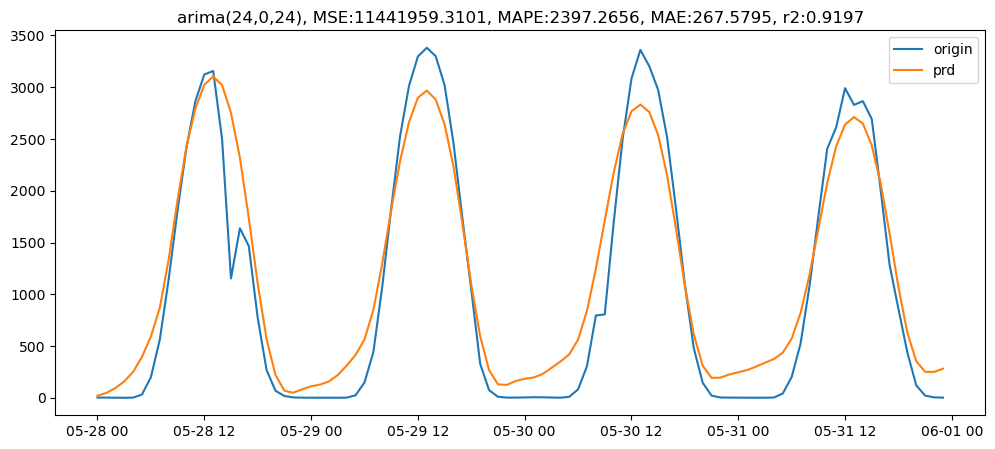

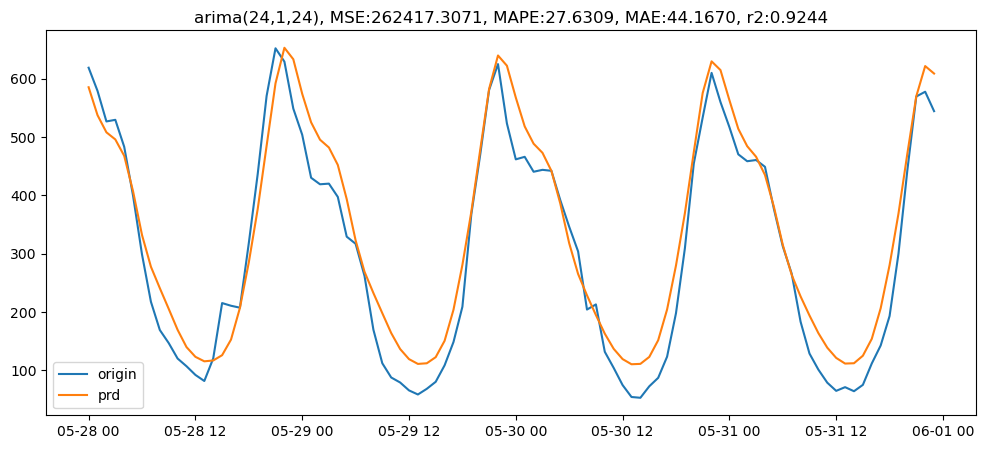

In [15]:
prd_prod0 = use_arima(df_prod0, p=24, d=0, q=24, scale=False)
prd_cons0 = use_arima(df_cons0, p=24, d=1, q=24, scale=False)

Text(0.5, 1.0, 'arima, MSE:121712.4230, MAPE:310.2016, MAE:267.8026, r2:0.9344')

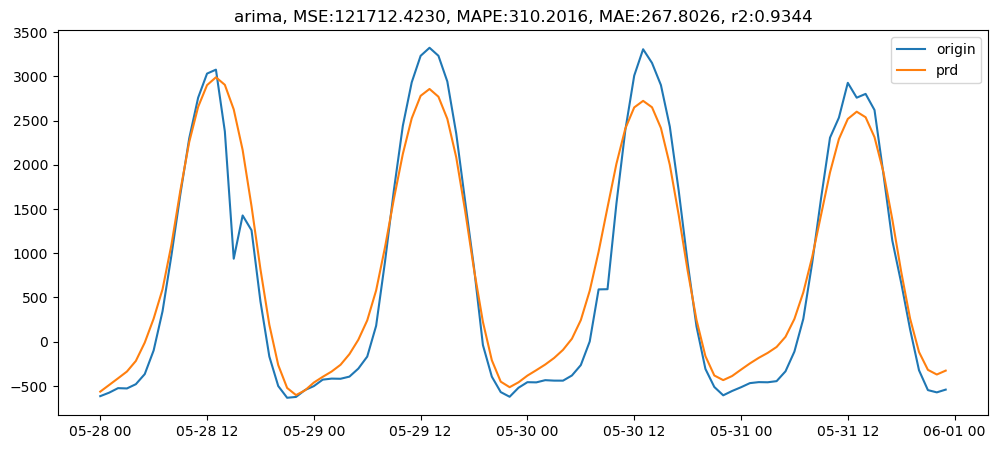

In [16]:
prd_prod0 = pd.DataFrame(prd_prod0)
prd_cons0 = pd.DataFrame(prd_cons0)
prd_pc0 = prd_prod0.predicted_mean- prd_cons0.predicted_mean

tst_size = 96
tst = df_pc0[-tst_size:].target

plt.figure(figsize=(12,5))
plt.plot(tst, label='origin')
plt.plot(prd_pc0, label='prd')
plt.legend()
plt.title(f'arima, MSE:{mse(tst, prd_pc0):.4f}, MAPE:{mape(tst, prd_pc0)*100:.4f}, MAE:{mae(tst, prd_pc0):.4f}, r2:{r2_score(tst, prd_pc0):.4f}')

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


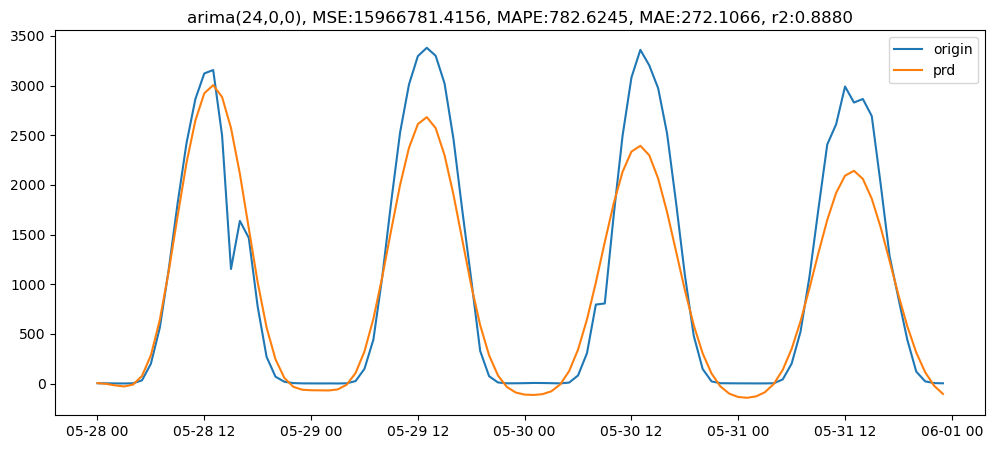

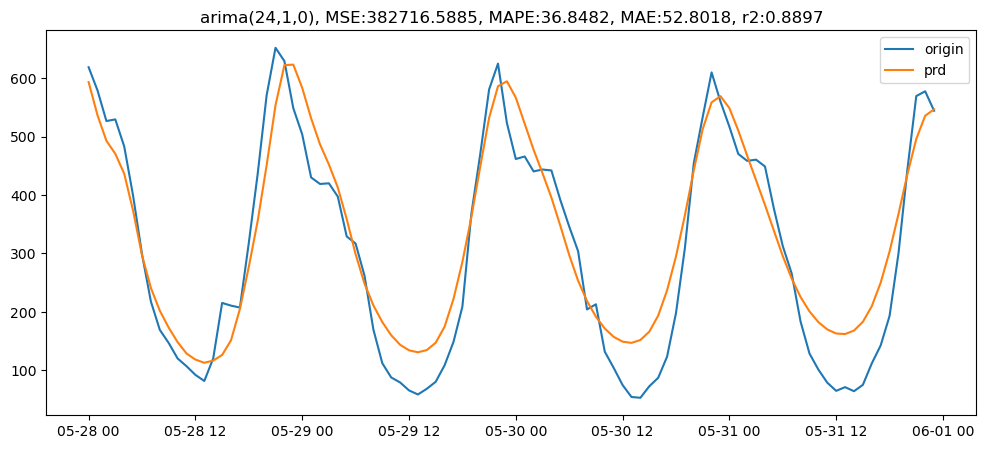

In [20]:
prd_prod0 = use_arima(df_prod0, p=24, d=0, q=0, scale=False)
prd_cons0 = use_arima(df_cons0, p=24, d=1, q=0, scale=False)

Text(0.5, 1.0, 'arima, MSE:199499.4556, MAPE:213.9455, MAE:314.6189, r2:0.8925')

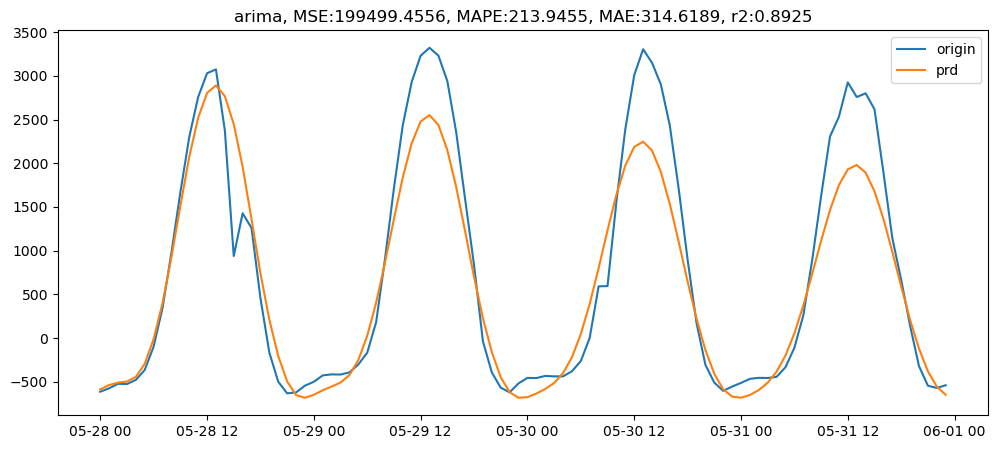

In [21]:
prd_prod0 = pd.DataFrame(prd_prod0)
prd_cons0 = pd.DataFrame(prd_cons0)
prd_pc0 = prd_prod0.predicted_mean- prd_cons0.predicted_mean

tst_size = 96
tst = df_pc0[-tst_size:].target

plt.figure(figsize=(12,5))
plt.plot(tst, label='origin')
plt.plot(prd_pc0, label='prd')
plt.legend()
plt.title(f'arima, MSE:{mse(tst, prd_pc0):.4f}, MAPE:{mape(tst, prd_pc0)*100:.4f}, MAE:{mae(tst, prd_pc0):.4f}, r2:{r2_score(tst, prd_pc0):.4f}')

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_mo

Text(0.5, 1.0, 'arima, MSE:204882.4725, MAPE:204.6680, MAE:314.2360, r2:0.8896')

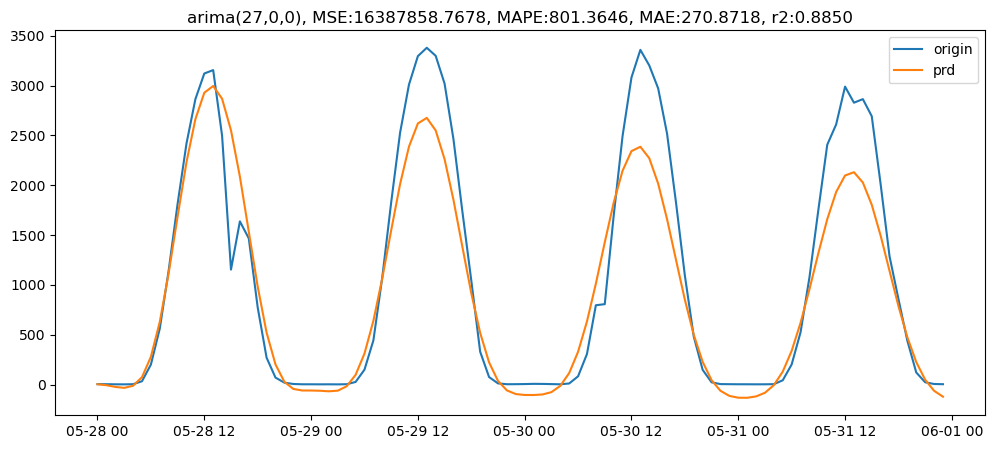

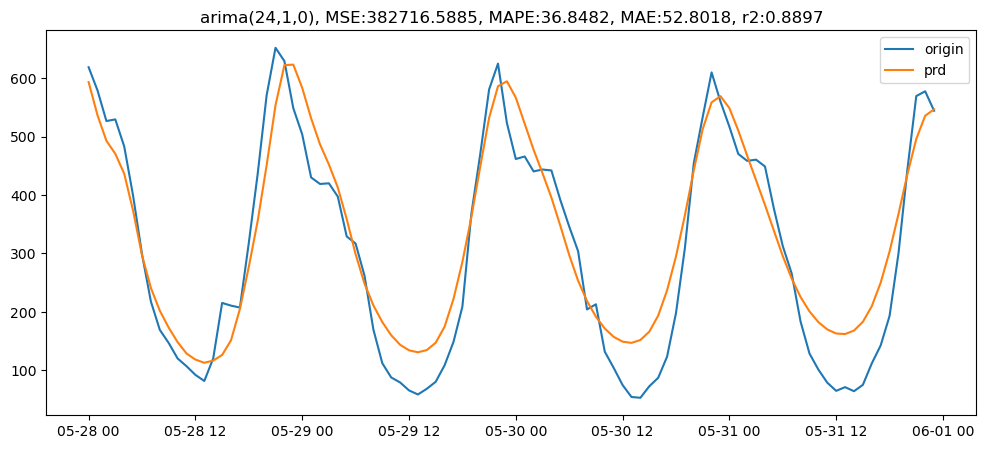

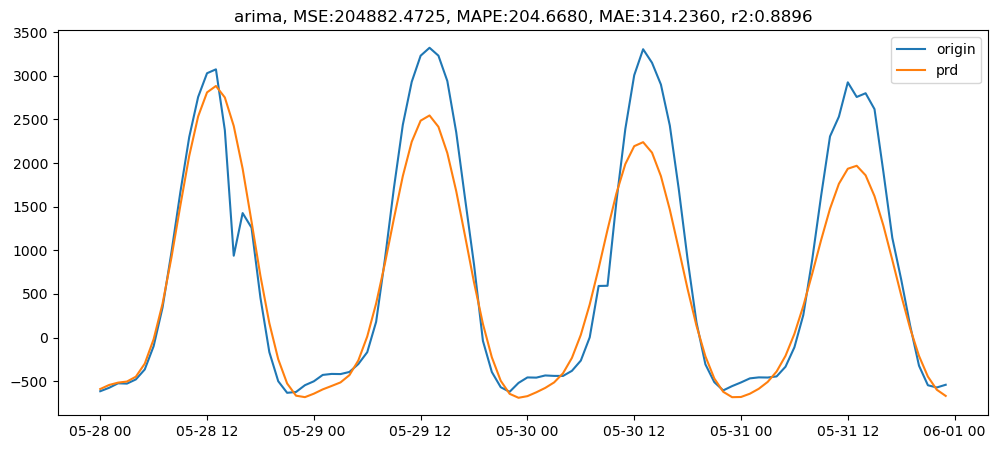

In [15]:
prd_prod0 = use_arima(df_prod0, p=27, d=0, q=0, scale=False)
prd_cons0 = use_arima(df_cons0, p=24, d=1, q=0, scale=False)
prd_prod0 = pd.DataFrame(prd_prod0)
prd_cons0 = pd.DataFrame(prd_cons0)
prd_pc0 = prd_prod0.predicted_mean- prd_cons0.predicted_mean

tst_size = 96
tst = df_pc0[-tst_size:].target

plt.figure(figsize=(12,5))
plt.plot(tst, label='origin')
plt.plot(prd_pc0, label='prd')
plt.legend()
plt.title(f'arima, MSE:{mse(tst, prd_pc0):.4f}, MAPE:{mape(tst, prd_pc0)*100:.4f}, MAE:{mae(tst, prd_pc0):.4f}, r2:{r2_score(tst, prd_pc0):.4f}')

## 240110 task
### arima
- p = 24~26 
- i = 0 
- q = 0, 24, 

In [ ]:
# (24, 0, 0) -> 이미 함

In [ ]:
# (24, 0, 24) -> 이미 함

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_mo

<class 'pandas.core.frame.DataFrame'>


,0
datetime,
2023-05-28 00:00:00,-589.143250
2023-05-28 01:00:00,-530.591064
2023-05-28 02:00:00,-484.191864
2023-05-28 03:00:00,-439.625153
2023-05-28 04:00:00,-366.722626
...,...
2023-05-31 19:00:00,170.122040
2023-05-31 20:00:00,-162.711639
2023-05-31 21:00:00,-403.137360


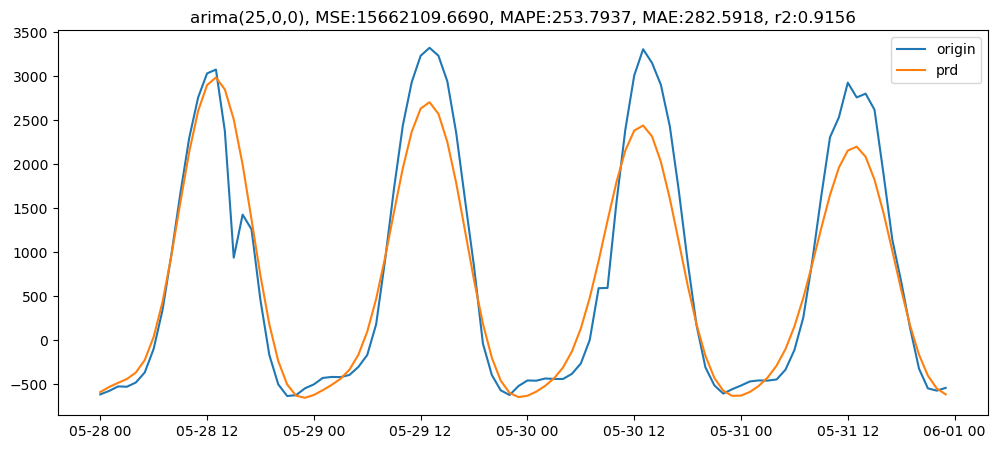

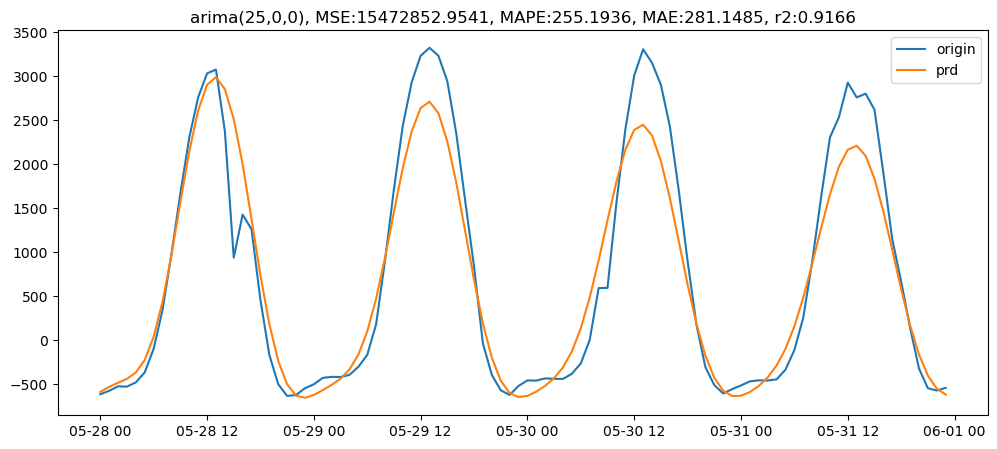

In [16]:
# (25, 0, 0)
use_arima(df_pc0, p=25, d=0, q=0, scale=False)
use_arima(df_pc0, p=25, d=0, q=0, scale=True)

In [ ]:
# (25, 0, 24) -> 이미 함

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_mo

<class 'pandas.core.frame.DataFrame'>


,0
datetime,
2023-05-28 00:00:00,-588.699341
2023-05-28 01:00:00,-529.355164
2023-05-28 02:00:00,-483.257080
2023-05-28 03:00:00,-438.690918
2023-05-28 04:00:00,-366.385559
...,...
2023-05-31 19:00:00,138.883957
2023-05-31 20:00:00,-196.748627
2023-05-31 21:00:00,-436.957245


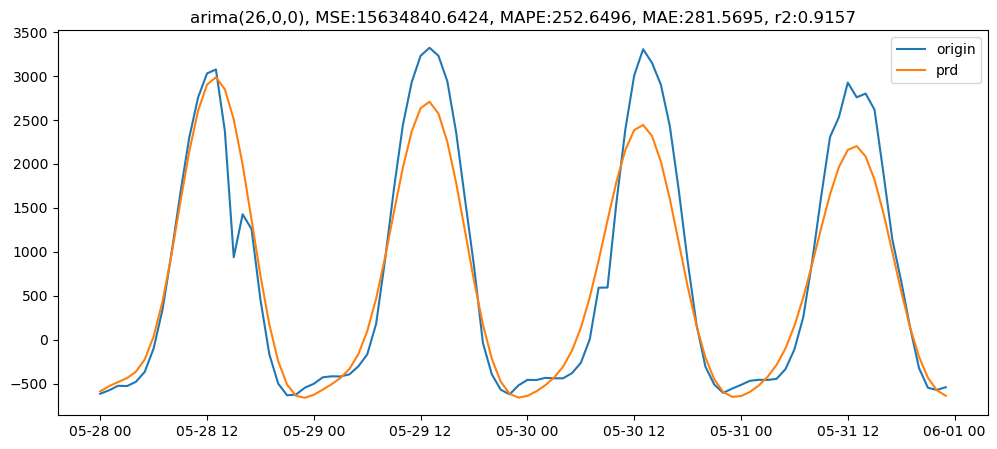

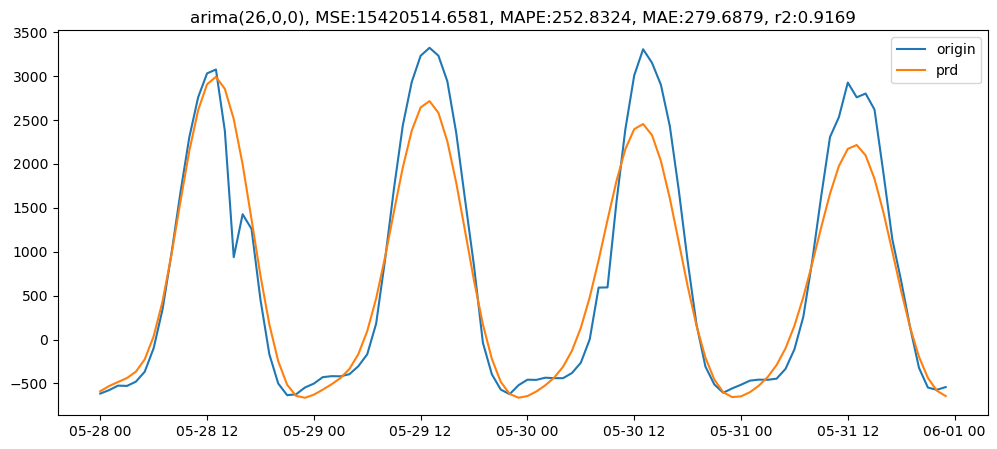

In [17]:
# (26, 0, 0)
use_arima(df_pc0, p=26, d=0, q=0, scale=False)
use_arima(df_pc0, p=26, d=0, q=0, scale=True)

In [ ]:
# (26, 0, 24) -> 이미 함, 세미 best

In [19]:
# # (26, 0, 34)
# use_arima(df_pc0, p=26, d=0, q=34, scale=False)
# use_arima(df_pc0, p=26, d=0, q=34, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

<class 'pandas.core.frame.DataFrame'>


,0
datetime,
2023-05-28 00:00:00,-570.661377
2023-05-28 01:00:00,-461.653442
2023-05-28 02:00:00,-278.580353
2023-05-28 03:00:00,-46.193016
2023-05-28 04:00:00,204.416382
...,...
2023-05-31 19:00:00,184.212341
2023-05-31 20:00:00,110.405022
2023-05-31 21:00:00,39.056122


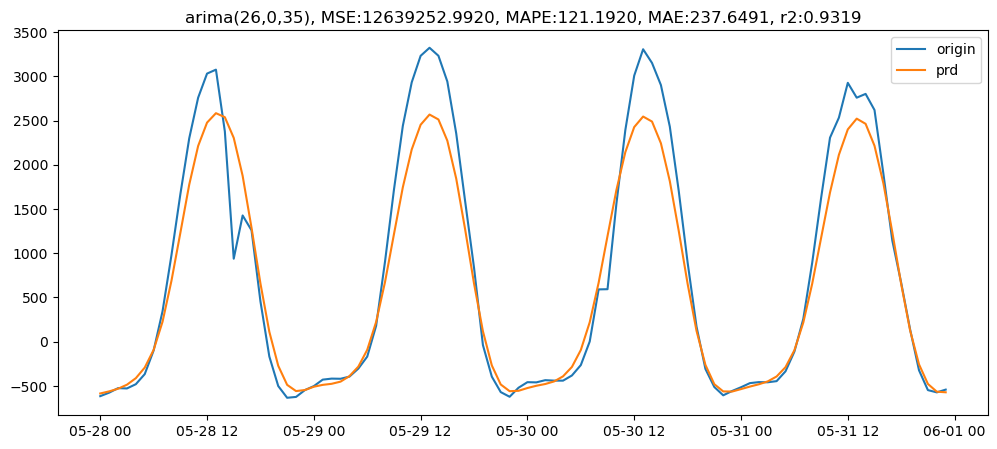

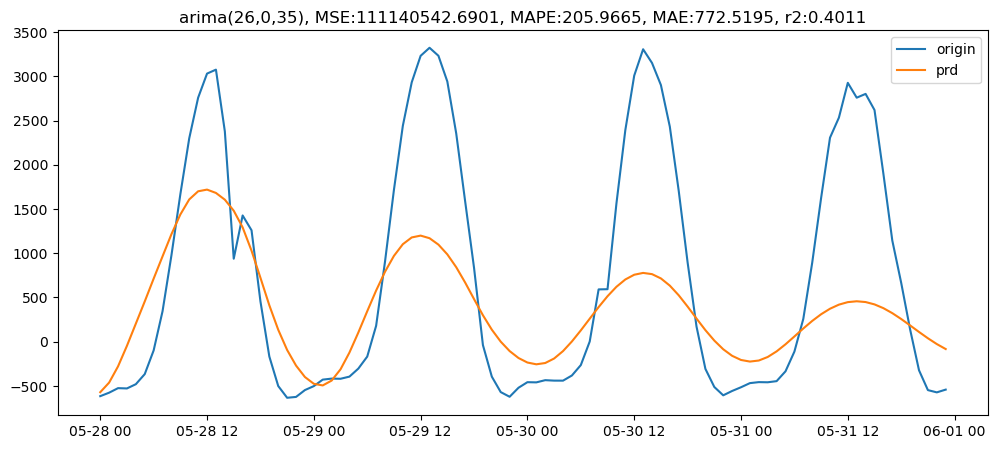

In [18]:
# (26, 0, 35)
use_arima(df_pc0, p=26, d=0, q=35, scale=False)
use_arima(df_pc0, p=26, d=0, q=35, scale=True)

### prod
- 24, 0, 0 -> 함
- 24, 0, 24 -> 함
- 25, 0, 0 -> 함
- 25, 0, 24 -> 함
- 26, 0, 0
- 26, 0, 24 -> 함

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_mo

<class 'pandas.core.frame.DataFrame'>


,0
datetime,
2023-05-28 00:00:00,4.645100
2023-05-28 01:00:00,-4.442669
2023-05-28 02:00:00,-21.414724
2023-05-28 03:00:00,-32.229473
2023-05-28 04:00:00,-12.291423
...,...
2023-05-31 19:00:00,400.826172
2023-05-31 20:00:00,137.358948
2023-05-31 21:00:00,-46.526226


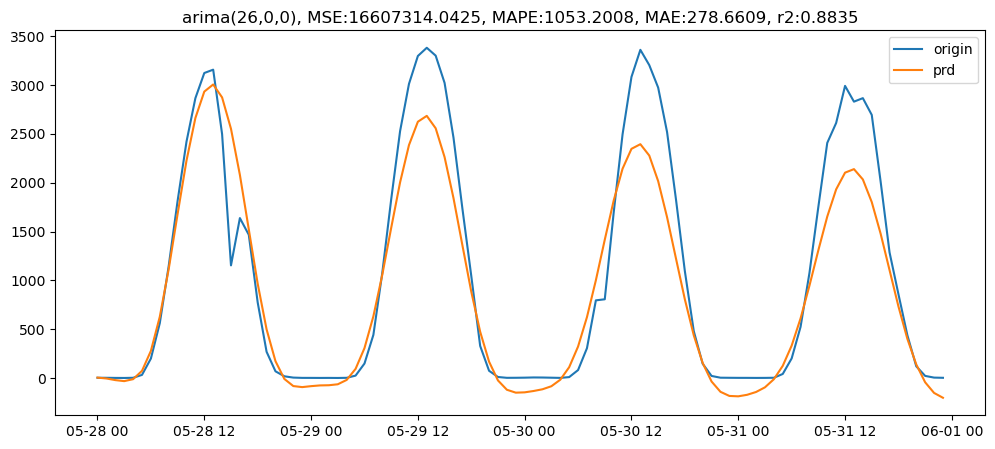

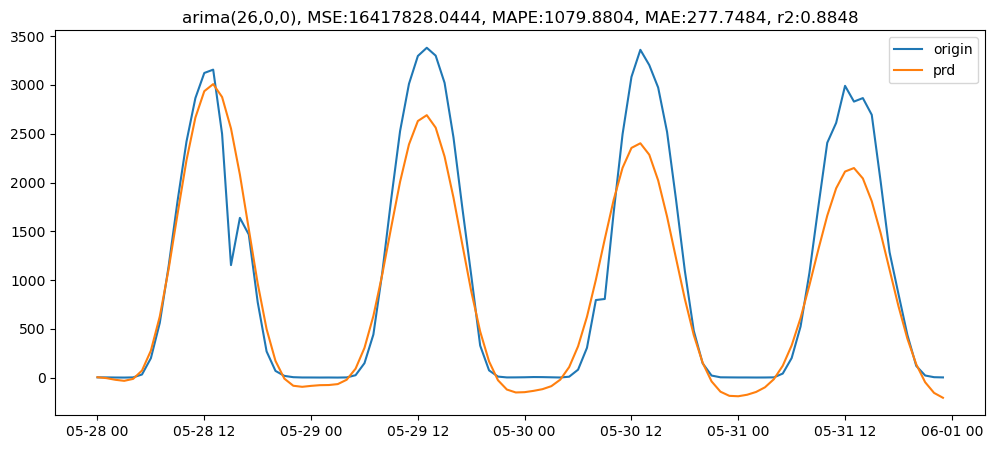

In [20]:
use_arima(df_prod0, p=26, d=0, q=0, scale=False)
use_arima(df_prod0, p=26, d=0, q=0, scale=True)

task 외 실험

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmo

<class 'pandas.core.frame.DataFrame'>


,0
datetime,
2023-05-28 00:00:00,5.209016
2023-05-28 01:00:00,-33.458504
2023-05-28 02:00:00,-133.888947
2023-05-28 03:00:00,-286.792999
2023-05-28 04:00:00,-463.479797
...,...
2023-05-31 19:00:00,909.970276
2023-05-31 20:00:00,1093.025879
2023-05-31 21:00:00,1328.507935


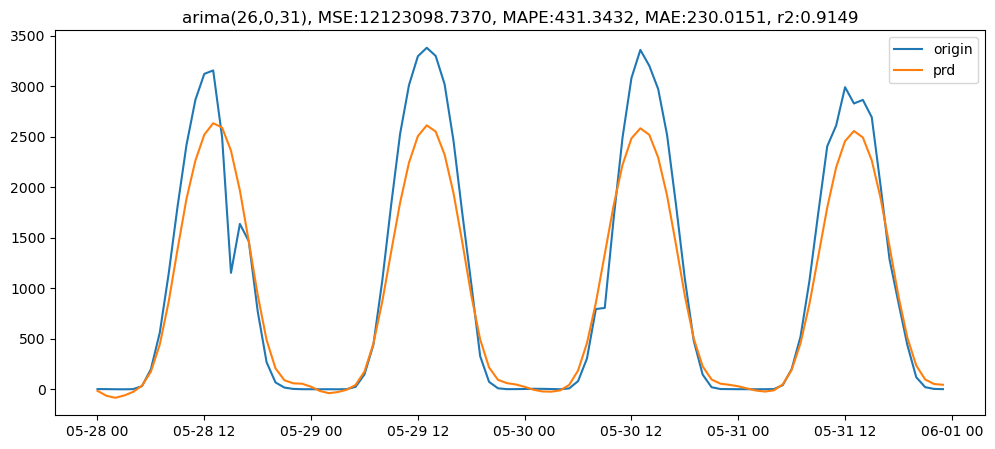

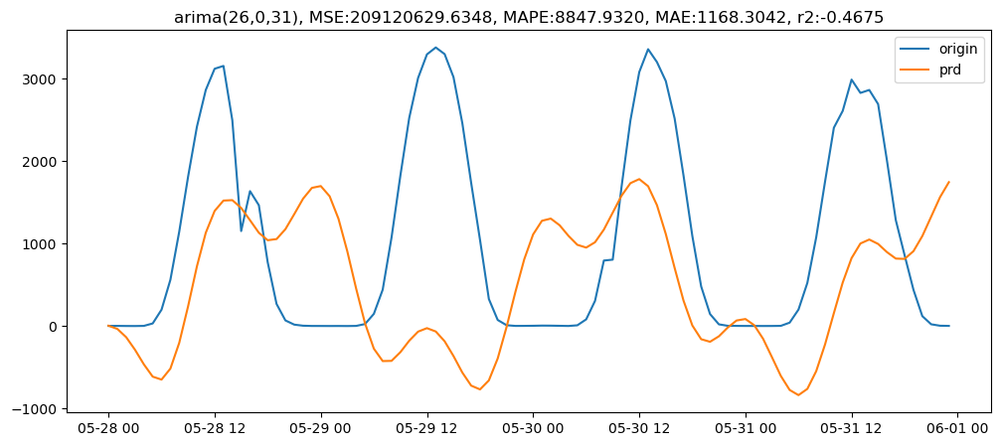

In [28]:
use_arima(df_prod0, p=26, d=0, q=31, scale=False)
use_arima(df_prod0, p=26, d=0, q=31, scale=True)

### cons
- 24, 0, 0 -> 함
- 24, 0, 24
- 25, 0, 0 -> 함
- 25, 0, 24
- 26, 0, 0 -> 함
- 26, 0, 24 -> 함

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmo

<class 'pandas.core.frame.DataFrame'>


,0
datetime,
2023-05-28 00:00:00,590.179199
2023-05-28 01:00:00,533.508728
2023-05-28 02:00:00,488.674561
2023-05-28 03:00:00,466.298950
2023-05-28 04:00:00,440.287598
...,...
2023-05-31 19:00:00,403.665436
2023-05-31 20:00:00,465.873688
2023-05-31 21:00:00,517.045227


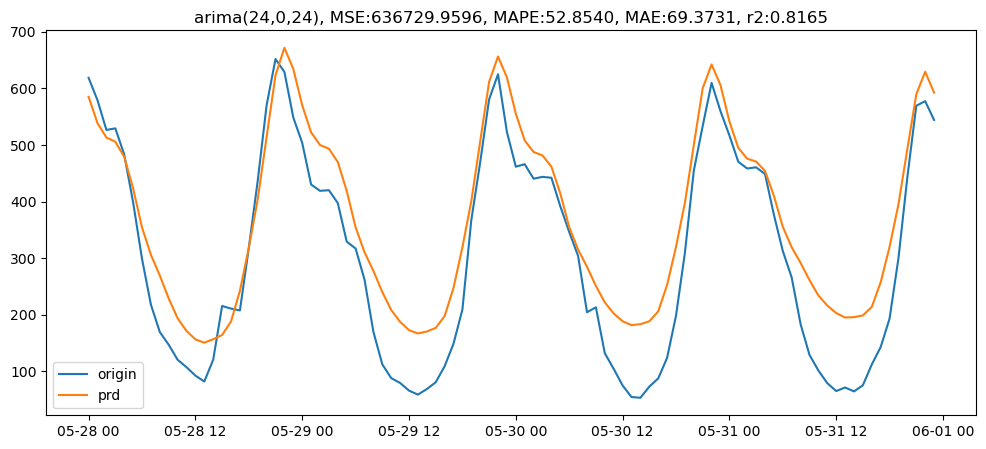

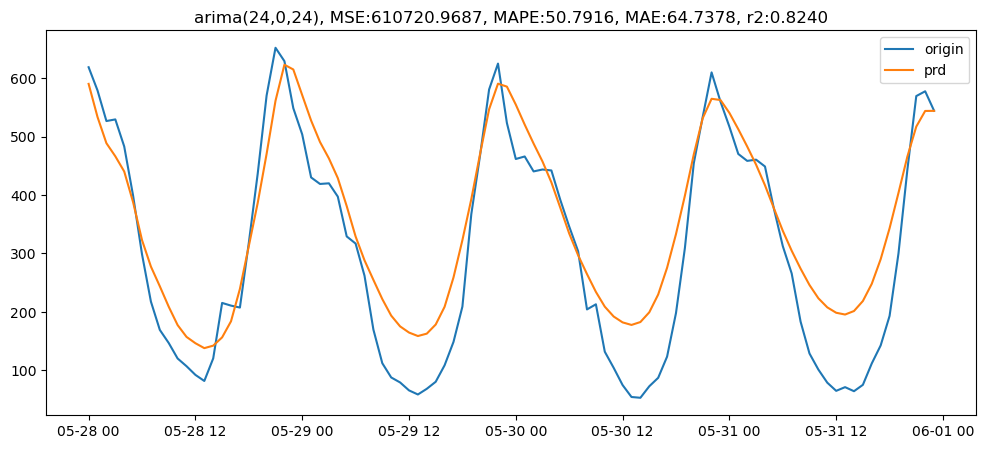

In [22]:
use_arima(df_cons0, p=24, d=0, q=24, scale=False)
use_arima(df_cons0, p=24, d=0, q=24, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

<class 'pandas.core.frame.DataFrame'>


,0
datetime,
2023-05-28 00:00:00,596.617188
2023-05-28 01:00:00,542.355896
2023-05-28 02:00:00,498.414368
2023-05-28 03:00:00,472.030731
2023-05-28 04:00:00,439.966705
...,...
2023-05-31 19:00:00,395.723450
2023-05-31 20:00:00,463.970978
2023-05-31 21:00:00,522.767944


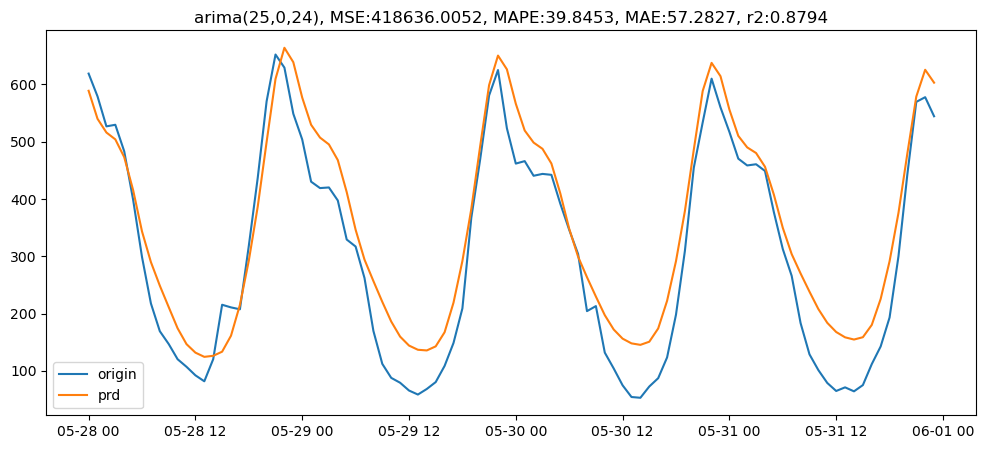

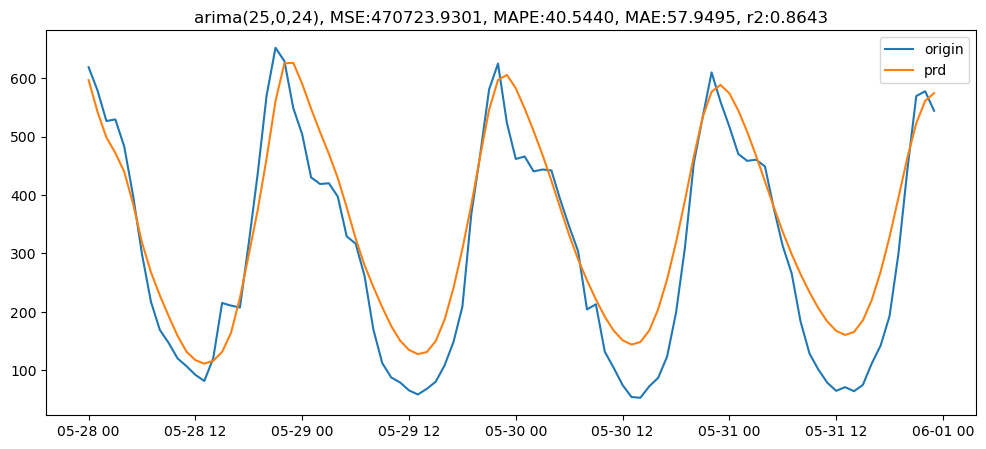

In [23]:
use_arima(df_cons0, p=25, d=0, q=24, scale=False)
use_arima(df_cons0, p=25, d=0, q=24, scale=True)

task 외 실험

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


<class 'pandas.core.frame.DataFrame'>


,0
datetime,
2023-05-28 00:00:00,593.224609
2023-05-28 01:00:00,536.351135
2023-05-28 02:00:00,492.708160
2023-05-28 03:00:00,470.524017
2023-05-28 04:00:00,436.407501
...,...
2023-05-31 19:00:00,367.631958
2023-05-31 20:00:00,436.016083
2023-05-31 21:00:00,496.824646


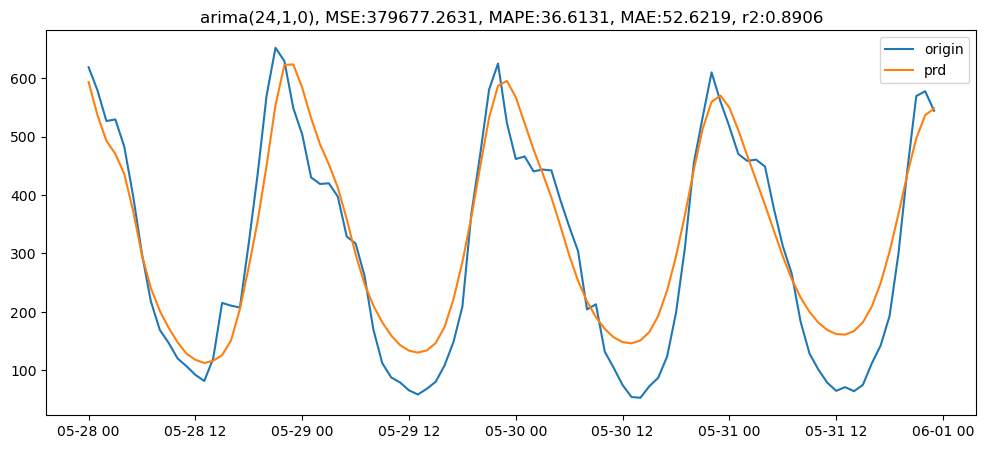

In [24]:
use_arima(df_cons0, p=24, d=1, q=0, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

<class 'pandas.core.frame.DataFrame'>


,0
datetime,
2023-05-28 00:00:00,589.411682
2023-05-28 01:00:00,532.134827
2023-05-28 02:00:00,493.017303
2023-05-28 03:00:00,475.124878
2023-05-28 04:00:00,440.363708
...,...
2023-05-31 19:00:00,346.386414
2023-05-31 20:00:00,418.987152
2023-05-31 21:00:00,482.140839


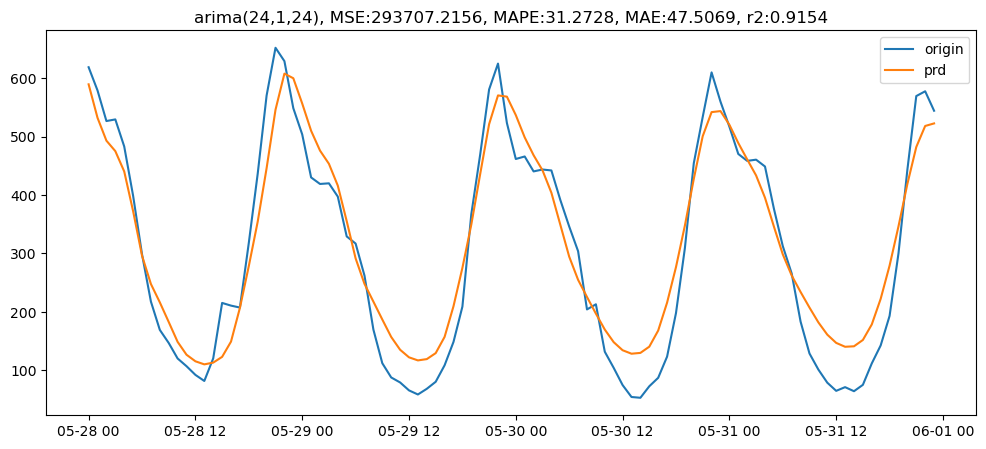

In [25]:
use_arima(df_cons0, p=24, d=1, q=24, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_mo

<class 'pandas.core.frame.DataFrame'>


,0
datetime,
2023-05-28 00:00:00,593.362488
2023-05-28 01:00:00,536.699524
2023-05-28 02:00:00,493.003876
2023-05-28 03:00:00,470.881836
2023-05-28 04:00:00,436.618347
...,...
2023-05-31 19:00:00,367.261078
2023-05-31 20:00:00,435.532257
2023-05-31 21:00:00,496.197021


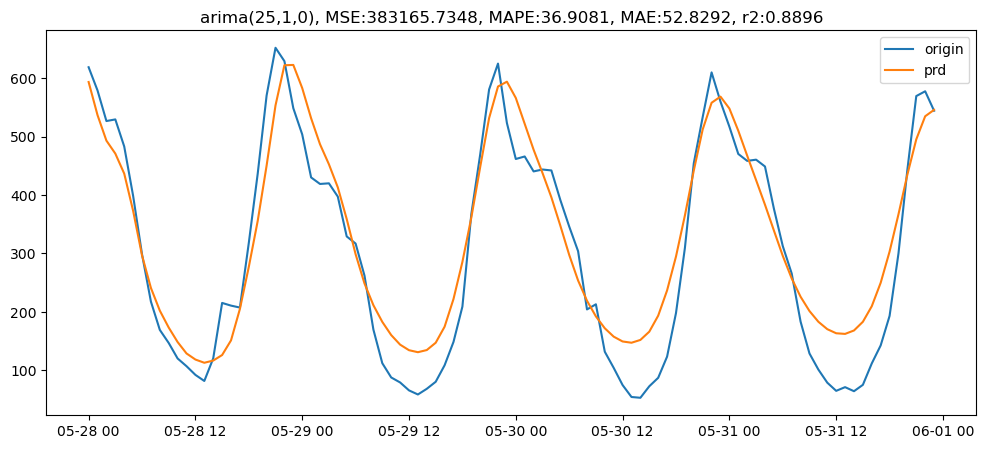

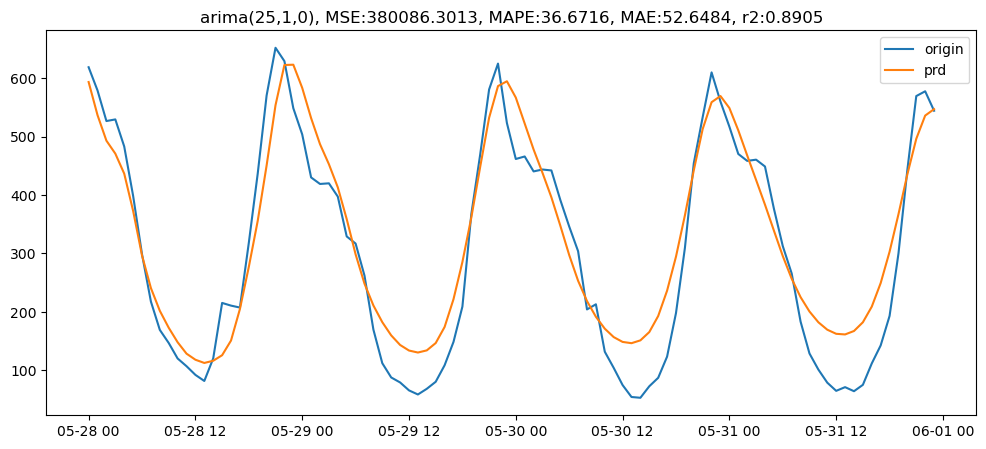

In [26]:
use_arima(df_cons0, p=25, d=1, q=0, scale=False)
use_arima(df_cons0, p=25, d=1, q=0, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

<class 'pandas.core.frame.DataFrame'>


,0
datetime,
2023-05-28 00:00:00,588.748596
2023-05-28 01:00:00,535.490662
2023-05-28 02:00:00,501.341156
2023-05-28 03:00:00,484.120300
2023-05-28 04:00:00,456.245239
...,...
2023-05-31 19:00:00,367.616699
2023-05-31 20:00:00,409.870270
2023-05-31 21:00:00,441.987152


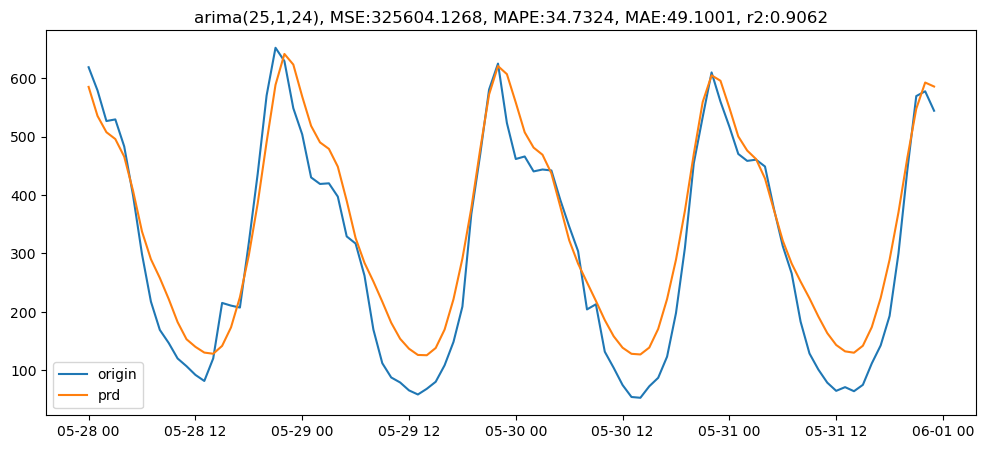

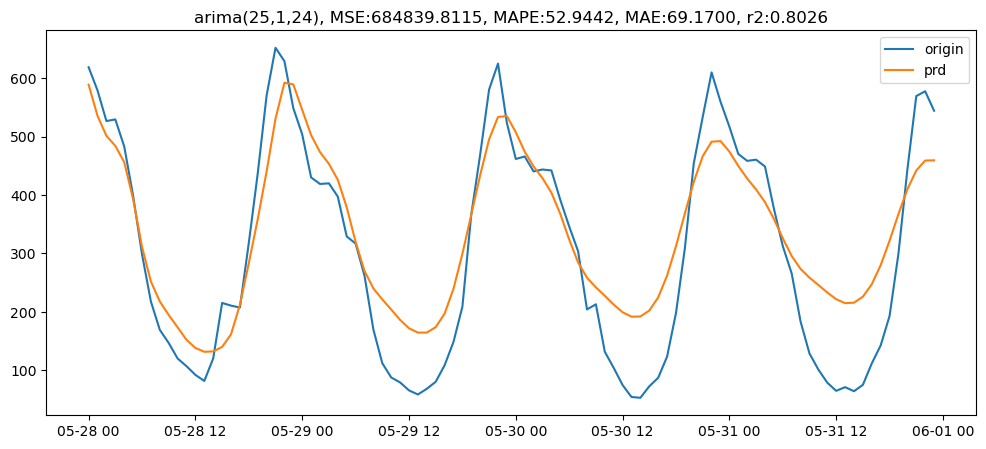

In [27]:
use_arima(df_cons0, p=25, d=1, q=24, scale=False)
use_arima(df_cons0, p=25, d=1, q=24, scale=True)

### multiarima

- prod0
    - 24, 0, 24, scale=False 
    - 26, 0, 24, scale=False
    - 26, 0, 31, scale=False -> best
    - 위의 두 개는 비슷

- cons0
    - 24, 1, 24, scale=False -> best
    - 25, 0, 24, scale=False
    - 26, 0, 0, scale=True

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmo

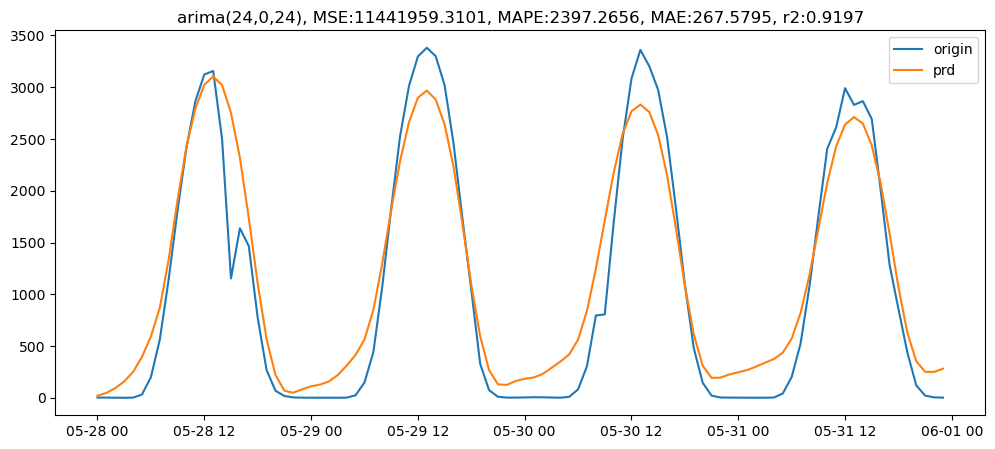

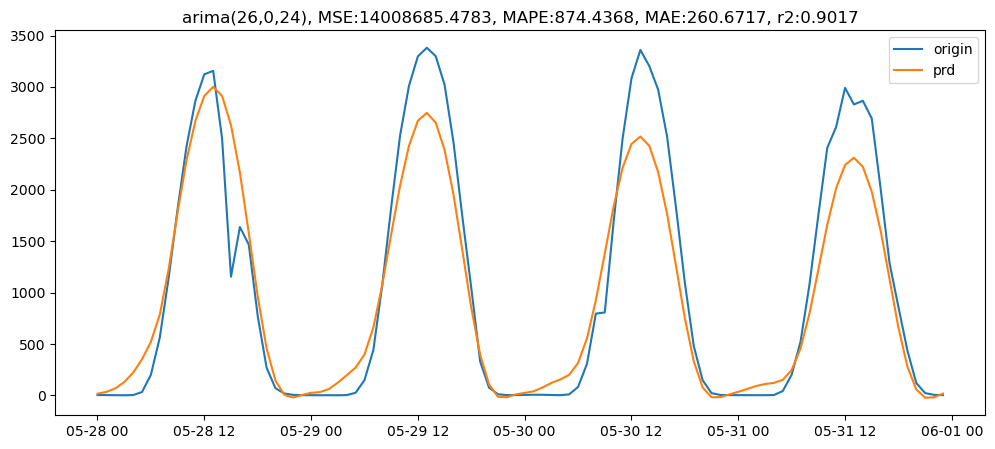

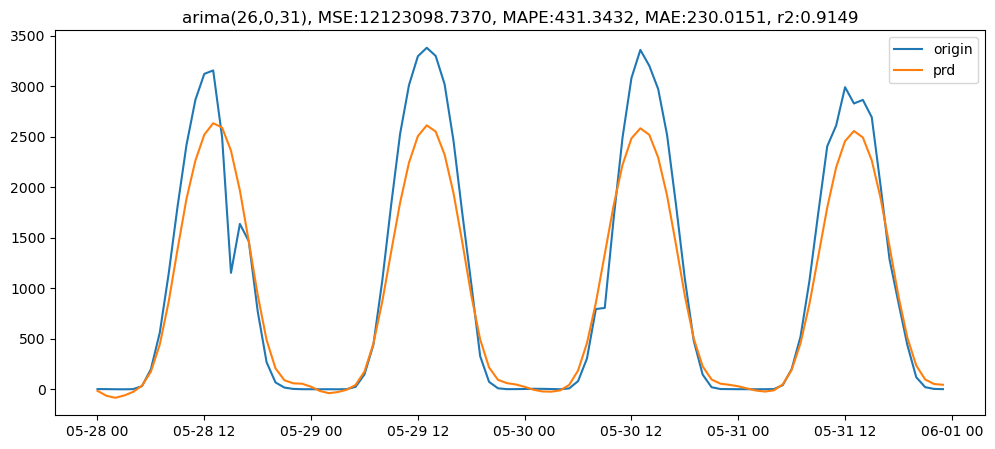

In [32]:
prod_24024 = use_arima(df_prod0, p=24, d=0, q=24, scale=False)
prod_26024 = use_arima(df_prod0, p=26, d=0, q=24, scale=False)
prod_26031 = use_arima(df_prod0, p=26, d=0, q=31, scale=False)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmo

<class 'pandas.core.frame.DataFrame'>


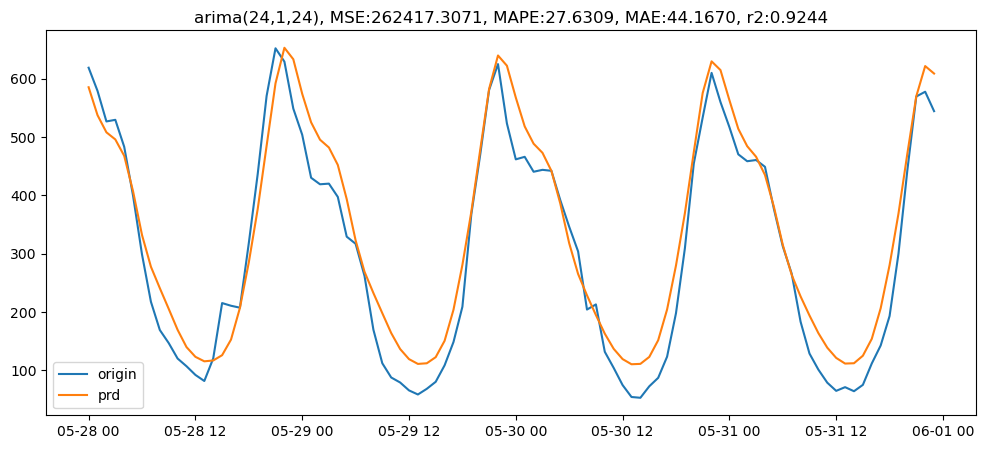

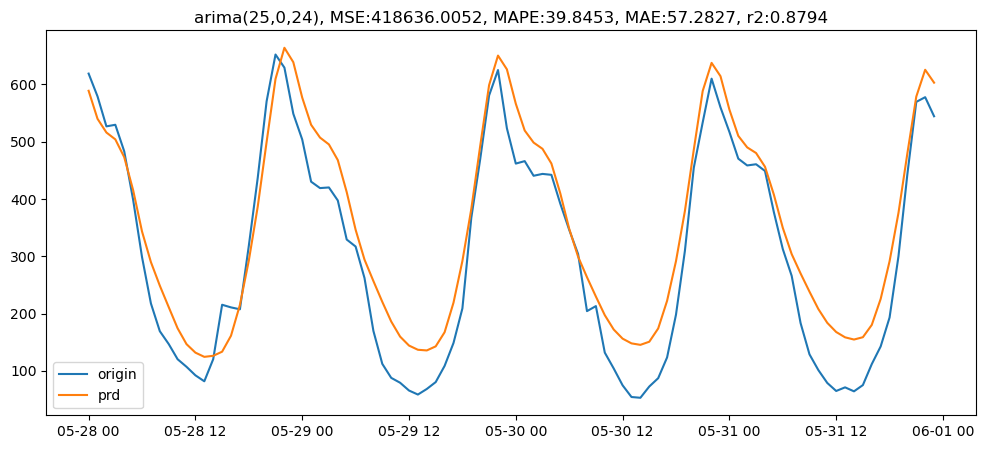

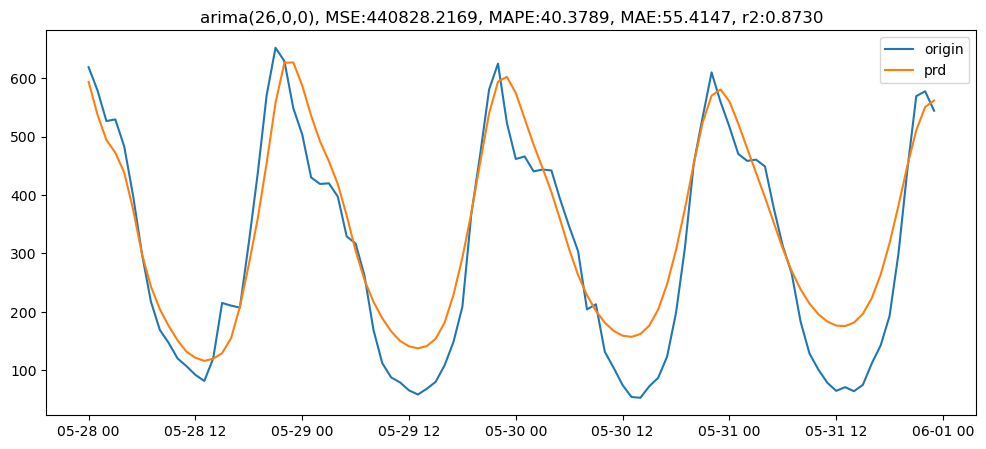

In [33]:
cons_24124 = use_arima(df_cons0, p=24, d=1, q=24, scale=False)
cons_25024 = use_arima(df_cons0, p=25, d=0, q=24, scale=False)
cons_2600 = use_arima(df_cons0, p=26, d=0, q=0, scale=True)

In [34]:
prod_24024 = pd.DataFrame(prod_24024)
prod_26024 = pd.DataFrame(prod_26024)
prod_26031 = pd.DataFrame(prod_26031)

cons_24124 = pd.DataFrame(cons_24124)
cons_25024 = pd.DataFrame(cons_25024)
cons_2600 = pd.DataFrame(cons_2600)

In [43]:
cons_2600.rename(columns={0:'predicted_mean'}, inplace=True)
cons_2600

,predicted_mean
datetime,
2023-05-28 00:00:00,593.668701
2023-05-28 01:00:00,537.429443
2023-05-28 02:00:00,494.189270
2023-05-28 03:00:00,472.474915
2023-05-28 04:00:00,438.570892
...,...
2023-05-31 19:00:00,381.903442
2023-05-31 20:00:00,450.175018
2023-05-31 21:00:00,510.834625


In [44]:
prod_24024_24124 = prod_24024.predicted_mean - cons_24124.predicted_mean
prod_24024_25024 = prod_24024.predicted_mean - cons_25024.predicted_mean
prod_24024_2600  = prod_24024.predicted_mean - cons_2600.predicted_mean

prod_26024_24124 = prod_26024.predicted_mean - cons_24124.predicted_mean
prod_26024_25024 = prod_26024.predicted_mean - cons_25024.predicted_mean
prod_26024_2600  = prod_26024.predicted_mean - cons_2600.predicted_mean

prod_26031_24124 = prod_26031.predicted_mean - cons_24124.predicted_mean
prod_26031_25024 = prod_26031.predicted_mean - cons_25024.predicted_mean
prod_26031_2600  = prod_26031.predicted_mean - cons_2600.predicted_mean

In [50]:
multiarima_name_list = ['prod_24024_24124','prod_24024_25024','prod_24024_2600','prod_26024_24124','prod_26024_25024','prod_26024_2600','prod_26031_24124','prod_26031_25024','prod_26031_2600']

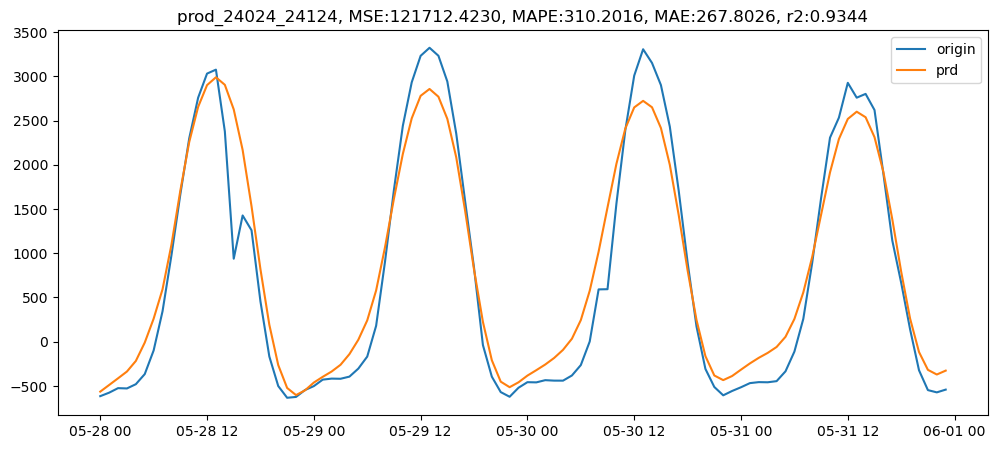

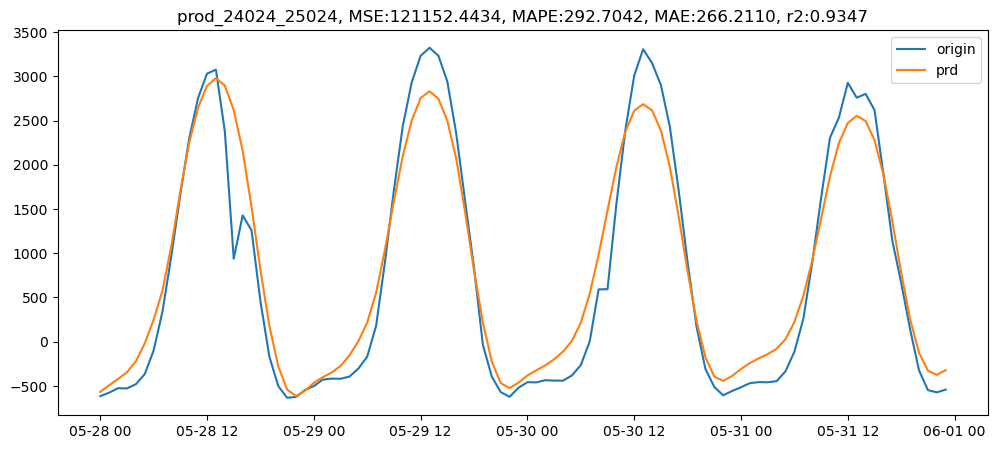

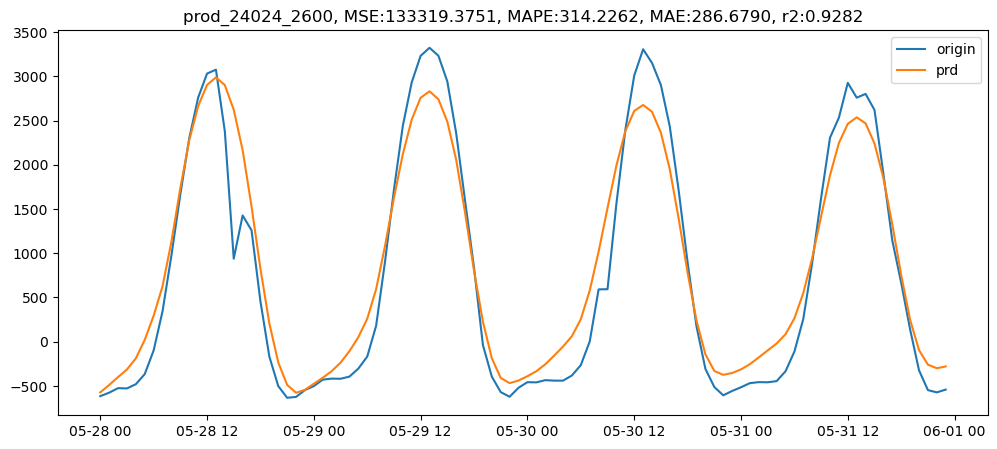

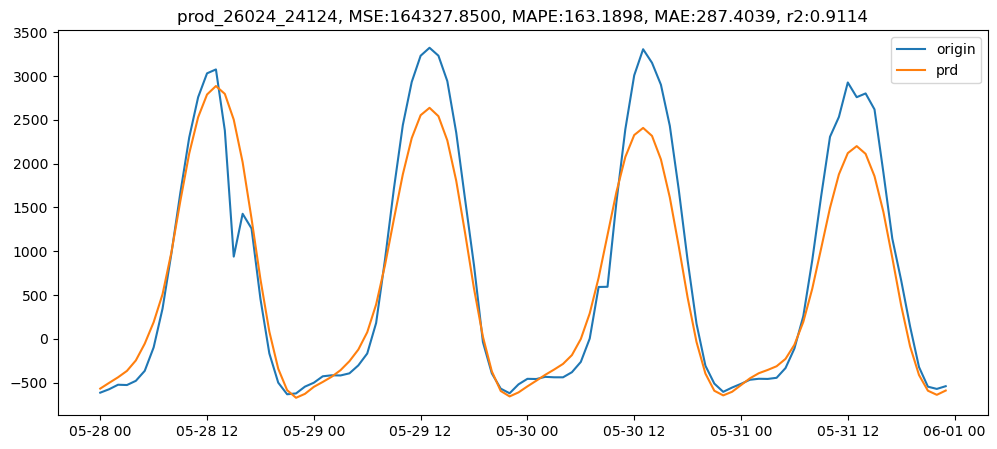

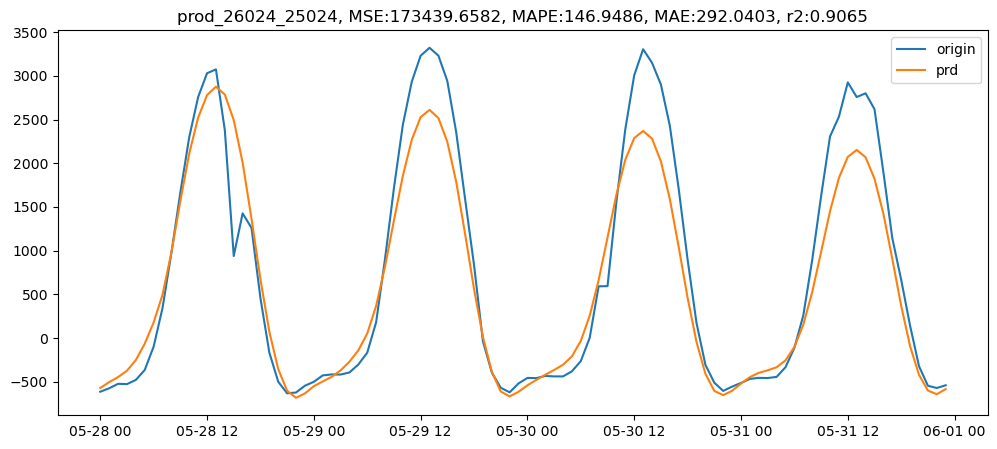

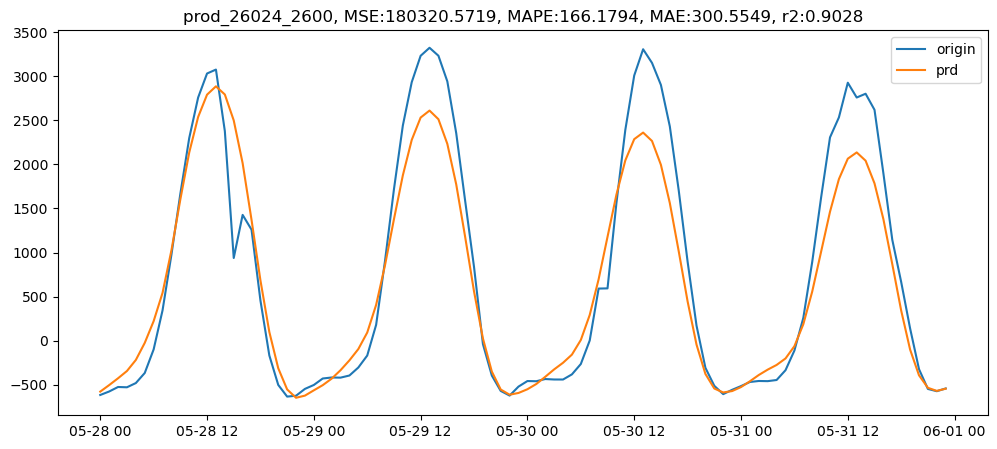

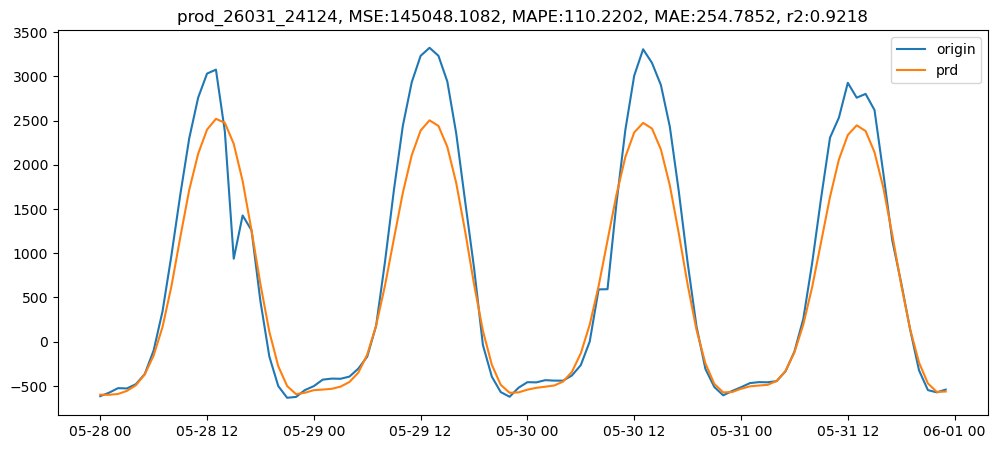

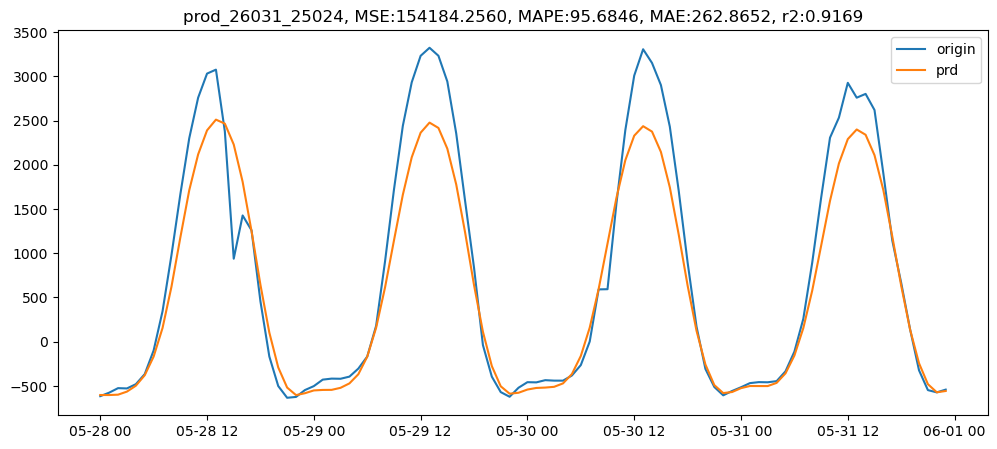

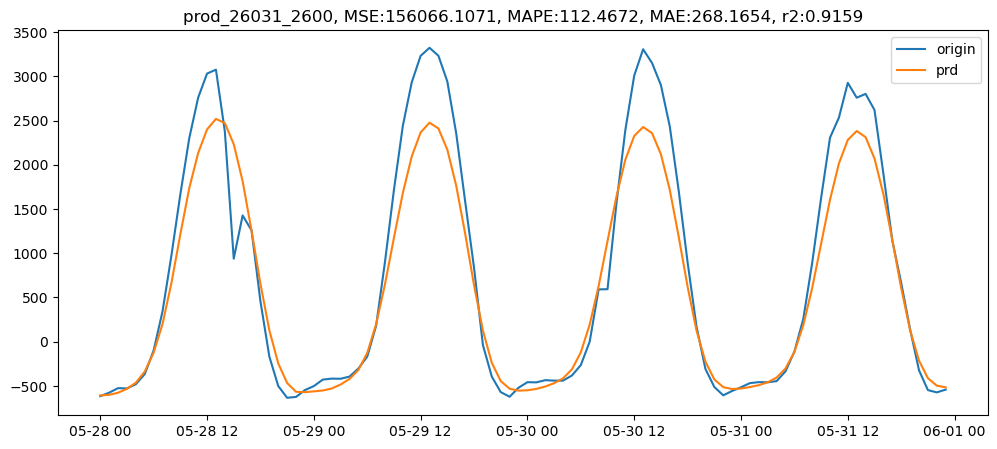

In [55]:
multiarima_name_list = ['prod_24024_24124','prod_24024_25024','prod_24024_2600','prod_26024_24124','prod_26024_25024','prod_26024_2600','prod_26031_24124','prod_26031_25024','prod_26031_2600']
multiarima_list = [prod_24024_24124,prod_24024_25024,prod_24024_2600,prod_26024_24124,prod_26024_25024,prod_26024_2600,prod_26031_24124,prod_26031_25024,prod_26031_2600]

tst_size = 96

for i, arima in enumerate(multiarima_list):
    tst = df_pc0[-tst_size:].target
    plt.figure(figsize=(12,5))
    plt.plot(tst, label='origin')
    plt.plot(arima, label='prd')
    plt.legend()
    plt.title(f'{multiarima_name_list[i]}, MSE:{mse(tst, arima):.4f}, MAPE:{mape(tst, arima)*100:.4f}, MAE:{mae(tst, arima):.4f}, r2:{r2_score(tst, arima):.4f}')

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'pandas.core.frame.DataFrame'>


/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

<class 'pandas.core.frame.DataFrame'>


TypeError: Index(...) must be called with a collection of some kind, 'predicted_mean' was passed

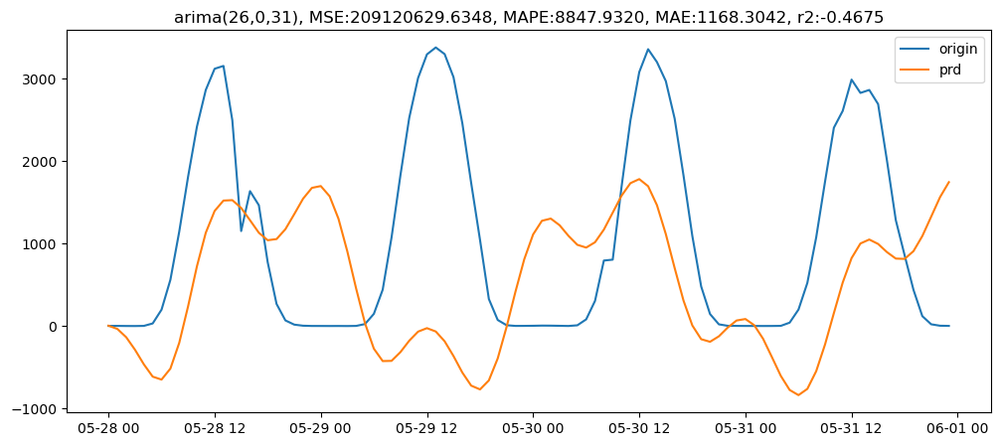

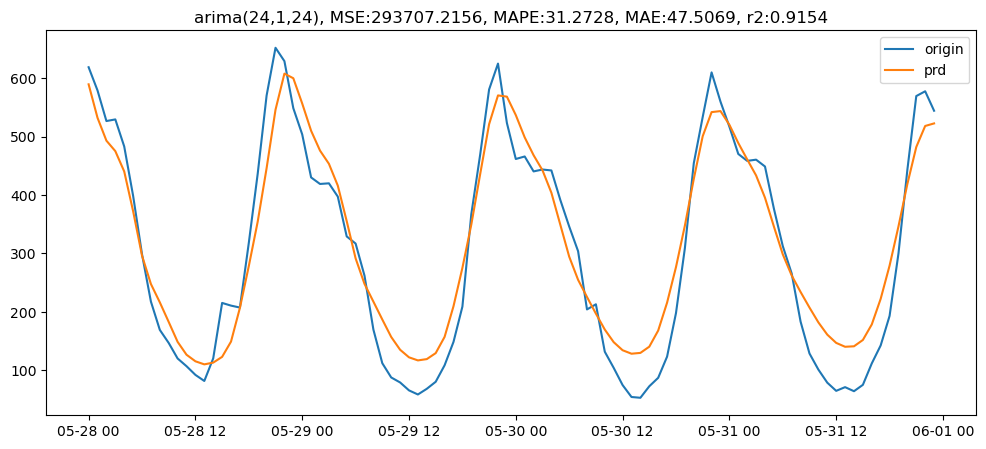

In [72]:
prd_prod0 = use_arima(df_prod0, p=26, d=0, q=31, scale=True)
prd_cons0 = use_arima(df_cons0, p=24, d=1, q=24, scale=True)
prd_prod0 = pd.DataFrame(prd_prod0, columns='predicted_mean')
prd_cons0 = pd.DataFrame(prd_cons0, columns='predicted_mean')


In [75]:
prd_prod0 = prd_prod0.rename(columns={0:'predicted_mean'})

In [77]:
prd_cons0 = prd_cons0.rename(columns={0:'predicted_mean'})

Text(0.5, 1.0, 'arima, MSE:2182099.8645, MAPE:521.5140, MAE:1191.8507, r2:-0.1759')

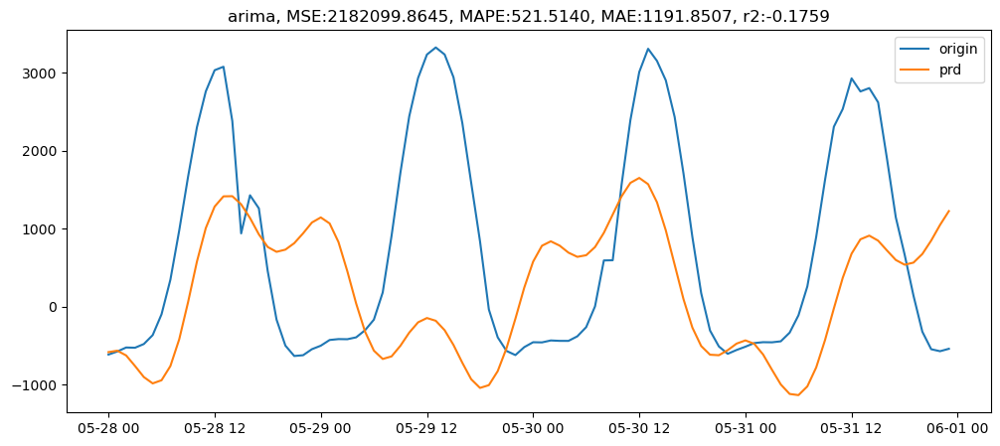

In [78]:
prd_pc0 = prd_prod0.predicted_mean- prd_cons0.predicted_mean
tst_size = 96
tst = df_pc0[-tst_size:].target

plt.figure(figsize=(12,5))
plt.plot(tst, label='origin')
plt.plot(prd_pc0, label='prd')
plt.legend()
plt.title(f'arima, MSE:{mse(tst, prd_pc0):.4f}, MAPE:{mape(tst, prd_pc0)*100:.4f}, MAE:{mae(tst, prd_pc0):.4f}, r2:{r2_score(tst, prd_pc0):.4f}')

## task 2
- q = 8, 9, 32

In [58]:
def acf_pacf_plot(timeseries:pd.DataFrame, target_name:str):
    fig = plt.figure(figsize=(12,6))
    ax1 = fig.add_subplot(211)
    fig = plot_acf(timeseries[target_name].squeeze(), lags=100, ax=ax1)
    ax2 = fig.add_subplot(212)
    fig = plot_pacf(timeseries[target_name].squeeze(), lags=100, ax=ax2)

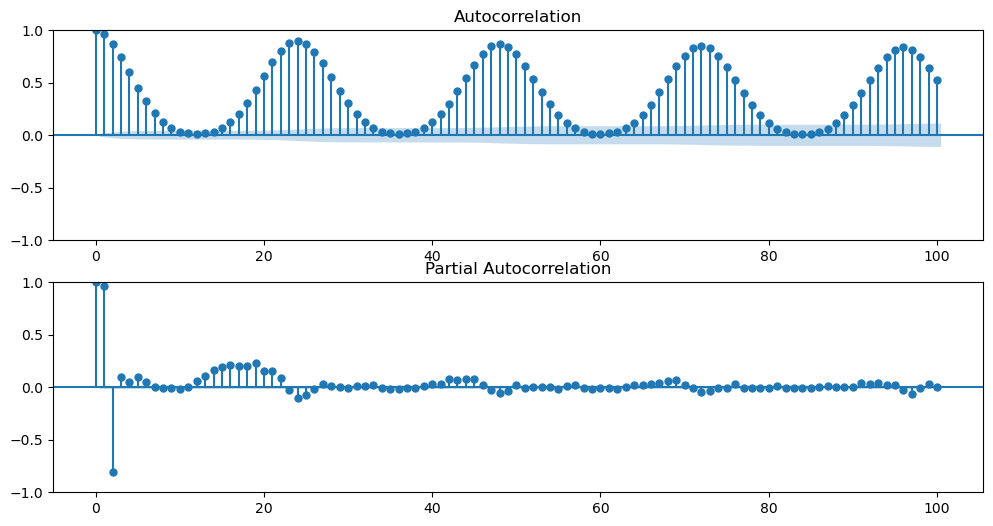

In [60]:
acf_pacf_plot(df_pc0, 'target')

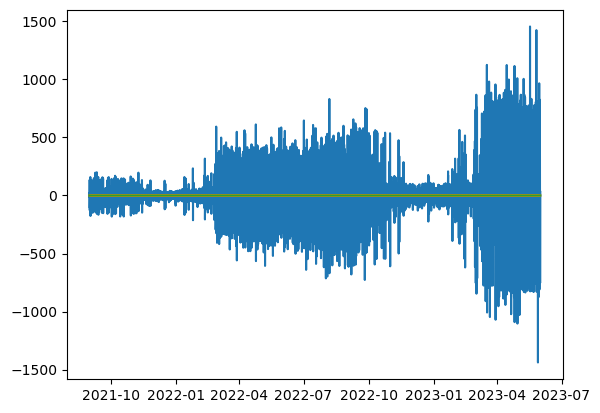

In [84]:
plt.plot(df_pc0.diff(1))

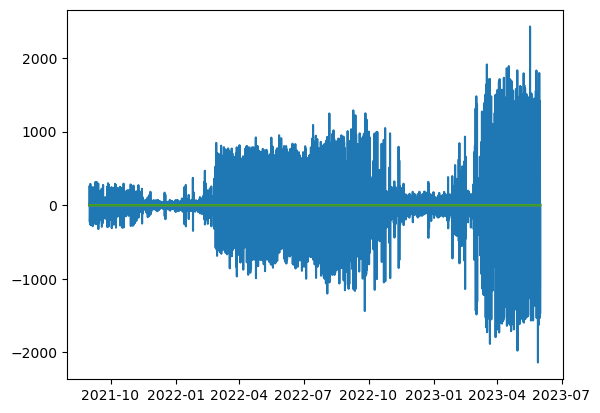

In [85]:
plt.plot(df_pc0.diff(2))

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2023-05-28 00:00:00   -590.039242
2023-05-28 01:00:00   -530.281067
2023-05-28 02:00:00   -481.343666
2023-05-28 03:00:00   -433.774233
2023-05-28 04:00:00   -359.957719
                          ...    
2023-05-31 19:00:00    191.322574
2023-05-31 20:00:00   -139.455878
2023-05-31 21:00:00   -379.830552
2023-05-31 22:00:00   -529.275679
2023-05-31 23:00:00   -599.745007
Freq: H, Name: predicted_mean, Length: 96, dtype: float64

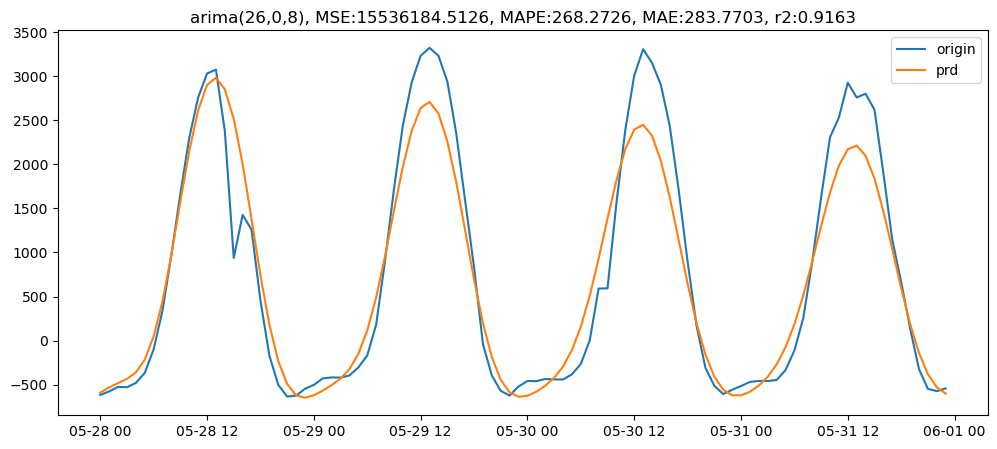

In [61]:
use_arima(df_pc0, p=26, d=0, q=8, scale=False)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'pandas.core.frame.DataFrame'>


,0
datetime,
2023-05-28 00:00:00,-588.193176
2023-05-28 01:00:00,-531.519592
2023-05-28 02:00:00,-489.469452
2023-05-28 03:00:00,-446.637329
2023-05-28 04:00:00,-378.303802
...,...
2023-05-31 19:00:00,56.590755
2023-05-31 20:00:00,-229.737366
2023-05-31 21:00:00,-435.552155


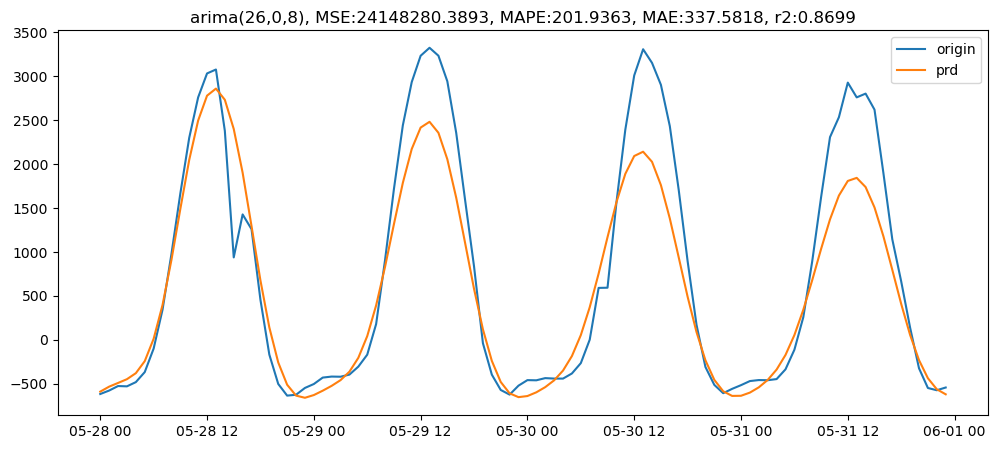

In [62]:
use_arima(df_pc0, p=26, d=0, q=8, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2023-05-28 00:00:00   -590.111301
2023-05-28 01:00:00   -530.963402
2023-05-28 02:00:00   -481.642698
2023-05-28 03:00:00   -434.763635
2023-05-28 04:00:00   -362.106641
                          ...    
2023-05-31 19:00:00    213.776772
2023-05-31 20:00:00   -112.578021
2023-05-31 21:00:00   -351.518825
2023-05-31 22:00:00   -502.495572
2023-05-31 23:00:00   -577.055171
Freq: H, Name: predicted_mean, Length: 96, dtype: float64

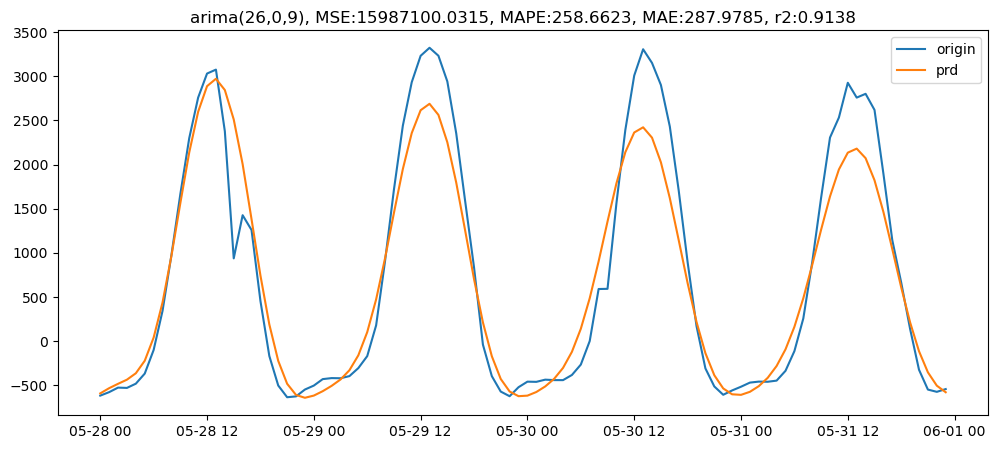

In [63]:
use_arima(df_pc0, p=26, d=0, q=9, scale=False)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'pandas.core.frame.DataFrame'>


,0
datetime,
2023-05-28 00:00:00,-592.853577
2023-05-28 01:00:00,-535.116455
2023-05-28 02:00:00,-489.534210
2023-05-28 03:00:00,-445.569031
2023-05-28 04:00:00,-374.614685
...,...
2023-05-31 19:00:00,230.336258
2023-05-31 20:00:00,-43.266987
2023-05-31 21:00:00,-241.895477


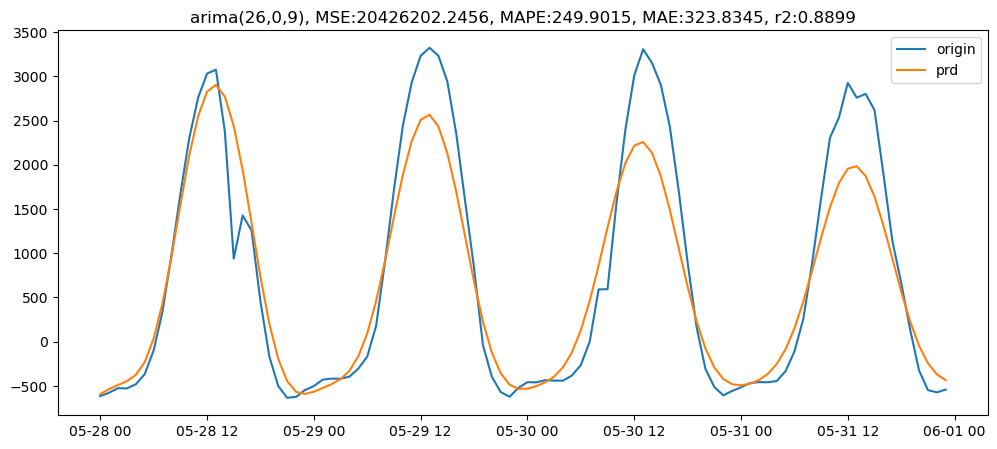

In [64]:
use_arima(df_pc0, p=26, d=0, q=9, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

2023-05-28 00:00:00   -567.845588
2023-05-28 01:00:00   -492.269236
2023-05-28 02:00:00   -442.997860
2023-05-28 03:00:00   -401.858580
2023-05-28 04:00:00   -336.804391
                          ...    
2023-05-31 19:00:00    168.101644
2023-05-31 20:00:00   -213.233889
2023-05-31 21:00:00   -459.531832
2023-05-31 22:00:00   -582.926040
2023-05-31 23:00:00   -616.537650
Freq: H, Name: predicted_mean, Length: 96, dtype: float64

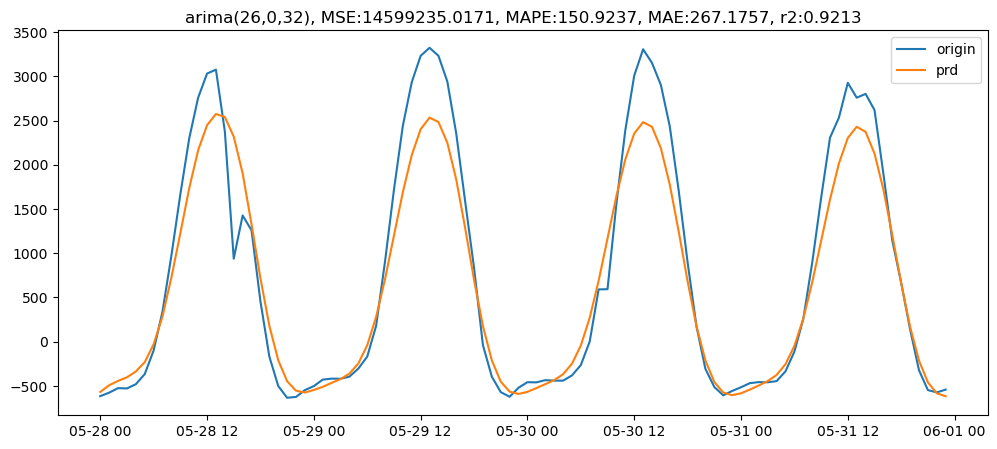

In [65]:
use_arima(df_pc0, p=26, d=0, q=32, scale=False)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

<class 'pandas.core.frame.DataFrame'>


,0
datetime,
2023-05-28 00:00:00,-585.125549
2023-05-28 01:00:00,-534.566101
2023-05-28 02:00:00,-529.693420
2023-05-28 03:00:00,-581.669556
2023-05-28 04:00:00,-678.027222
...,...
2023-05-31 19:00:00,-515.005371
2023-05-31 20:00:00,-648.191040
2023-05-31 21:00:00,-676.031494


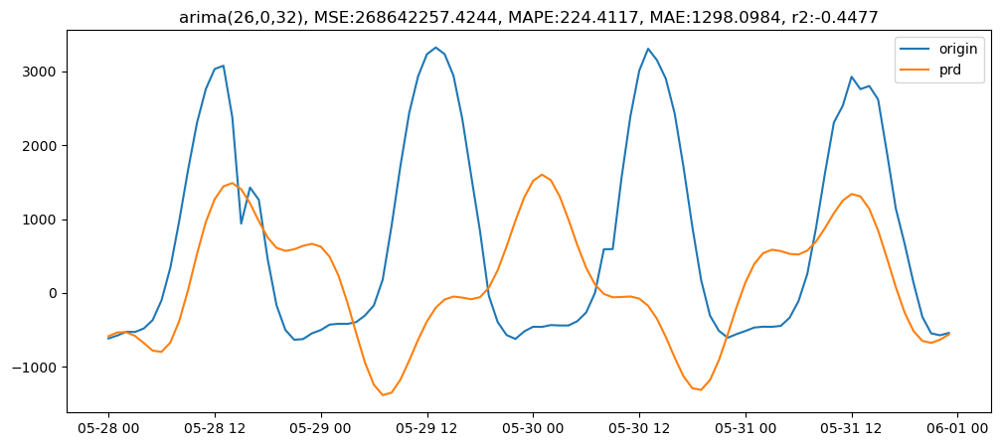

In [66]:
use_arima(df_pc0, p=26, d=0, q=32, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

2023-05-28 00:00:00   -561.616867
2023-05-28 01:00:00   -516.726089
2023-05-28 02:00:00   -478.660210
2023-05-28 03:00:00   -438.807650
2023-05-28 04:00:00   -373.802429
                          ...    
2023-05-31 19:00:00    211.485738
2023-05-31 20:00:00   -191.117663
2023-05-31 21:00:00   -423.923815
2023-05-31 22:00:00   -509.999388
2023-05-31 23:00:00   -509.846985
Freq: H, Name: predicted_mean, Length: 96, dtype: float64

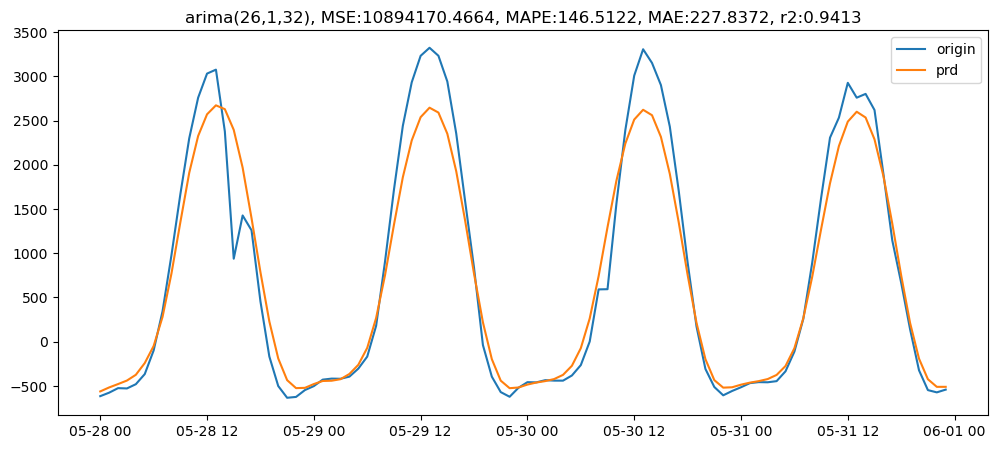

In [86]:
use_arima(df_pc0, p=26, d=1, q=32, scale=False)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

2023-05-28 00:00:00   -582.222889
2023-05-28 01:00:00   -552.071169
2023-05-28 02:00:00   -520.845517
2023-05-28 03:00:00   -482.940043
2023-05-28 04:00:00   -415.686176
                          ...    
2023-05-31 19:00:00    161.772690
2023-05-31 20:00:00   -241.179612
2023-05-31 21:00:00   -470.852243
2023-05-31 22:00:00   -554.004453
2023-05-31 23:00:00   -550.217056
Freq: H, Name: predicted_mean, Length: 96, dtype: float64

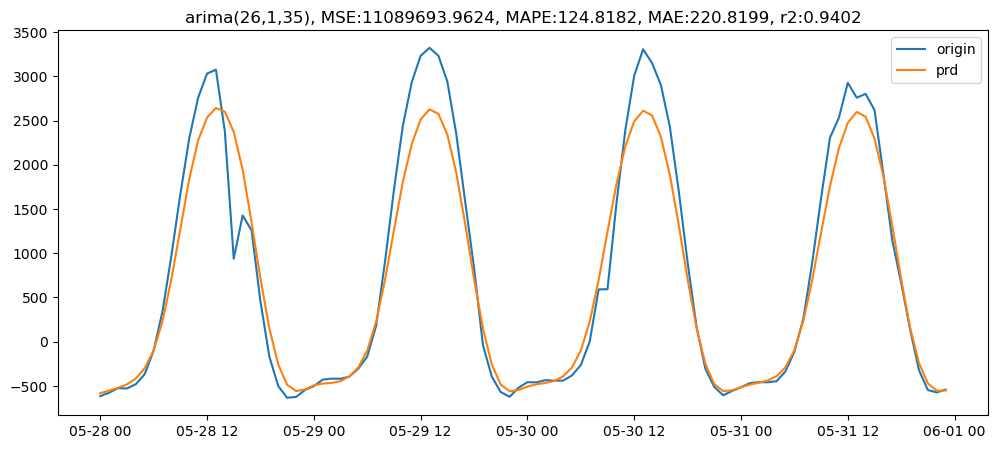

In [87]:
use_arima(df_pc0, p=26, d=1, q=35, scale=False)

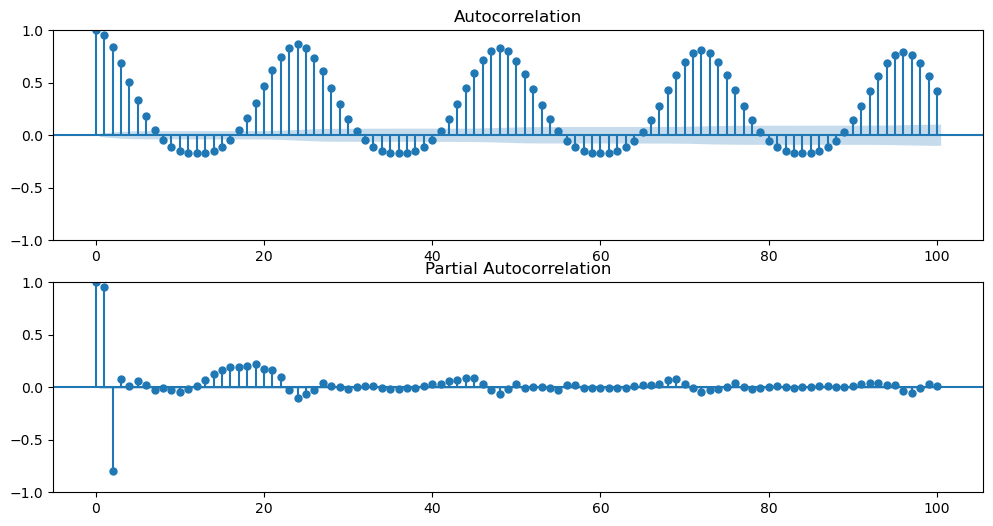

In [67]:
acf_pacf_plot(df_prod0, 'target')

- q = 31, 40, 58, 82

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

<class 'pandas.core.frame.DataFrame'>


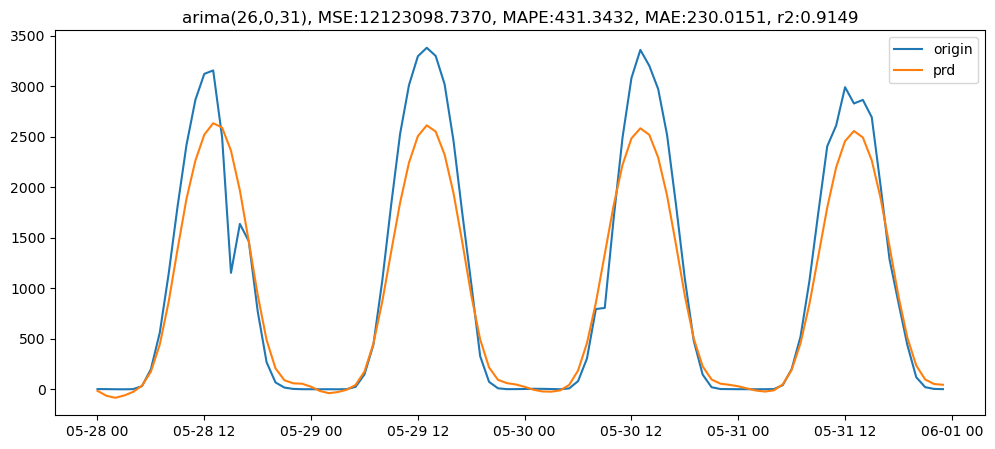

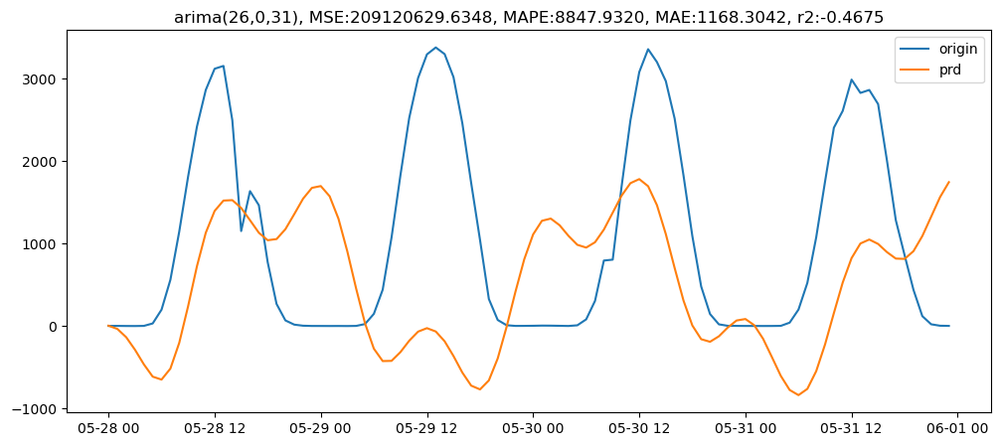

In [82]:
prod_26031_f = use_arima(df_prod0, p=26, d=0, q=31, scale=False)
prod_26031_t = use_arima(df_prod0, p=26, d=0, q=31, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmo

<class 'pandas.core.frame.DataFrame'>


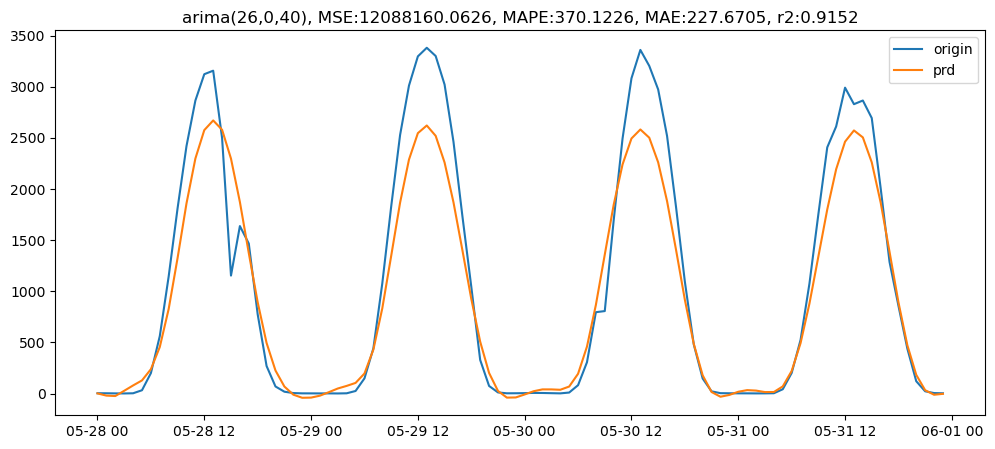

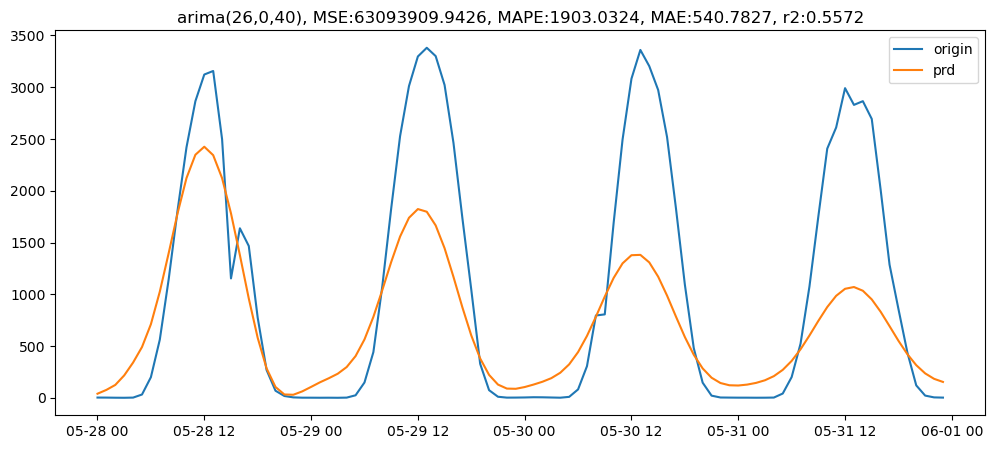

In [83]:
prod_26040_f = use_arima(df_prod0, p=26, d=0, q=40, scale=False)
prod_26040_t = use_arima(df_prod0, p=26, d=0, q=40, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

<class 'pandas.core.frame.DataFrame'>


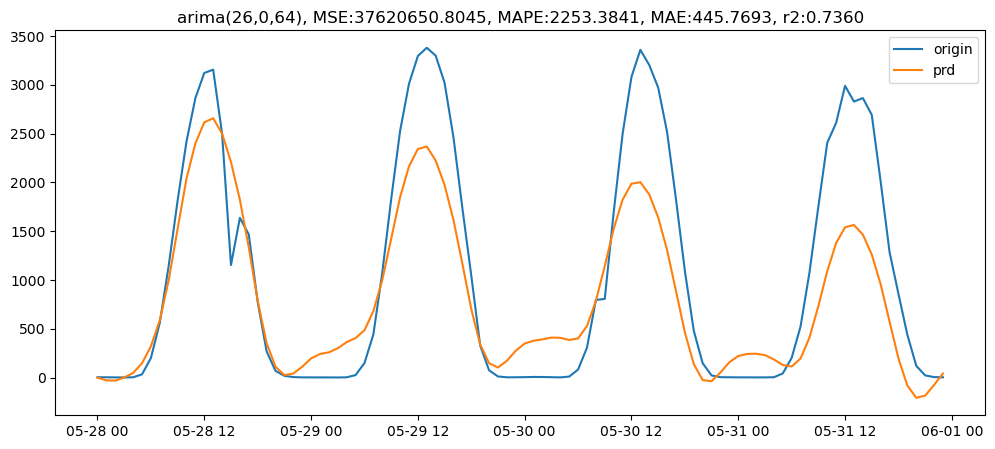

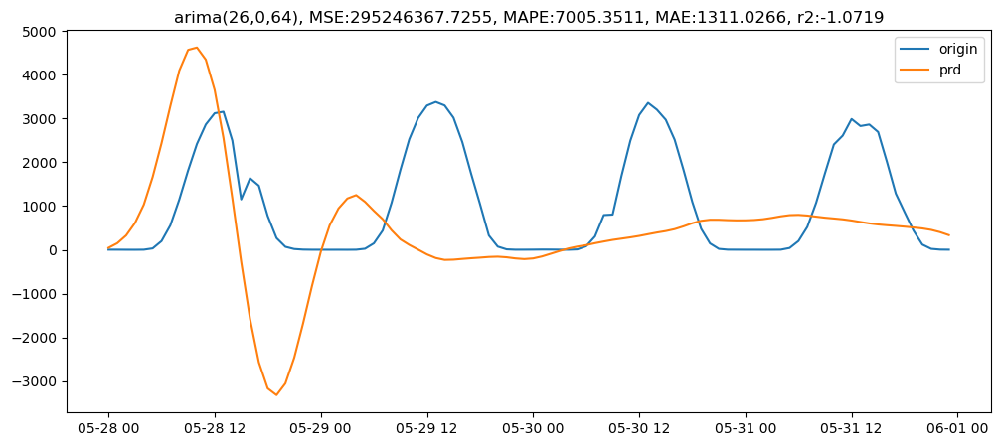

In [88]:
prod_26031_f = use_arima(df_prod0, p=26, d=0, q=64, scale=False)
prod_26031_t = use_arima(df_prod0, p=26, d=0, q=64, scale=True)

In [89]:
# prod_26031_f = use_arima(df_prod0, p=26, d=0, q=88, scale=False)
# prod_26031_t = use_arima(df_prod0, p=26, d=0, q=88, scale=True)

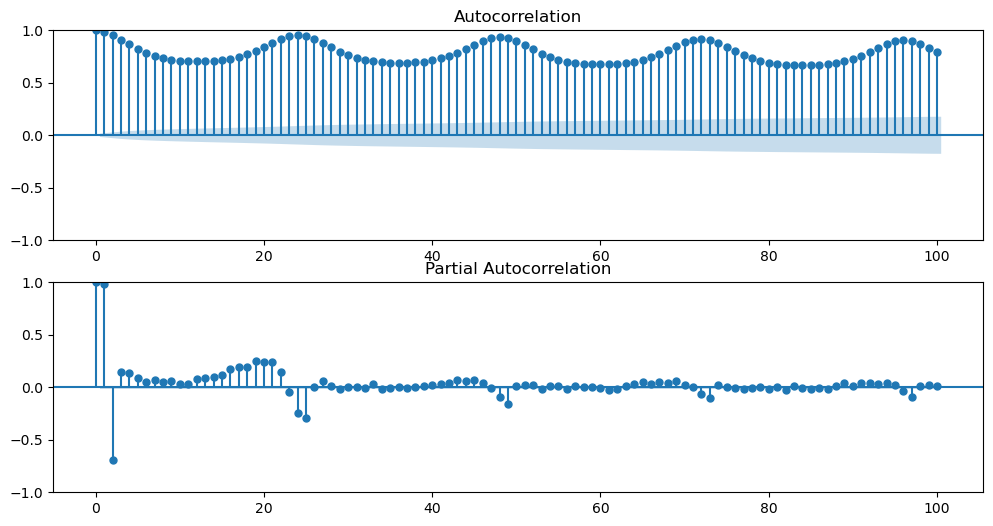

In [68]:
acf_pacf_plot(df_cons0, 'target')

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmo

<class 'pandas.core.frame.DataFrame'>


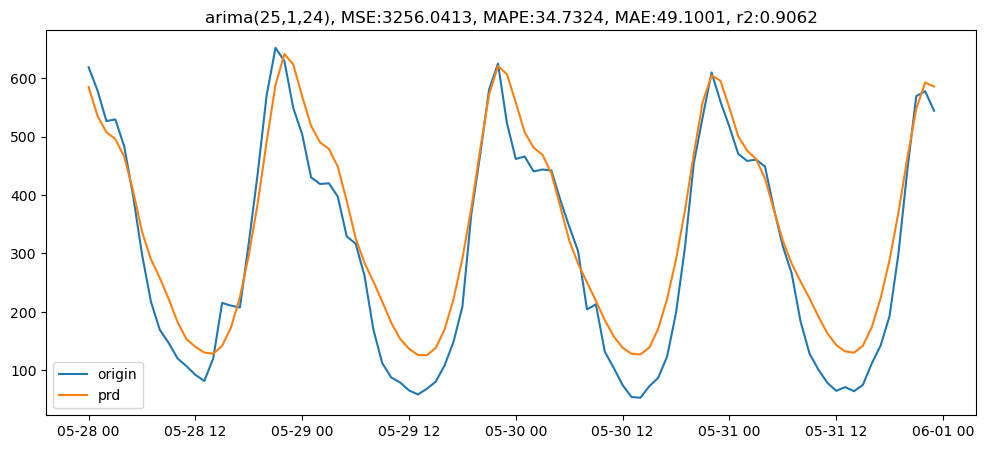

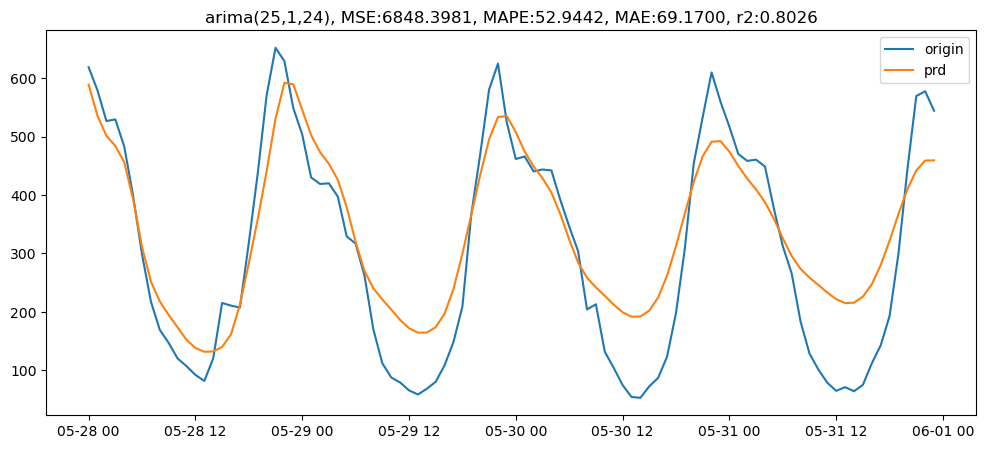

In [29]:
cons_25124_f = use_arima(df_cons0, p=25, d=1, q=24, scale=False)
cons_25124_t = use_arima(df_cons0, p=25, d=1, q=24, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_mo

<class 'pandas.core.frame.DataFrame'>


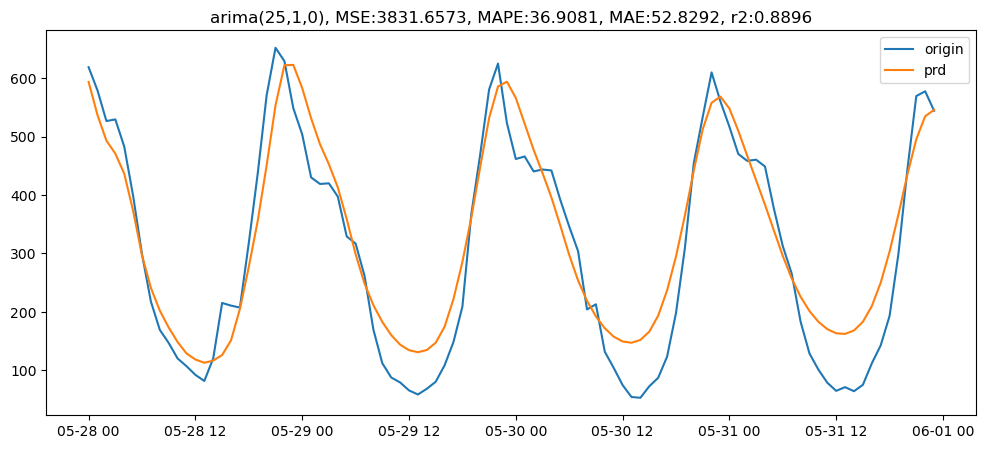

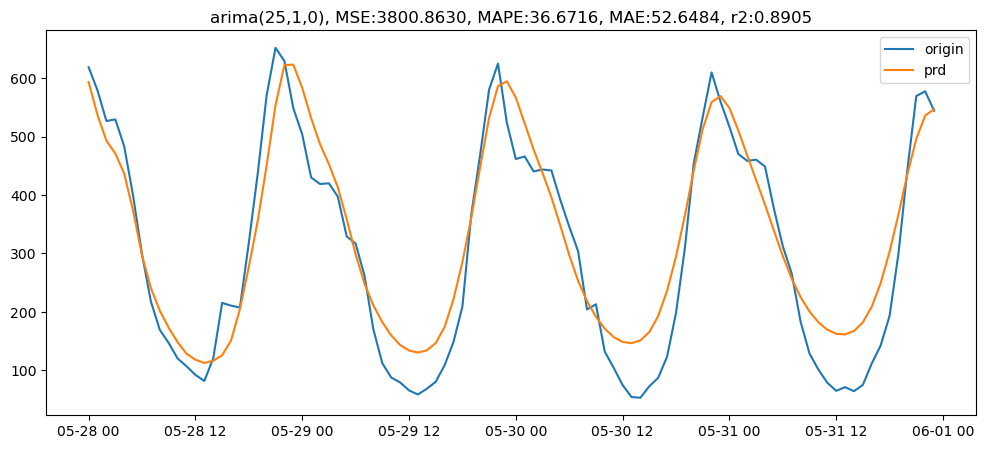

In [30]:
cons_2510_f = use_arima(df_cons0, p=25, d=1, q=0, scale=False)
cons_2510_t = use_arima(df_cons0, p=25, d=1, q=0, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


<class 'pandas.core.frame.DataFrame'>


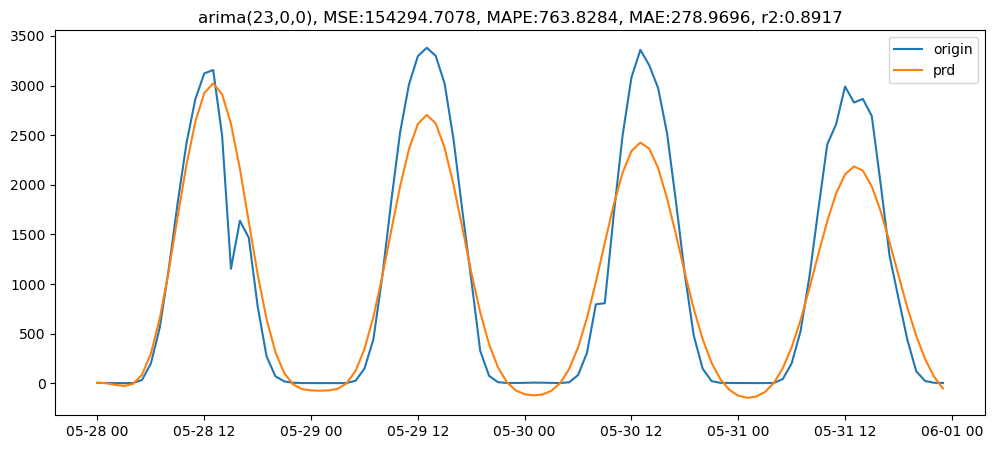

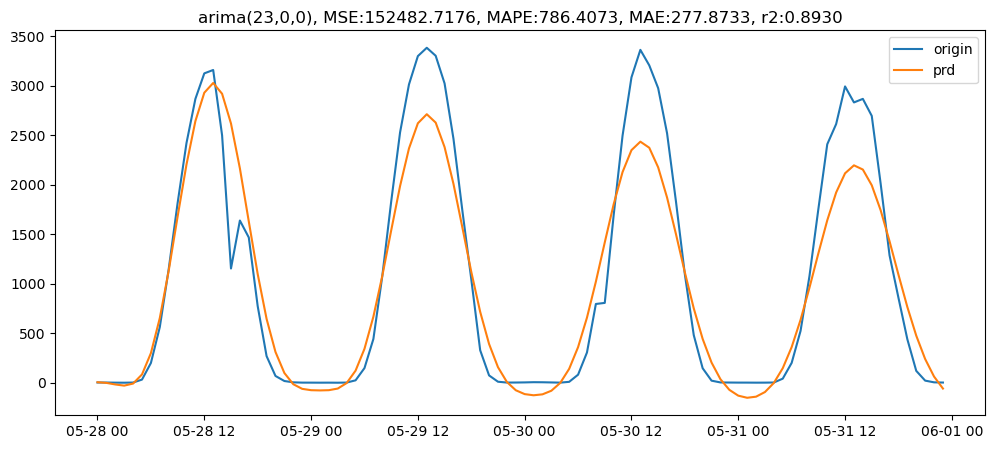

In [44]:
prd_prod2300_f = use_arima(df_prod0, p=23, d=0, q=0, scale=False)
prd_prod2300_t = use_arima(df_prod0, p=23, d=0, q=0, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmo

<class 'pandas.core.frame.DataFrame'>


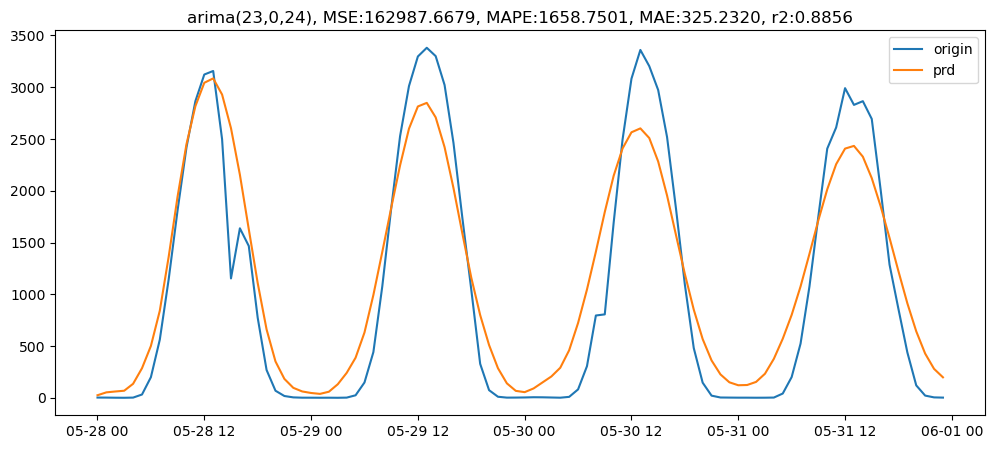

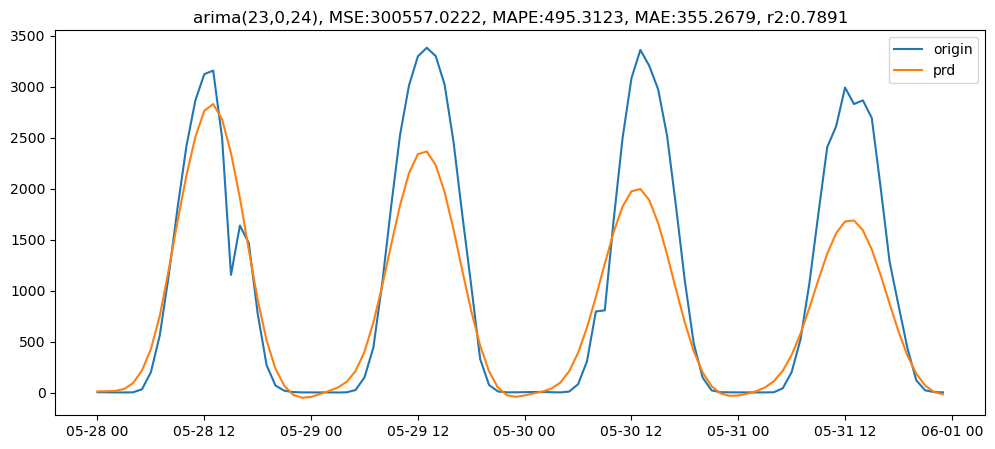

In [42]:
prd_prod23024_f = use_arima(df_prod0, p=23, d=0, q=24, scale=False)
prd_prod23024_t = use_arima(df_prod0, p=23, d=0, q=24, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

<class 'pandas.core.frame.DataFrame'>


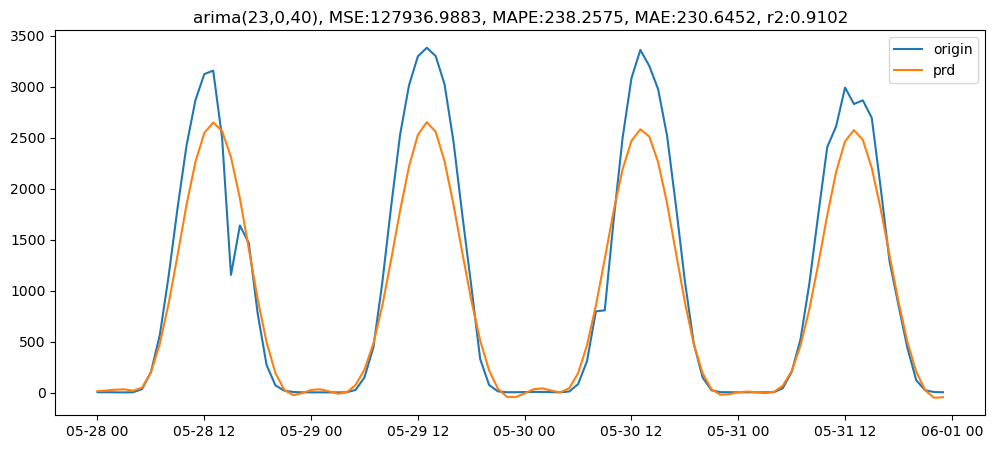

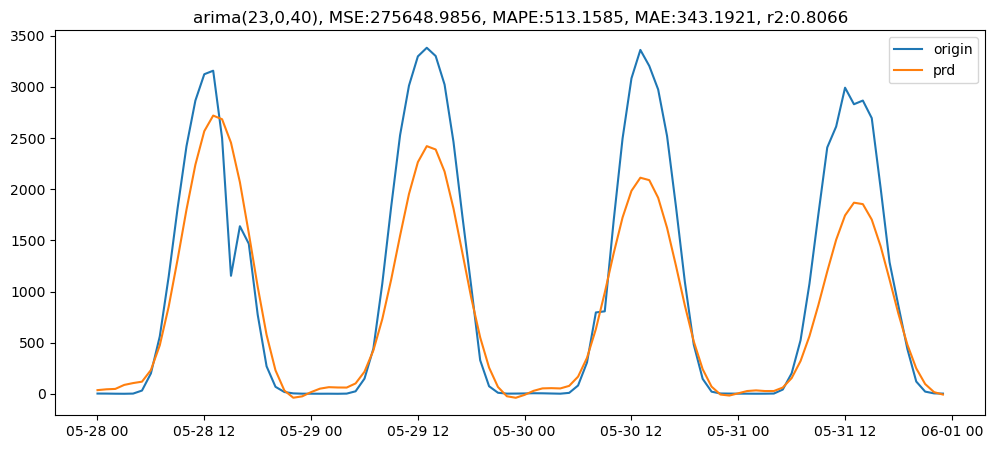

In [43]:
prd_prod23040_f = use_arima(df_prod0, p=23, d=0, q=40, scale=False)
prd_prod23040_t = use_arima(df_prod0, p=23, d=0, q=40, scale=True)

## 2024.01.11.목 보충

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmo

<class 'pandas.core.frame.DataFrame'>


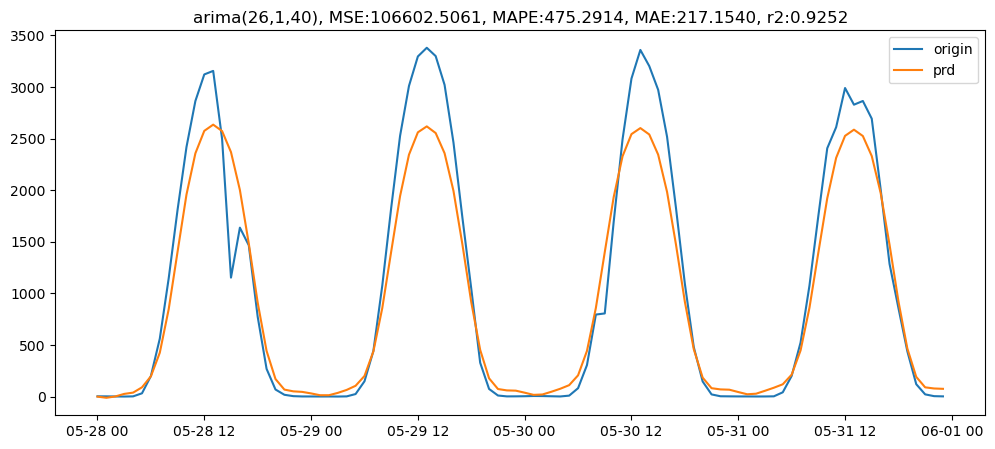

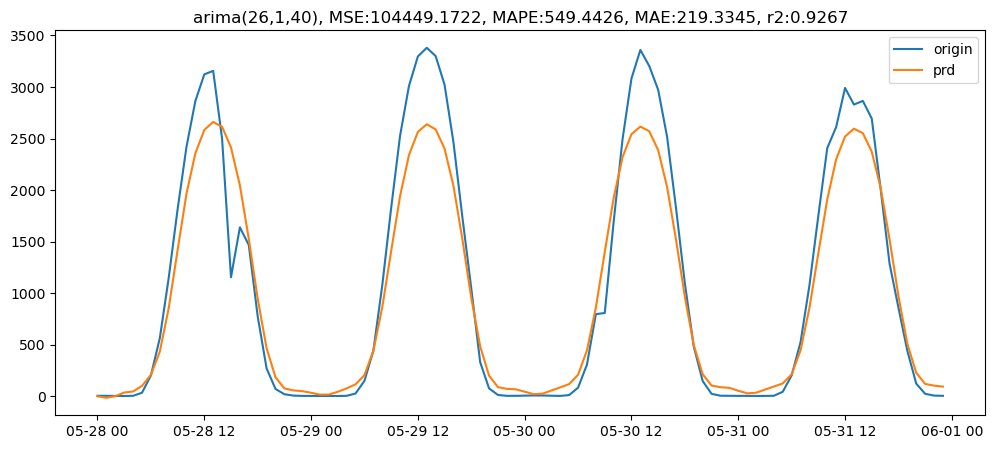

In [45]:
prd_prod26140_f = use_arima(df_prod0, p=26, d=1, q=40, scale=False)
prd_prod26140_t = use_arima(df_prod0, p=26, d=1, q=40, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmo

<class 'pandas.core.frame.DataFrame'>


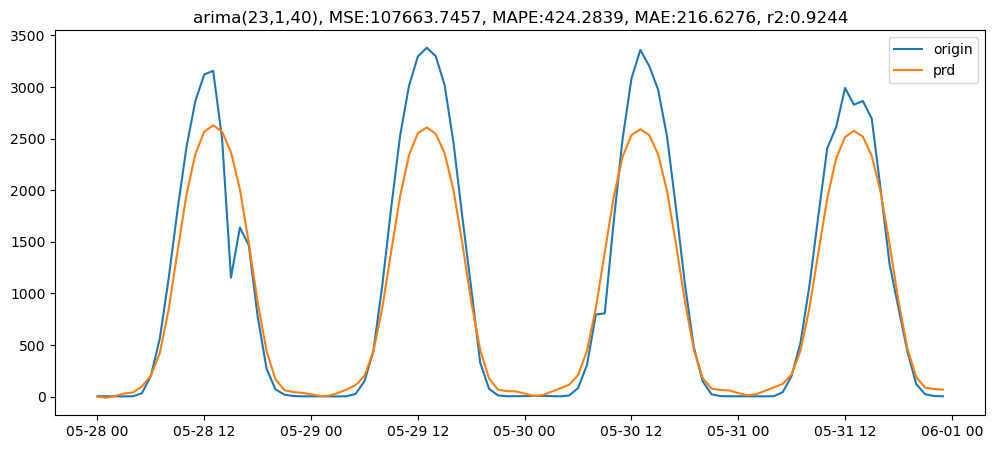

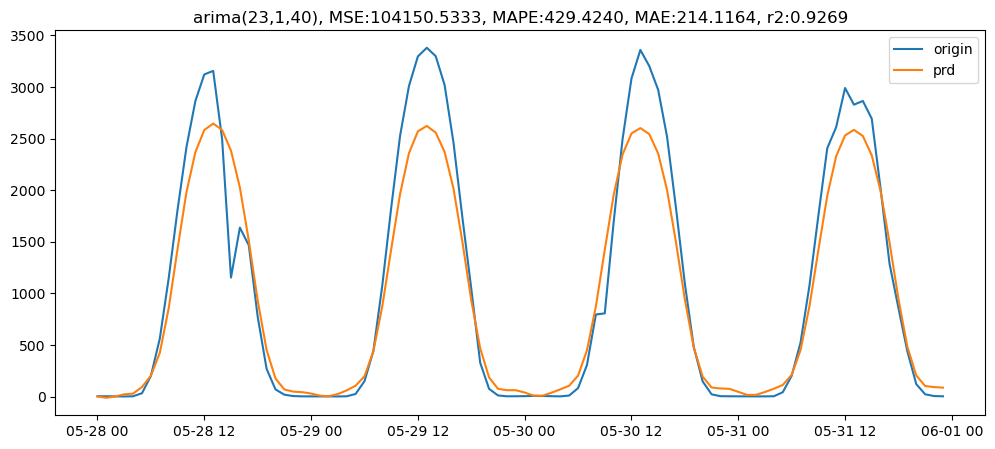

In [46]:
prd_prod23140_f = use_arima(df_prod0, p=23, d=1, q=40, scale=False)
prd_prod23140_t = use_arima(df_prod0, p=23, d=1, q=40, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

<class 'pandas.core.frame.DataFrame'>


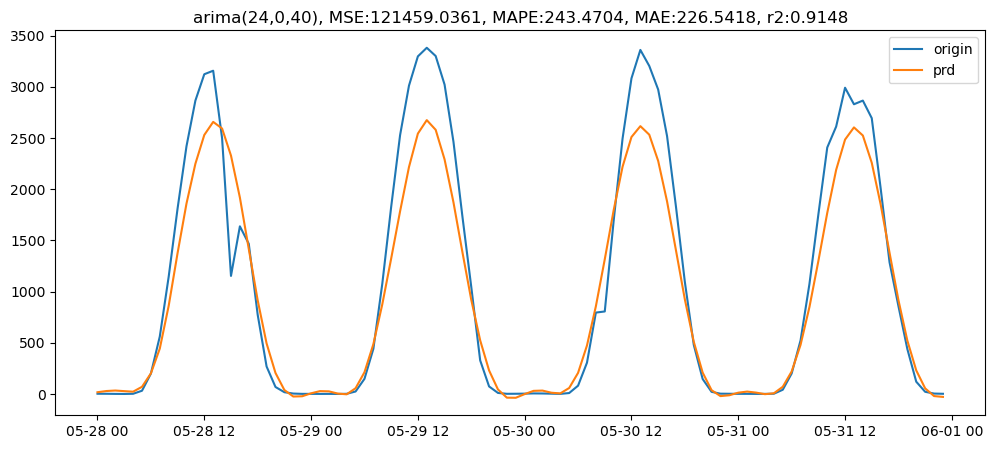

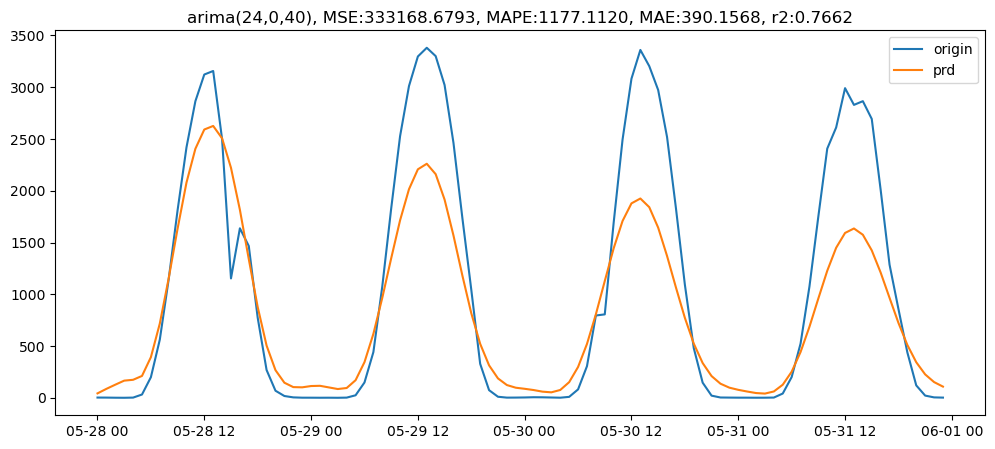

In [47]:
prd_prod24040_f = use_arima(df_prod0, p=24, d=0, q=40, scale=False)
prd_prod24040_t = use_arima(df_prod0, p=24, d=0, q=40, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

<class 'pandas.core.frame.DataFrame'>


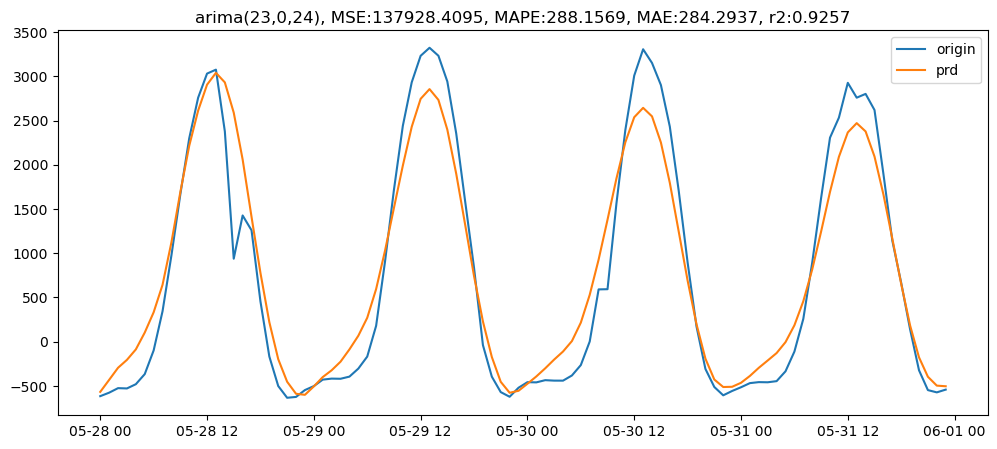

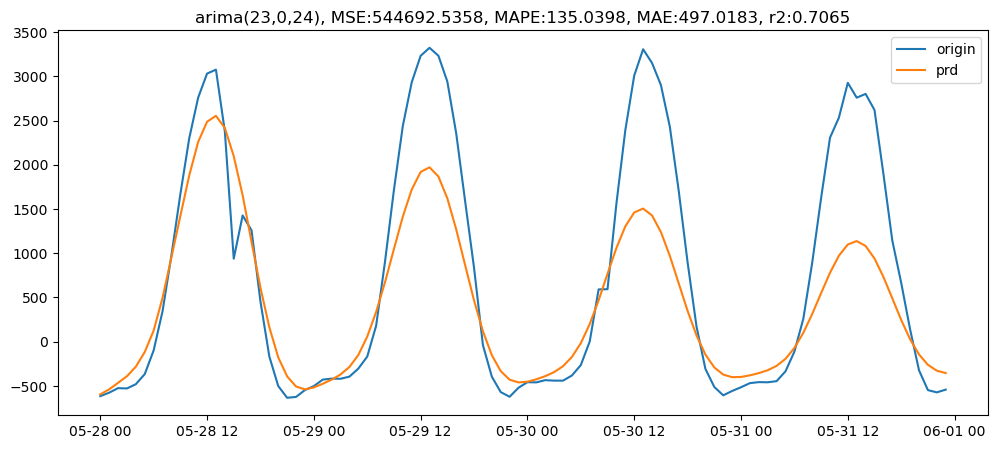

In [48]:
prd_pc23024_f = use_arima(df_pc0, p=23, d=0, q=24, scale=False)
prd_pc23024_t = use_arima(df_pc0, p=23, d=0, q=24, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

<class 'pandas.core.frame.DataFrame'>


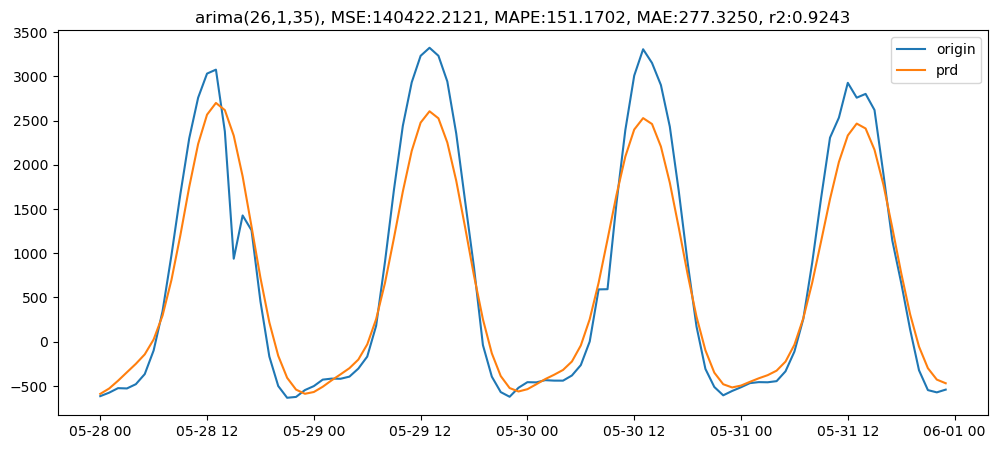

In [49]:
prd_pc26135_t = use_arima(df_pc0, p=26, d=1, q=35, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

<class 'pandas.core.frame.DataFrame'>


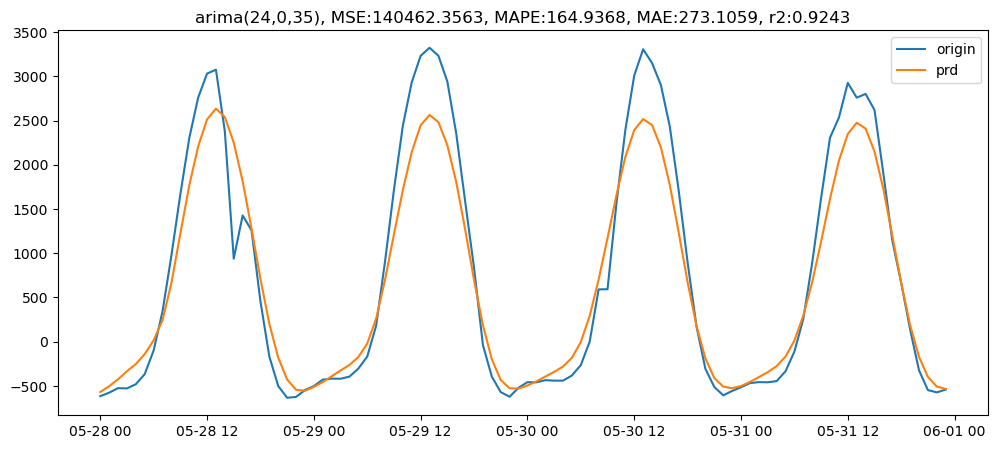

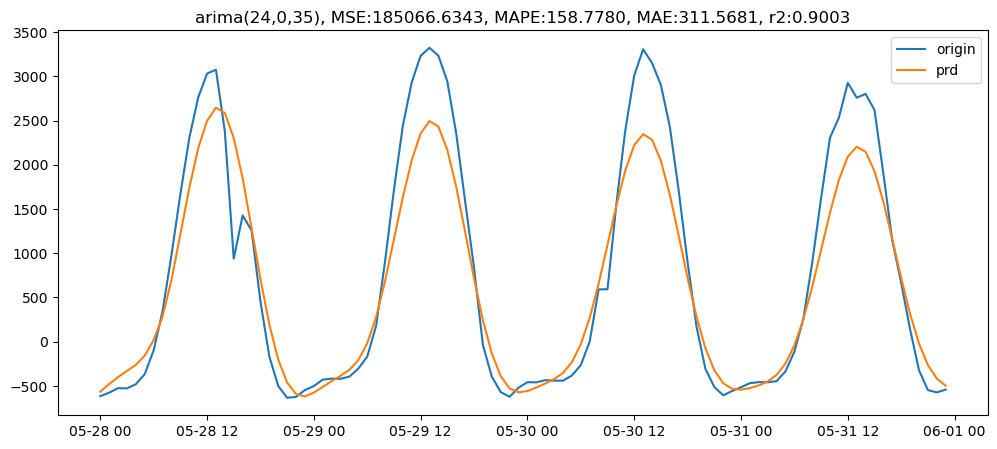

In [50]:
prd_pc24035_f = use_arima(df_pc0, p=24, d=0, q=35, scale=False)
prd_pc24035_t = use_arima(df_pc0, p=24, d=0, q=35, scale=True)

checkpoint 이 이후부터 다시 보기

In [51]:
prd_prod2408_f = use_arima(df_prod0, p=24, d=0, q=8, scale=False)
prd_prod2408_t = use_arima(df_prod0, p=24, d=0, q=8, scale=True)

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


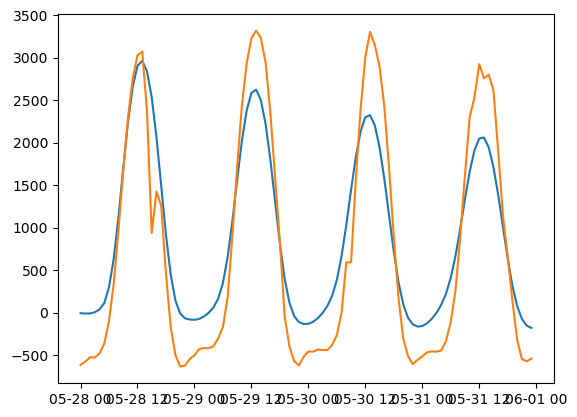

In [69]:
prd_pc0 = prd_prod2408_f
tst = df_pc0[-96:]
plt.plot(prd_pc0, label='prd')
plt.plot(tst.target, label='origin')

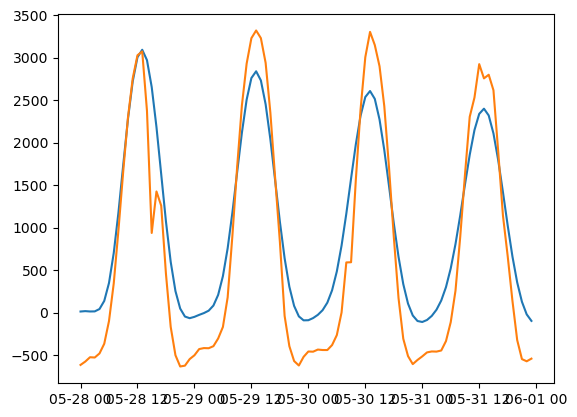

In [67]:
prd_prod0 = prd_prod2408_t
tst = df_pc0[-96:]
plt.plot(prd_prod0, label='prd')
plt.plot(tst.target, label='origin')

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

<class 'pandas.core.frame.DataFrame'>


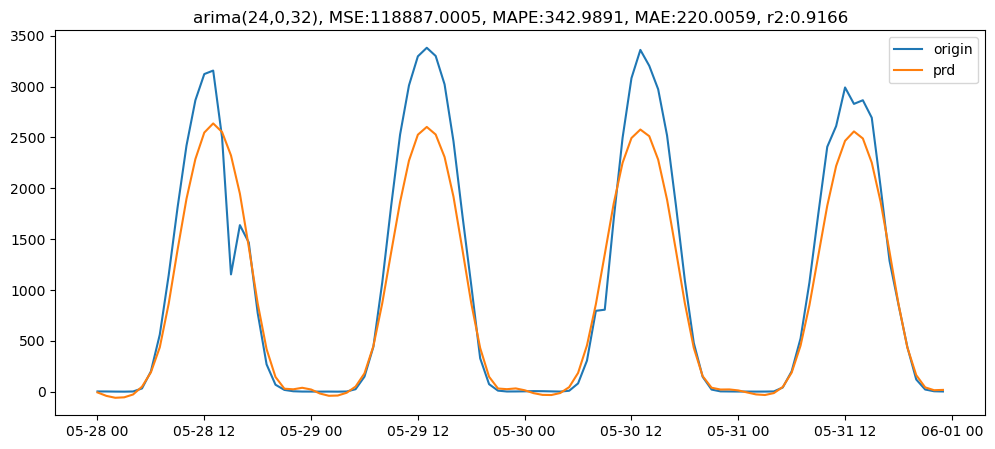

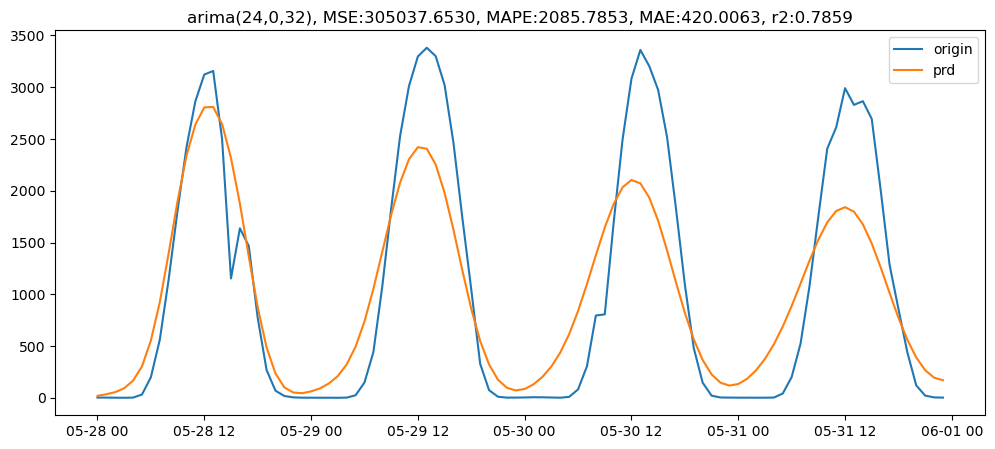

In [52]:
prd_prod24032_f = use_arima(df_prod0, p=24, d=0, q=32, scale=False)
prd_prod24032_t = use_arima(df_prod0, p=24, d=0, q=32, scale=True)

prod: (23, 0, 40), (24, 0, 40)

cons: (24, 1, 24)

In [53]:
prd_prod23040_f

2023-05-28 00:00:00     13.468062
2023-05-28 01:00:00     20.183187
2023-05-28 02:00:00     27.985910
2023-05-28 03:00:00     31.802681
2023-05-28 04:00:00     17.860753
                          ...    
2023-05-31 19:00:00    499.499063
2023-05-31 20:00:00    203.850223
2023-05-31 21:00:00     22.375574
2023-05-31 22:00:00    -51.338721
2023-05-31 23:00:00    -45.836694
Freq: H, Name: predicted_mean, Length: 96, dtype: float64

In [54]:
prd_prod24040_f

2023-05-28 00:00:00     18.262272
2023-05-28 01:00:00     29.947605
2023-05-28 02:00:00     34.646089
2023-05-28 03:00:00     28.864402
2023-05-28 04:00:00     23.398812
                          ...    
2023-05-31 19:00:00    522.074028
2023-05-31 20:00:00    231.284858
2023-05-31 21:00:00     55.976229
2023-05-31 22:00:00    -19.331331
2023-05-31 23:00:00    -27.477273
Freq: H, Name: predicted_mean, Length: 96, dtype: float64

/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/home/estsoft/miniconda3/envs/leejo/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/estsoft/miniconda3/envs/leejo/lib/python

2023-05-28 00:00:00    585.190244
2023-05-28 01:00:00    537.361513
2023-05-28 02:00:00    507.957720
2023-05-28 03:00:00    495.767080
2023-05-28 04:00:00    467.665538
                          ...    
2023-05-31 19:00:00    368.736762
2023-05-31 20:00:00    471.726624
2023-05-31 21:00:00    569.633365
2023-05-31 22:00:00    621.477172
2023-05-31 23:00:00    608.671092
Freq: H, Name: predicted_mean, Length: 96, dtype: float64

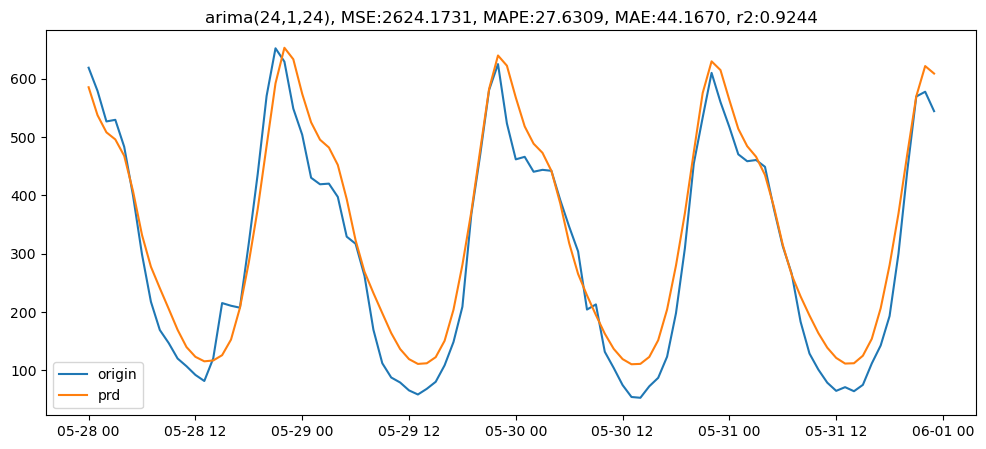

In [70]:
prd_cons24124_f = use_arima(df_cons0, p=24, d=1, q=24, scale=False)
prd_cons24124_f

In [72]:
def prd_pc(prd_prod0, prd_cons0):
    prd_prod0 = pd.DataFrame(prd_prod0)
    prd_cons0 = pd.DataFrame(prd_cons0)
    prd_pc0 = prd_prod0.predicted_mean- prd_cons0.predicted_mean

    tst_size = 96
    tst = df_pc0[-tst_size:].target

    plt.figure(figsize=(12,5))
    plt.plot(tst, label='origin')
    plt.plot(prd_pc0, label='prd')
    plt.legend()
    plt.title(f'arima, MSE:{mse(tst, prd_pc0):.4f}, MAPE:{mape(tst, prd_pc0)*100:.4f}, MAE:{mae(tst, prd_pc0):.4f}, r2:{r2_score(tst, prd_pc0):.4f}')

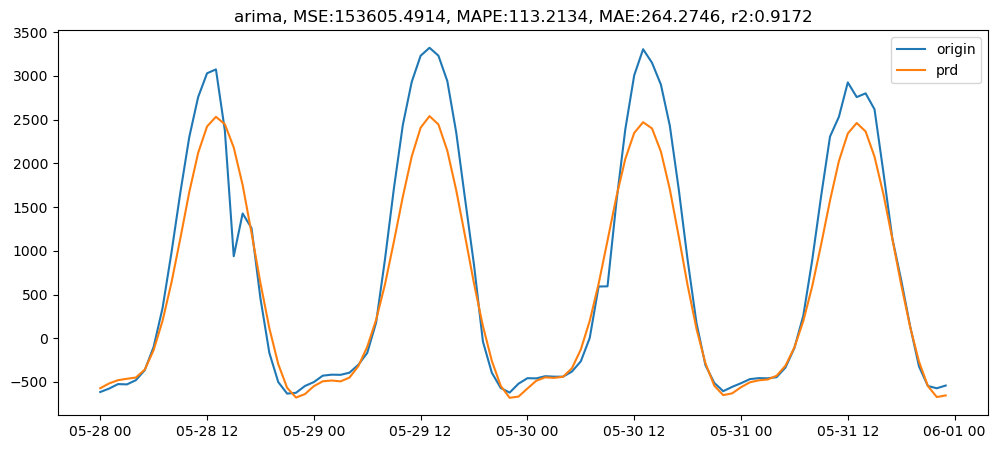

In [73]:
prd_pc(prd_prod23040_f, prd_cons24124_f)

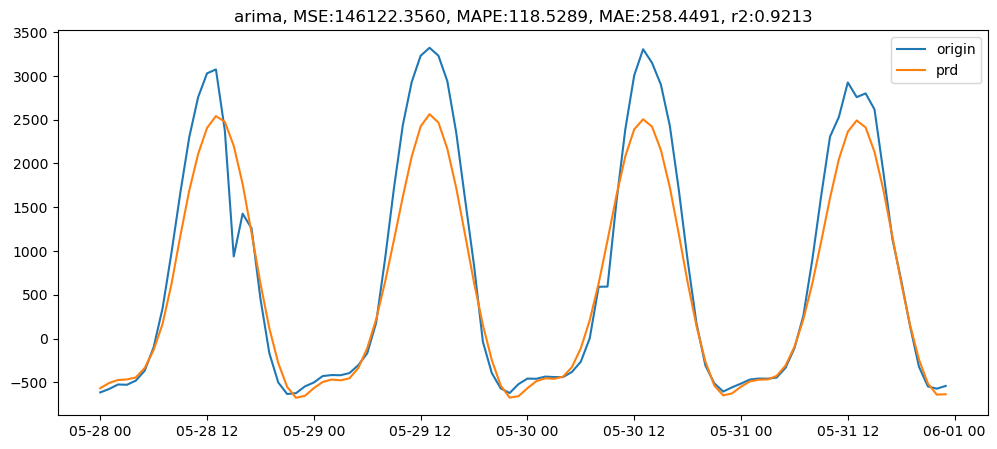

In [74]:
prd_pc(prd_prod24040_f, prd_cons24124_f)